<a href="https://colab.research.google.com/github/joseDorronsoro/Algorithm-Analysis-and-Design/blob/master/Copy_of_neuralcollapse.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Neural Collapse Examples

Code demonstrating Neural Collapse on Cross-Entropy [1] and MSE Loss [2].
Notebook is designed to be short, easy-to-interpret, and executable
from the browser using Google Colab.

MNIST-ResNet18 was chosen because it ran most reliably within the in-browser
memory constraints of Google Colab.
If you are *still* getting out-of-memory errors, try clicking
"Runtime"->"Factory Reset Runtime" on the menu bar.

It should be clear how to adapt the code to other networks-dataset combinations
to be run on local clusters with more memory.

### References:

[1] V. Papyan, X.Y. Han, and D.L. Donoho. "[Prevalence of Neural Collapse During the Terminal Phase of Deep Learning Training.](https://www.pnas.org/content/117/40/24652)" *Proceedings of the National Academy of Sciences (PNAS)* 117, no. 40 (2020): 24652-24663.

[2] X.Y. Han, V. Papyan, and D.L. Donoho. [“Neural Collapse Under MSE Loss: Proximity to and Dynamics on the Central Path.”](https://openreview.net/forum?id=w1UbdvWH_R3) *International Conference on Learning Representations (ICLR)*, 2022.


In [1]:
import torch
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

import gc
import numpy as np
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.models as models

from tqdm import tqdm
from collections import OrderedDict
from scipy.sparse.linalg import svds
from torchvision import datasets, transforms
from IPython import embed

debug = True # Only runs 20 batches per epoch for debugging

# dataset parameters
im_size             = 28
padded_im_size      = 32
C                   = 10
input_ch            = 1

# Optimization Criterion
# loss_name = 'CrossEntropyLoss'
loss_name = 'MSELoss'

# Optimization hyperparameters
lr_decay            = 0.1

# Best lr after hyperparameter tuning
if loss_name == 'CrossEntropyLoss':
  lr = 0.0679
elif loss_name == 'MSELoss':
  lr = 0.0184

epochs              = 350
epochs_lr_decay     = [epochs//3, epochs*2//3]

batch_size          = 128

momentum            = 0.9
weight_decay        = 5e-4

# analysis parameters
epoch_list          = [1,   2,   3,   4,   5,   6,   7,   8,   9,   10,   11,
                       12,  13,  14,  16,  17,  19,  20,  22,  24,  27,   29,
                       32,  35,  38,  42,  45,  50,  54,  59,  65,  71,   77,
                       85,  92,  101, 110, 121, 132, 144, 158, 172, 188,  206,
                       225, 245, 268, 293, 320, 350]

In [2]:
def train(model, criterion, device, num_classes, train_loader, optimizer, epoch):
    model.train()

    pbar = tqdm(total=len(train_loader), position=0, leave=True)
    for batch_idx, (data, target) in enumerate(train_loader, start=1):
        if data.shape[0] != batch_size:
            continue

        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        out = model(data)
        if str(criterion) == 'CrossEntropyLoss()':
          loss = criterion(out, target)
        elif str(criterion) == 'MSELoss()':
          loss = criterion(out, F.one_hot(target, num_classes=num_classes).float())

        loss.backward()
        optimizer.step()

        accuracy = torch.mean((torch.argmax(out,dim=1)==target).float()).item()

        pbar.update(1)
        pbar.set_description(
            'Train\t\tEpoch: {} [{}/{} ({:.0f}%)] \t'
            'Batch Loss: {:.6f} \t'
            'Batch Accuracy: {:.6f}'.format(
                epoch,
                batch_idx,
                len(train_loader),
                100. * batch_idx / len(train_loader),
                loss.item(),
                accuracy))

        if debug and batch_idx > 20:
          break
    pbar.close()

In [3]:
def analysis(graphs, model, criterion_summed, device, num_classes, loader):
    model.eval()

    N             = [0 for _ in range(C)]
    mean          = [0 for _ in range(C)]
    Sw            = 0

    loss          = 0
    net_correct   = 0
    NCC_match_net = 0

    for computation in ['Mean','Cov']:
        pbar = tqdm(total=len(loader), position=0, leave=True)
        for batch_idx, (data, target) in enumerate(loader, start=1):

            data, target = data.to(device), target.to(device)

            output = model(data)
            h = features.value.data.view(data.shape[0],-1) # B CHW

            # during calculation of class means, calculate loss
            if computation == 'Mean':
                if str(criterion_summed) == 'CrossEntropyLoss()':
                  loss += criterion_summed(output, target).item()
                elif str(criterion_summed) == 'MSELoss()':
                  loss += criterion_summed(output, F.one_hot(target, num_classes=num_classes).float()).item()

            for c in range(C):
                # features belonging to class c
                idxs = (target == c).nonzero(as_tuple=True)[0]

                if len(idxs) == 0: # If no class-c in this batch
                  continue

                h_c = h[idxs,:] # B CHW

                if computation == 'Mean':
                    # update class means
                    mean[c] += torch.sum(h_c, dim=0) # CHW
                    N[c] += h_c.shape[0]

                elif computation == 'Cov':
                    # update within-class cov

                    z = h_c - mean[c].unsqueeze(0) # B CHW
                    cov = torch.matmul(z.unsqueeze(-1), # B CHW 1
                                       z.unsqueeze(1))  # B 1 CHW
                    Sw += torch.sum(cov, dim=0)

                    # during calculation of within-class covariance, calculate:
                    # 1) network's accuracy
                    net_pred = torch.argmax(output[idxs,:], dim=1)
                    net_correct += sum(net_pred==target[idxs]).item()

                    # 2) agreement between prediction and nearest class center
                    NCC_scores = torch.stack([torch.norm(h_c[i,:] - M.T,dim=1) \
                                              for i in range(h_c.shape[0])])
                    NCC_pred = torch.argmin(NCC_scores, dim=1)
                    NCC_match_net += sum(NCC_pred==net_pred).item()

            pbar.update(1)
            pbar.set_description(
                'Analysis {}\t'
                'Epoch: {} [{}/{} ({:.0f}%)]'.format(
                    computation,
                    epoch,
                    batch_idx,
                    len(loader),
                    100. * batch_idx/ len(loader)))

            if debug and batch_idx > 20:
                break
        pbar.close()

        if computation == 'Mean':
            for c in range(C):
                mean[c] /= N[c]
                M = torch.stack(mean).T
            loss /= sum(N)
        elif computation == 'Cov':
            Sw /= sum(N)

    graphs.loss.append(loss)
    graphs.accuracy.append(net_correct/sum(N))
    graphs.NCC_mismatch.append(1-NCC_match_net/sum(N))

    # loss with weight decay
    reg_loss = loss
    for param in model.parameters():
        reg_loss += 0.5 * weight_decay * torch.sum(param**2).item()
    graphs.reg_loss.append(reg_loss)

    # global mean
    muG = torch.mean(M, dim=1, keepdim=True) # CHW 1

    # between-class covariance
    M_ = M - muG
    Sb = torch.matmul(M_, M_.T) / C

    # avg norm
    W  = classifier.weight
    M_norms = torch.norm(M_,  dim=0)
    W_norms = torch.norm(W.T, dim=0)

    graphs.norm_M_CoV.append((torch.std(M_norms)/torch.mean(M_norms)).item())
    graphs.norm_W_CoV.append((torch.std(W_norms)/torch.mean(W_norms)).item())

    # Decomposition of MSE #
    if loss_name == 'MSELoss':

      wd = 0.5 * weight_decay # "\lambda" in manuscript, so this is halved
      St = Sw+Sb
      size_last_layer = Sb.shape[0]
      eye_P = torch.eye(size_last_layer).to(device)
      eye_C = torch.eye(C).to(device)

      St_inv = torch.inverse(St + (wd/(wd+1))*(muG @ muG.T) + wd*eye_P)

      w_LS = 1 / C * (M.T - 1 / (1 + wd) * muG.T) @ St_inv
      b_LS = (1/C * torch.ones(C).to(device) - w_LS @ muG.T.squeeze(0)) / (1+wd)
      w_LS_ = torch.cat([w_LS, b_LS.unsqueeze(-1)], dim=1)  # c x n
      b  = classifier.bias
      w_ = torch.cat([W, b.unsqueeze(-1)], dim=1)  # c x n

      LNC1 = 0.5 * (torch.trace(w_LS @ (Sw + wd*eye_P) @ w_LS.T) + wd*torch.norm(b_LS)**2)
      LNC23 = 0.5/C * torch.norm(w_LS @ M + b_LS.unsqueeze(1) - eye_C) ** 2

      A1 = torch.cat([St + muG @ muG.T + wd*eye_P, muG], dim=1)
      A2 = torch.cat([muG.T, torch.ones([1,1]).to(device) + wd], dim=1)
      A = torch.cat([A1, A2], dim=0)
      Lperp = 0.5 * torch.trace((w_ - w_LS_) @ A @ (w_ - w_LS_).T)

      MSE_wd_features = loss + 0.5* weight_decay * (torch.norm(W)**2 + torch.norm(b)**2).item()
      MSE_wd_features *= 0.5

      graphs.MSE_wd_features.append(MSE_wd_features)
      graphs.LNC1.append(LNC1.item())
      graphs.LNC23.append(LNC23.item())
      graphs.Lperp.append(Lperp.item())

    # tr{Sw Sb^-1}
    Sw = Sw.cpu().numpy()
    Sb = Sb.cpu().numpy()
    eigvec, eigval, _ = svds(Sb, k=C-1)
    inv_Sb = eigvec @ np.diag(eigval**(-1)) @ eigvec.T
    graphs.Sw_invSb.append(np.trace(Sw @ inv_Sb))

    # ||W^T - M_||
    normalized_M = M_ / torch.norm(M_,'fro')
    normalized_W = W.T / torch.norm(W.T,'fro')
    graphs.W_M_dist.append((torch.norm(normalized_W - normalized_M)**2).item())

    # mutual coherence
    def coherence(V):
        G = V.T @ V
        G += torch.ones((C,C),device=device) / (C-1)
        G -= torch.diag(torch.diag(G))
        return torch.norm(G,1).item() / (C*(C-1))

    graphs.cos_M.append(coherence(M_/M_norms))
    graphs.cos_W.append(coherence(W.T/W_norms))

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=None`.
  warnings.warn(msg)


Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:00<00:00, 13908943.97it/s]


Extracting ../data/MNIST/raw/train-images-idx3-ubyte.gz to ../data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 467135.44it/s]


Extracting ../data/MNIST/raw/train-labels-idx1-ubyte.gz to ../data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:00<00:00, 2113263.47it/s]


Extracting ../data/MNIST/raw/t10k-images-idx3-ubyte.gz to ../data/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 10269826.83it/s]


Extracting ../data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ../data/MNIST/raw



Train		Epoch: 1 [21/469 (4%)] 	Batch Loss: 0.116657 	Batch Accuracy: 0.328125:   4%|▍         | 21/469 [00:05<01:54,  3.93it/s]
Analysis Cov	Epoch: 1 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:44, 10.05it/s]


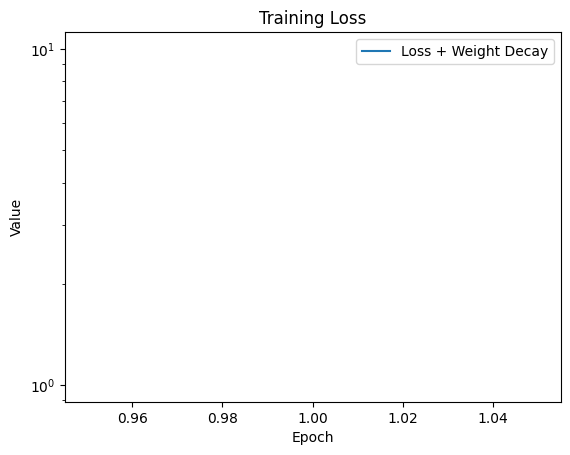

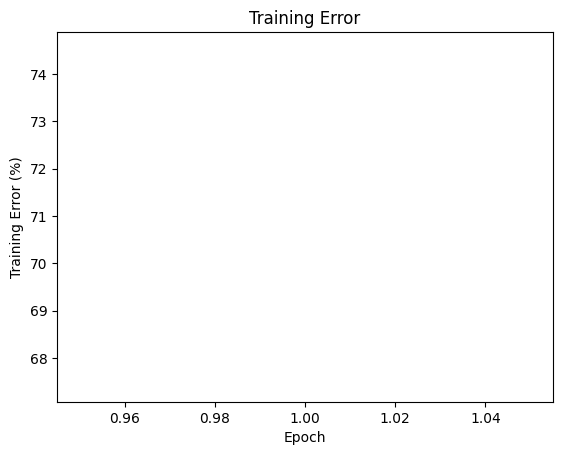

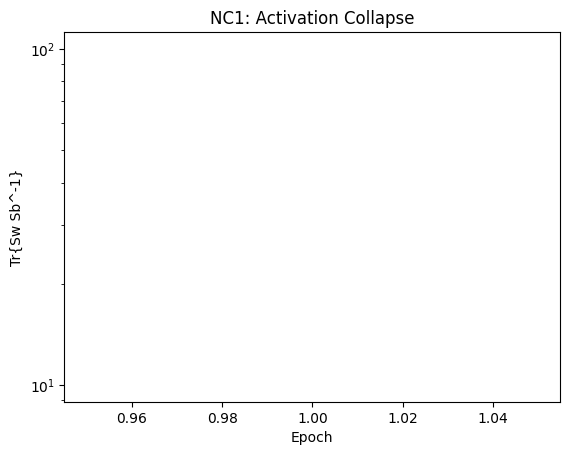

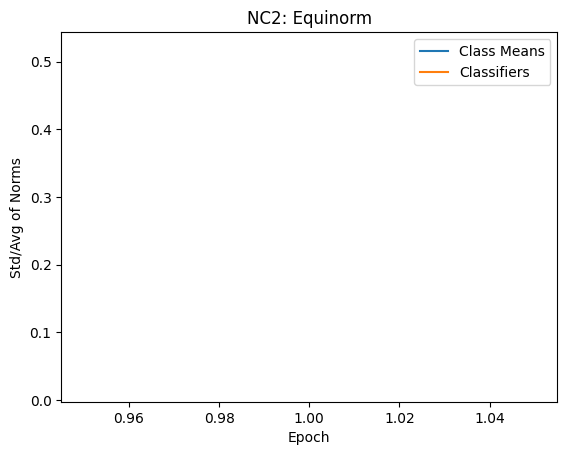

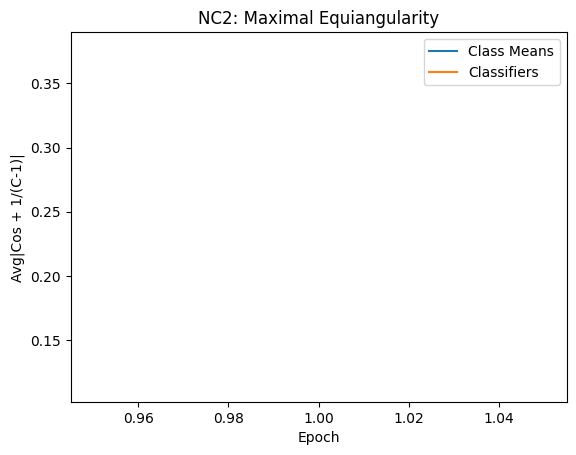

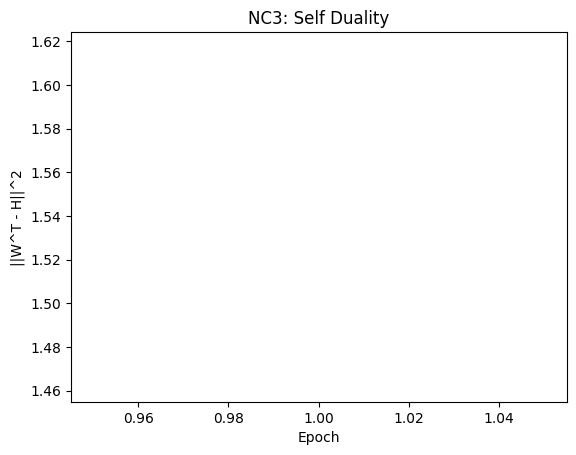

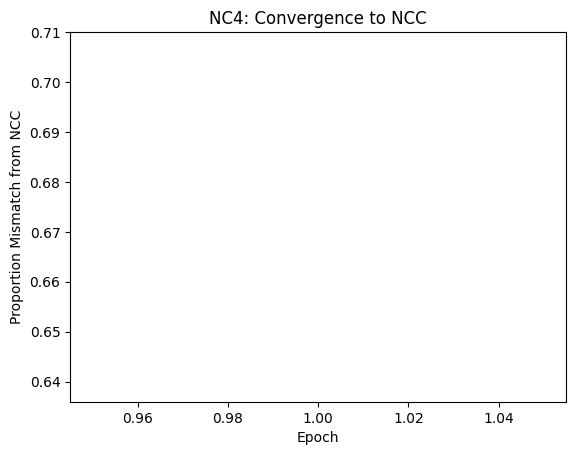

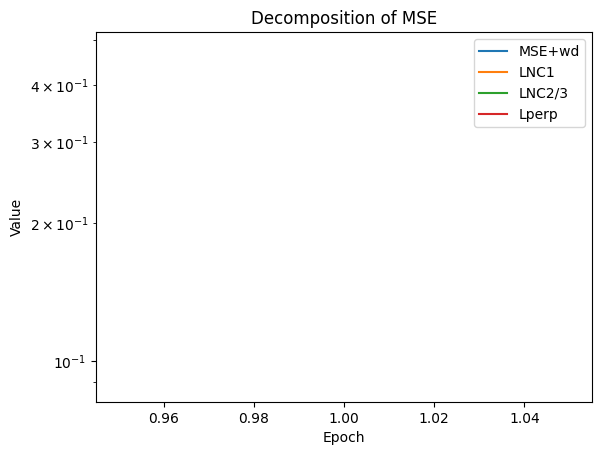

Train		Epoch: 2 [21/469 (4%)] 	Batch Loss: 0.055238 	Batch Accuracy: 0.750000:   4%|▍         | 21/469 [00:02<01:02,  7.17it/s]
Analysis Cov	Epoch: 2 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:42, 10.50it/s]


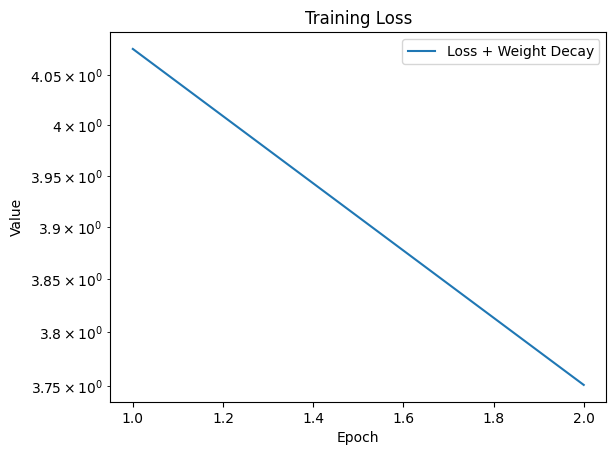

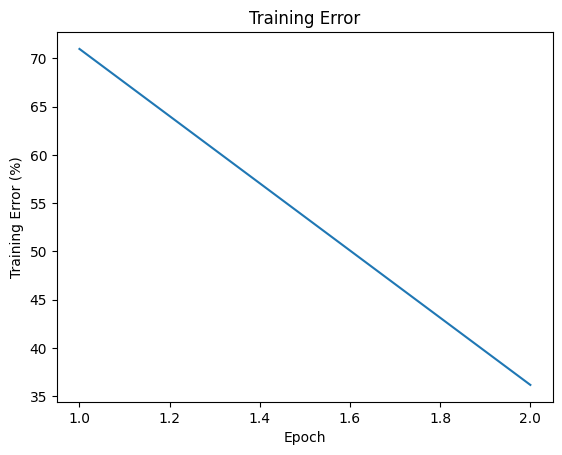

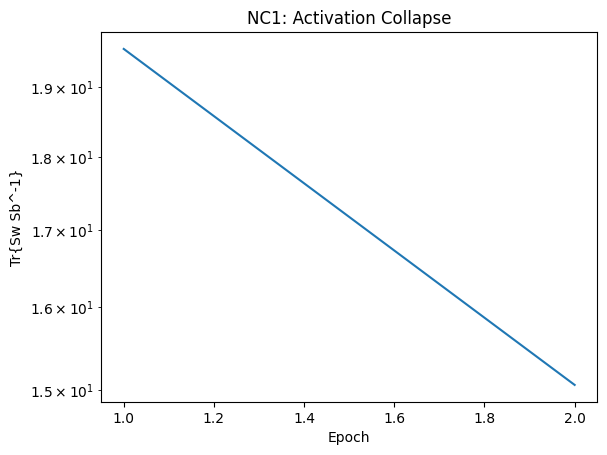

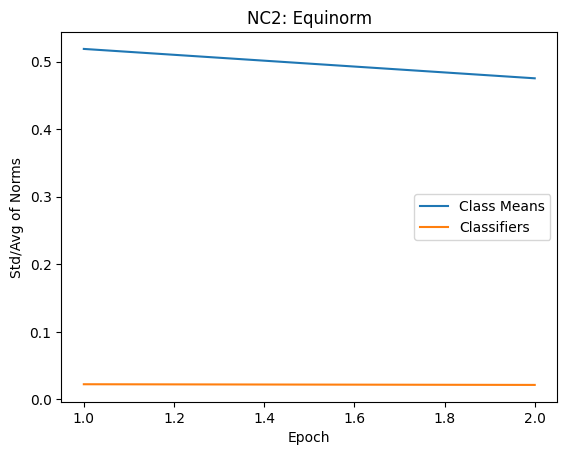

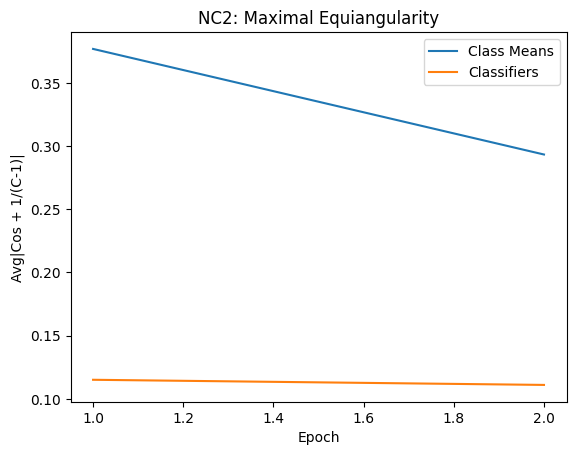

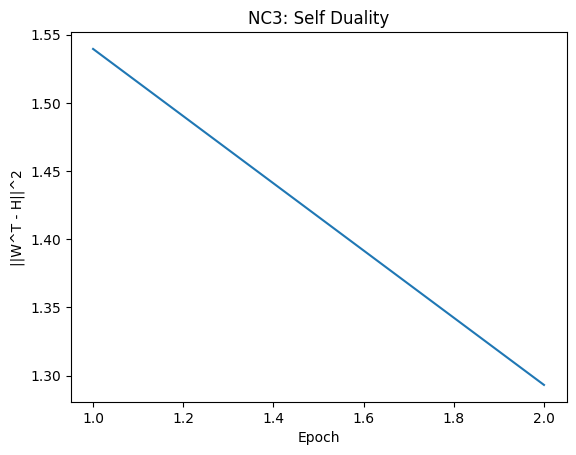

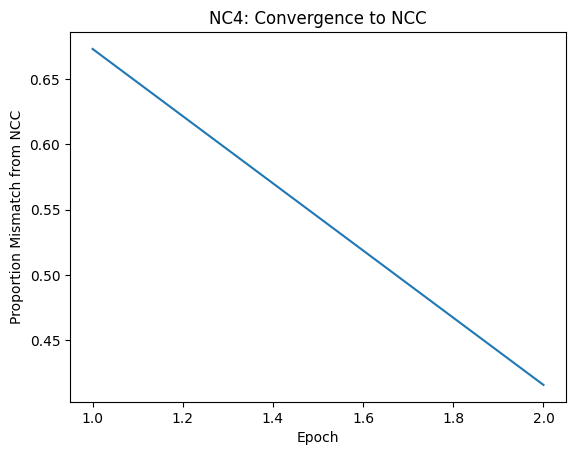

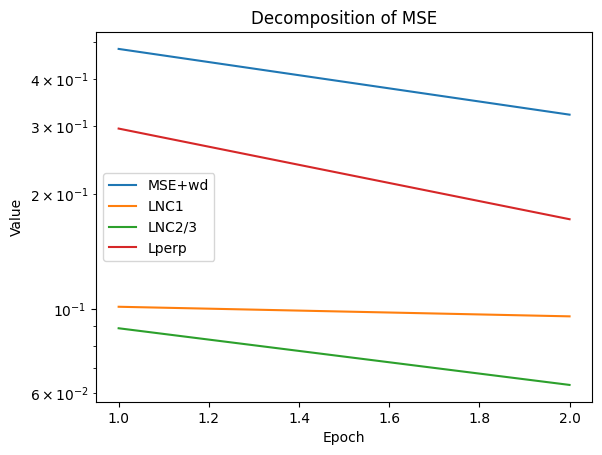

Train		Epoch: 3 [21/469 (4%)] 	Batch Loss: 0.045796 	Batch Accuracy: 0.820312:   4%|▍         | 21/469 [00:03<01:04,  6.95it/s]
Analysis Cov	Epoch: 3 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:36, 12.40it/s]


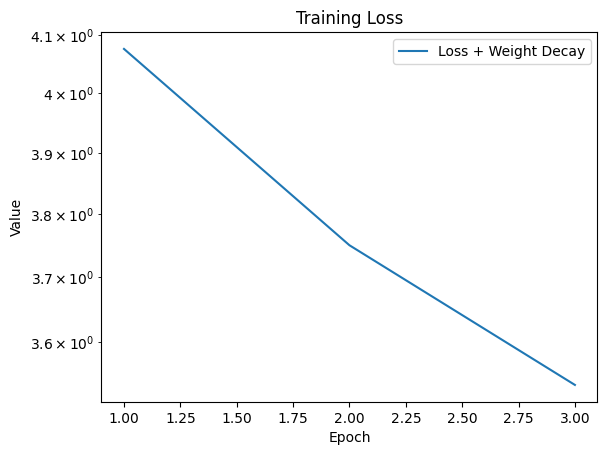

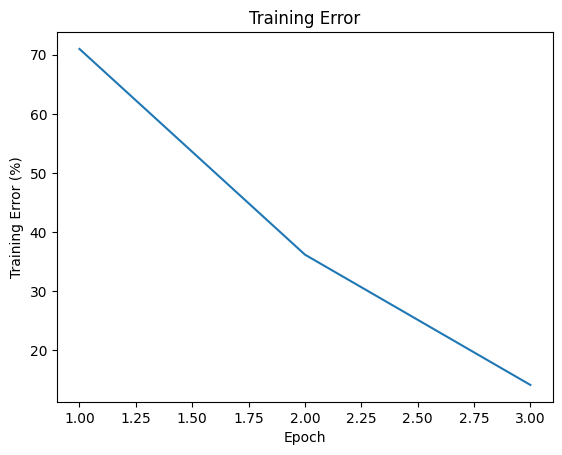

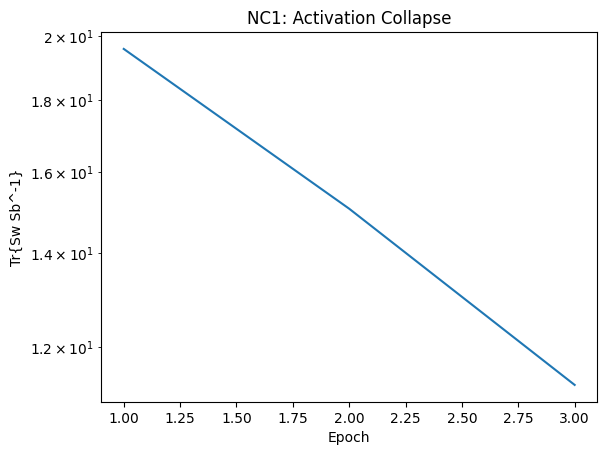

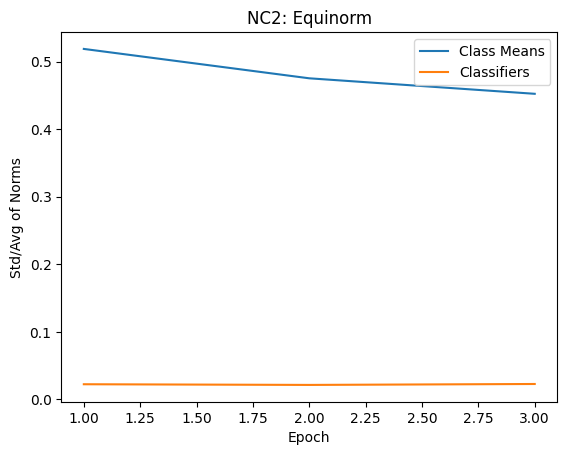

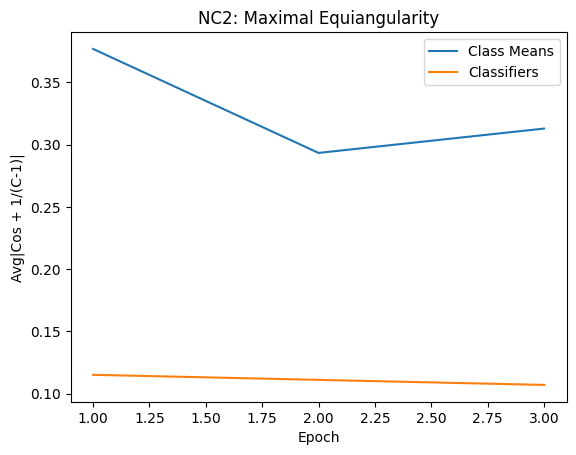

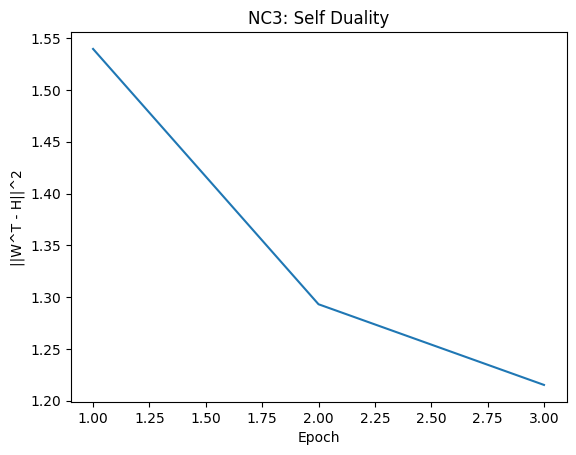

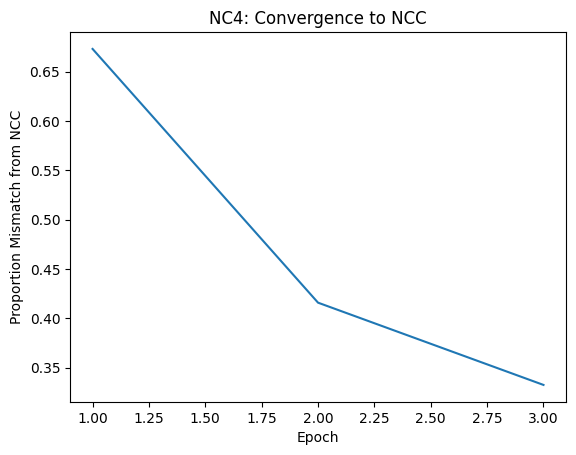

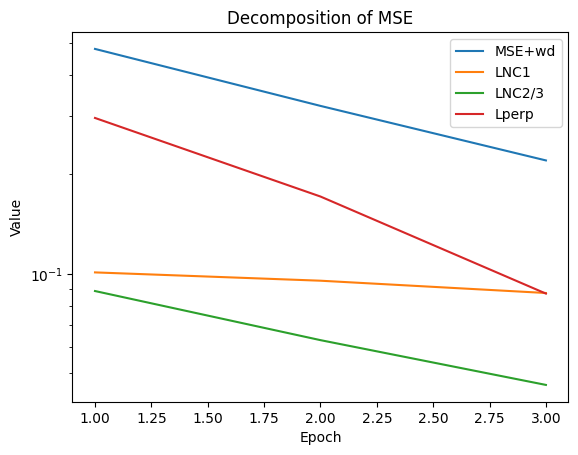

Train		Epoch: 4 [21/469 (4%)] 	Batch Loss: 0.046557 	Batch Accuracy: 0.867188:   4%|▍         | 21/469 [00:03<01:18,  5.74it/s]
Analysis Cov	Epoch: 4 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:37, 11.99it/s]


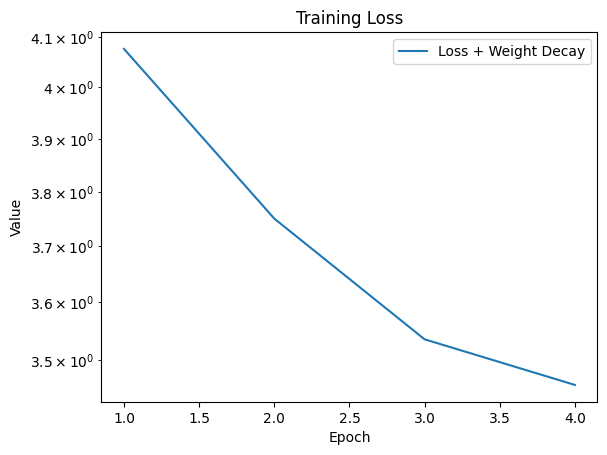

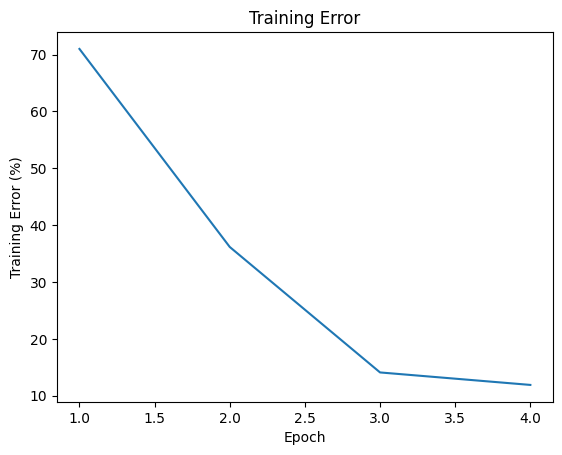

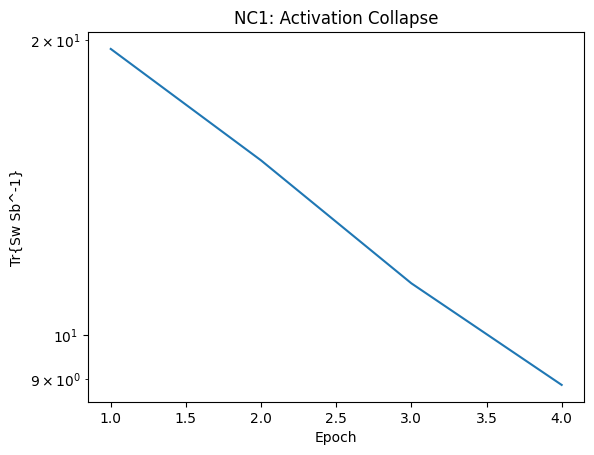

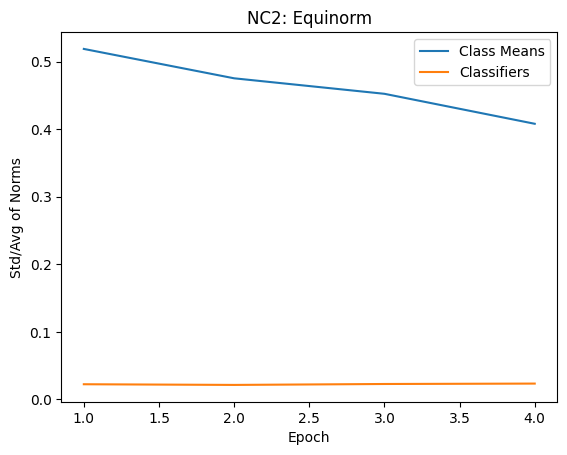

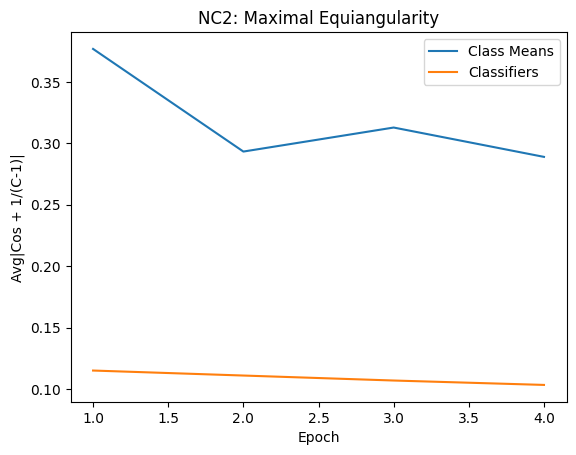

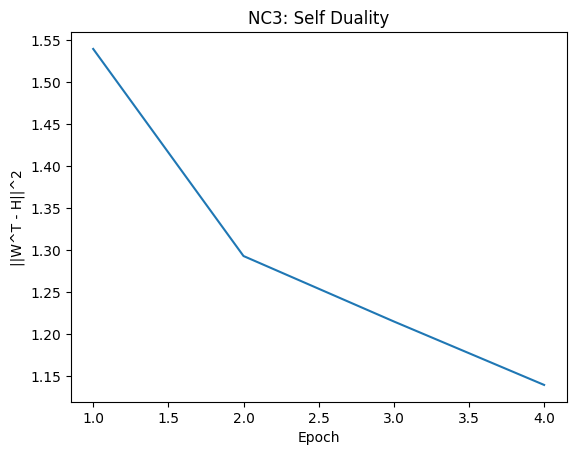

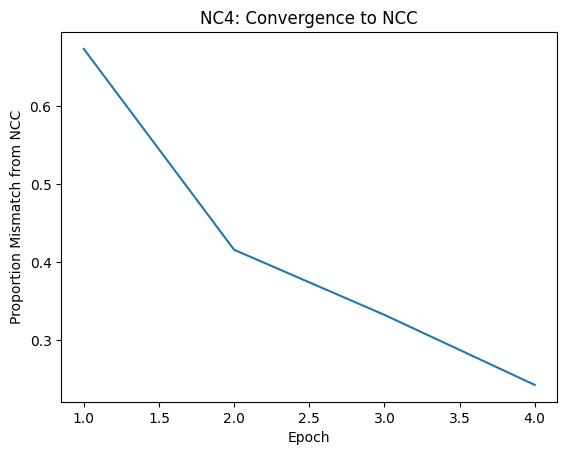

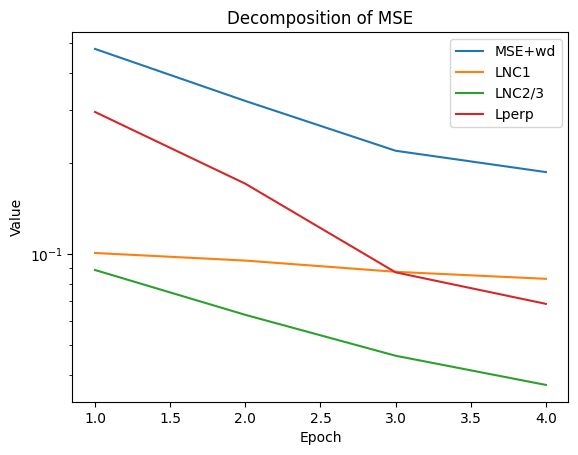

Train		Epoch: 5 [21/469 (4%)] 	Batch Loss: 0.035049 	Batch Accuracy: 0.906250:   4%|▍         | 21/469 [00:03<01:08,  6.54it/s]
Analysis Cov	Epoch: 5 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:37, 11.81it/s]


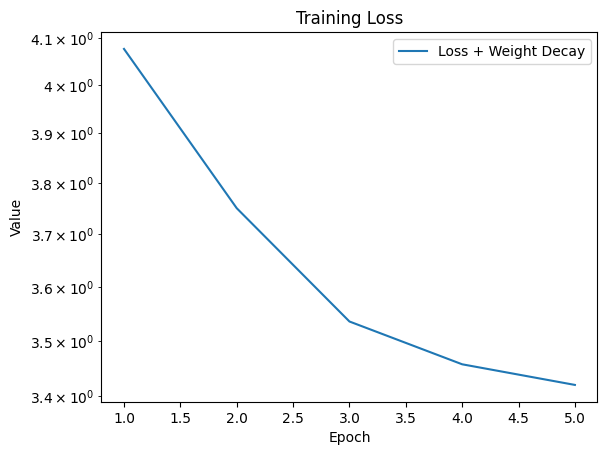

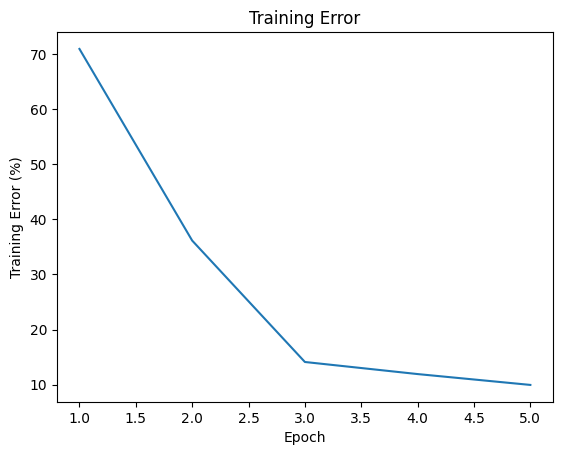

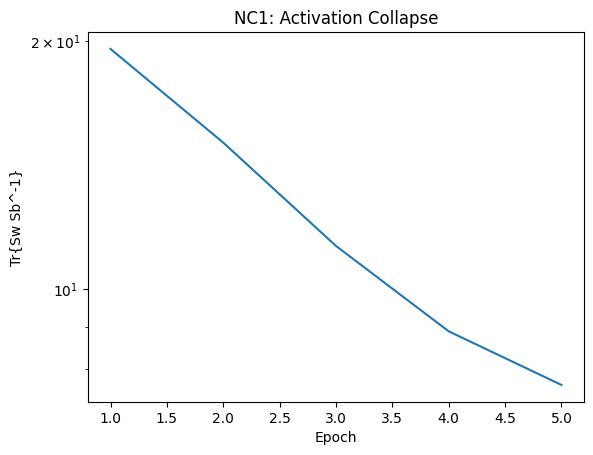

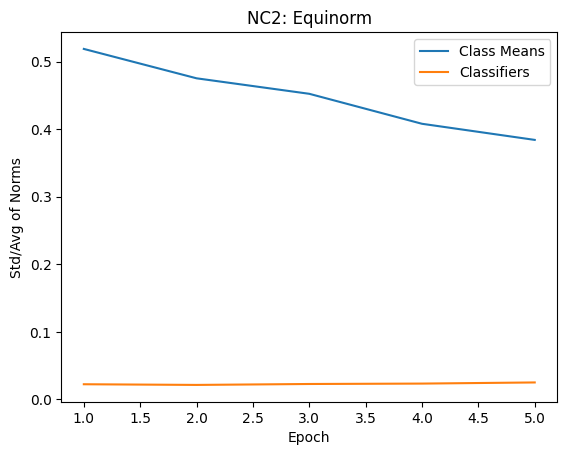

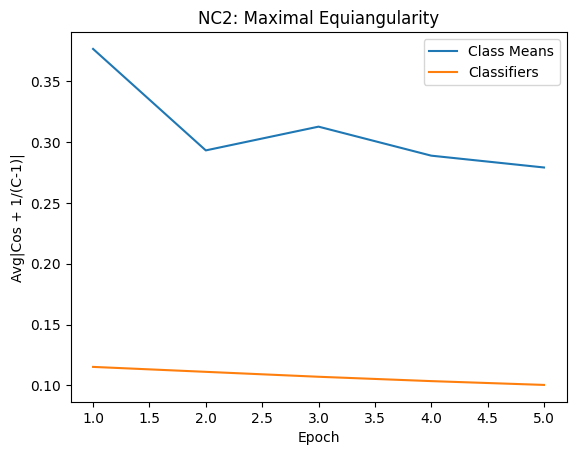

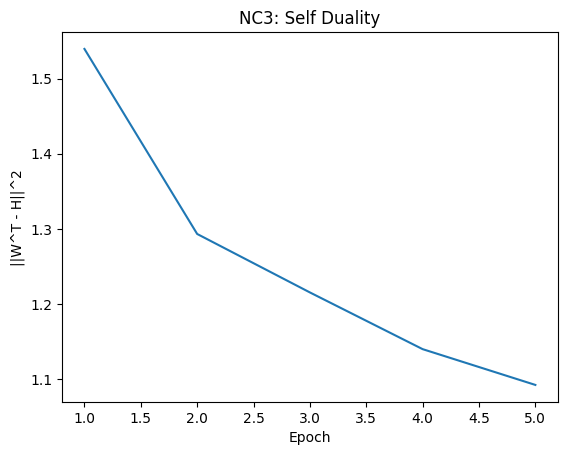

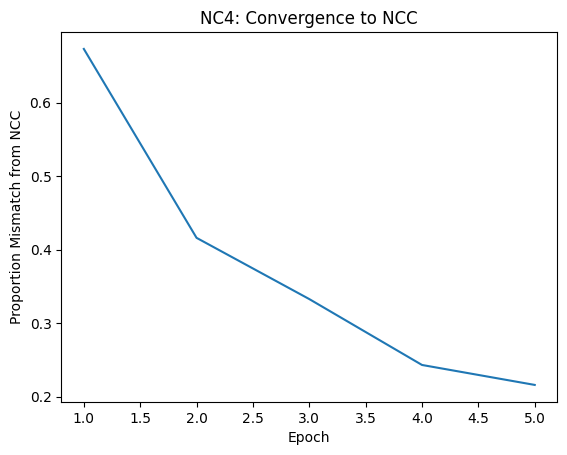

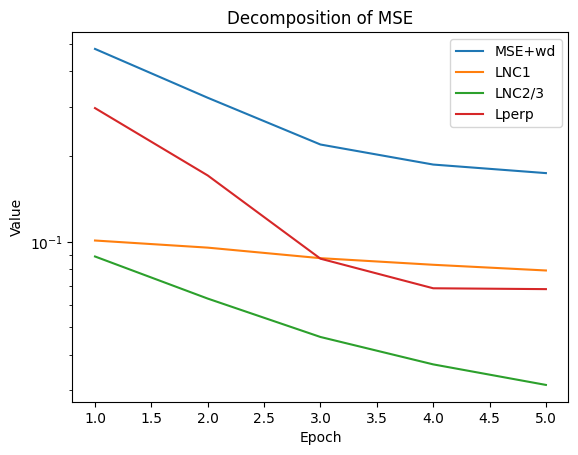

Train		Epoch: 6 [21/469 (4%)] 	Batch Loss: 0.032397 	Batch Accuracy: 0.890625:   4%|▍         | 21/469 [00:03<01:07,  6.64it/s]
Analysis Cov	Epoch: 6 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:43, 10.20it/s]


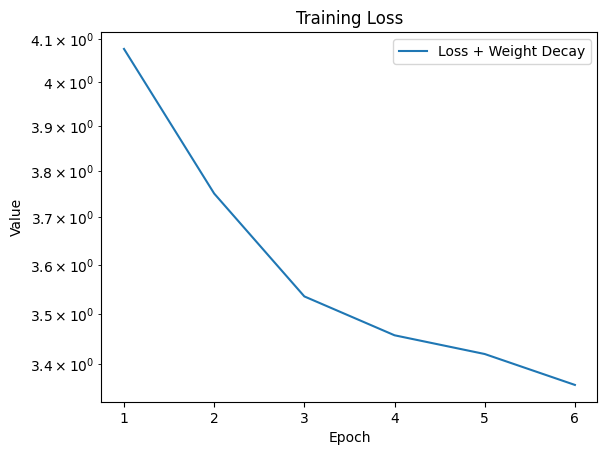

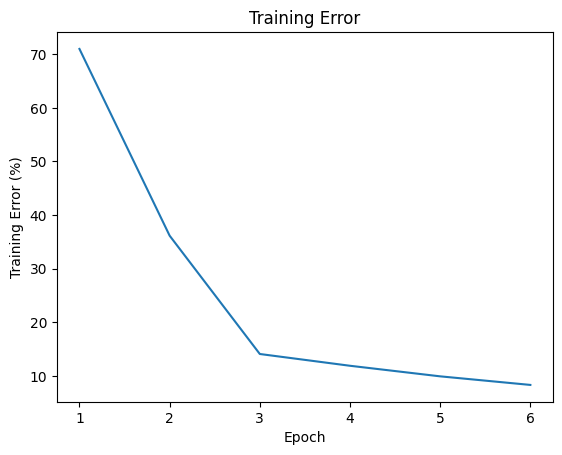

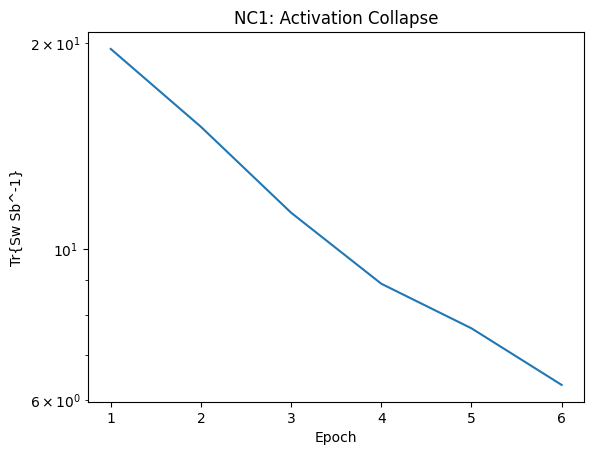

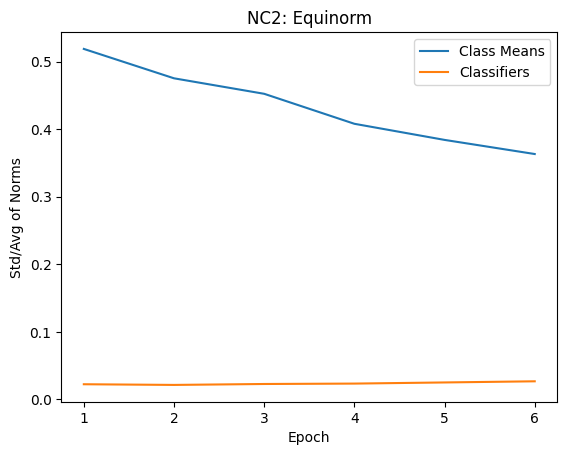

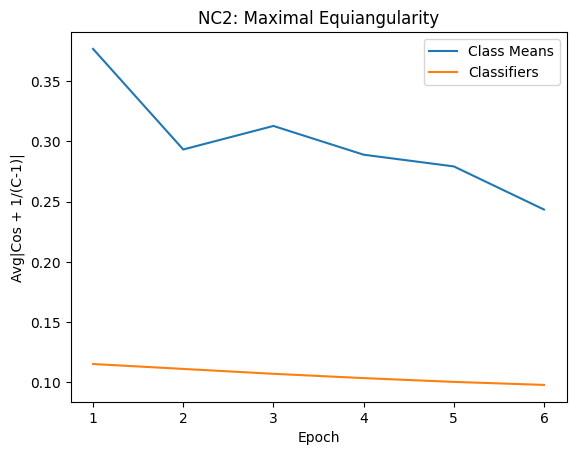

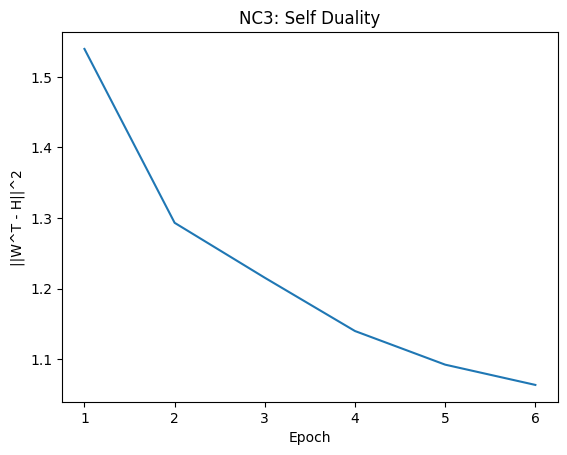

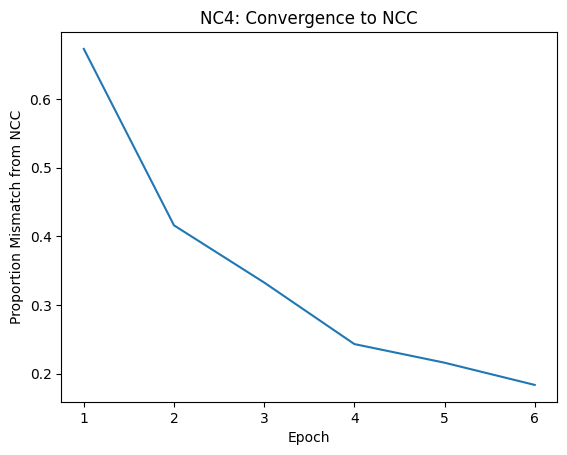

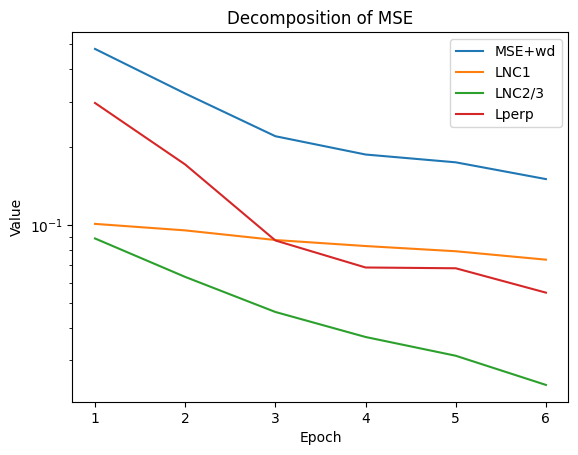

Train		Epoch: 7 [21/469 (4%)] 	Batch Loss: 0.031314 	Batch Accuracy: 0.937500:   4%|▍         | 21/469 [00:03<01:07,  6.60it/s]
Analysis Cov	Epoch: 7 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:39, 11.29it/s]


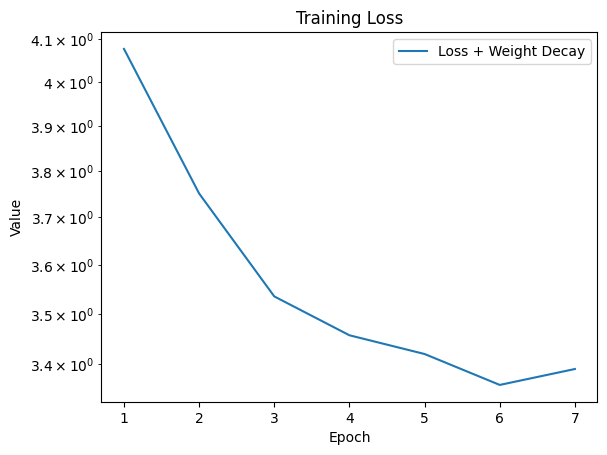

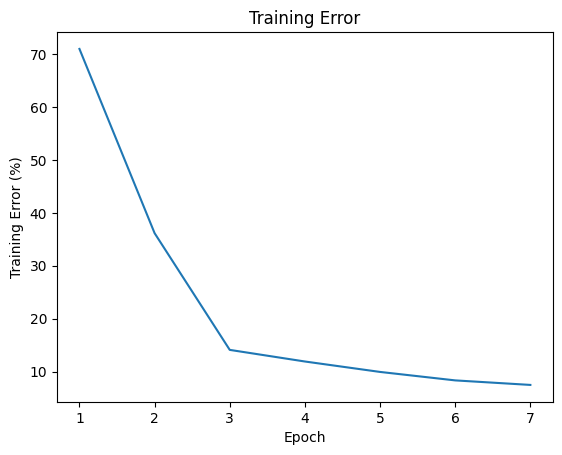

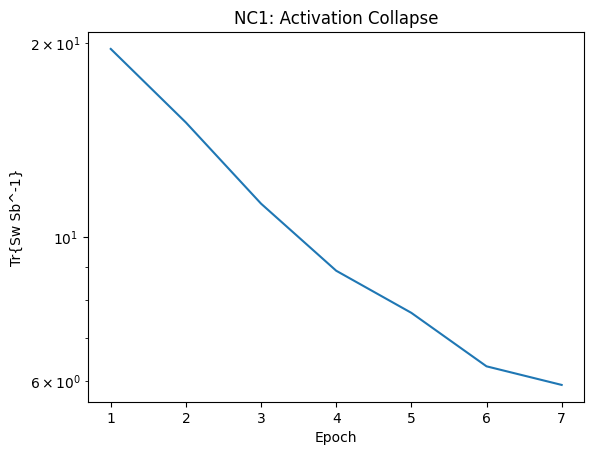

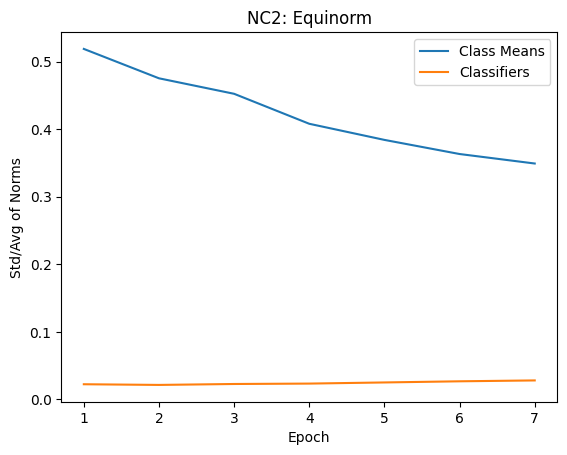

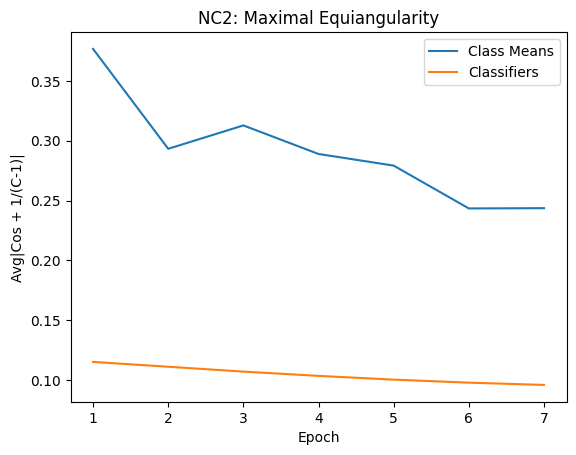

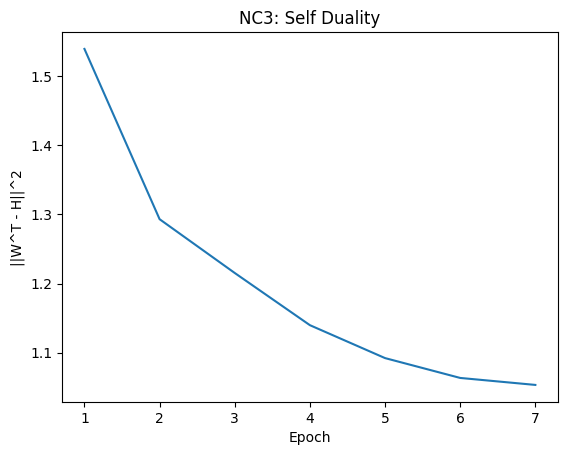

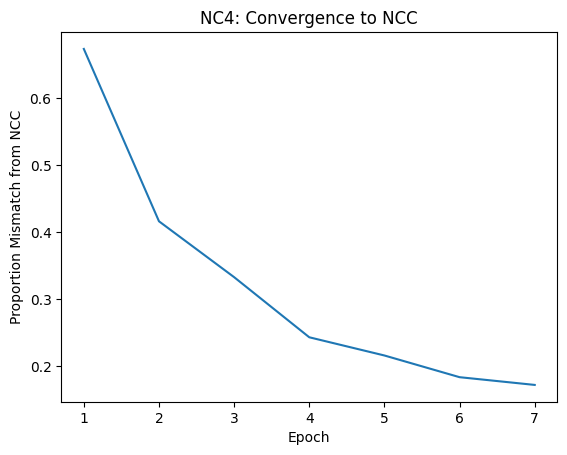

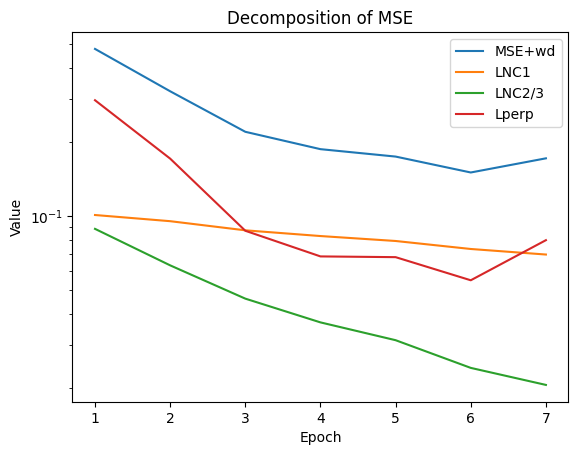

Train		Epoch: 8 [21/469 (4%)] 	Batch Loss: 0.029278 	Batch Accuracy: 0.921875:   4%|▍         | 21/469 [00:03<01:12,  6.16it/s]
Analysis Cov	Epoch: 8 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:39, 11.41it/s]


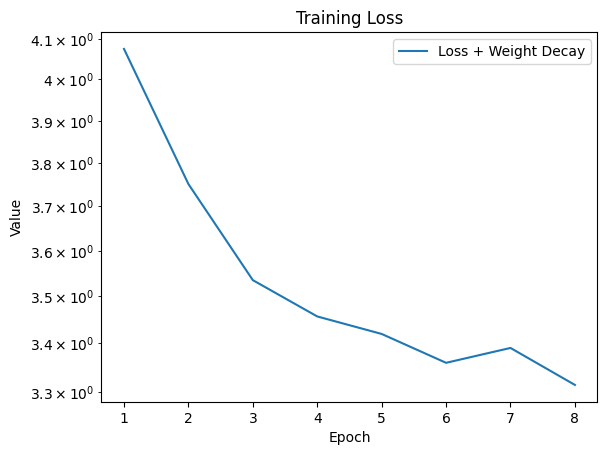

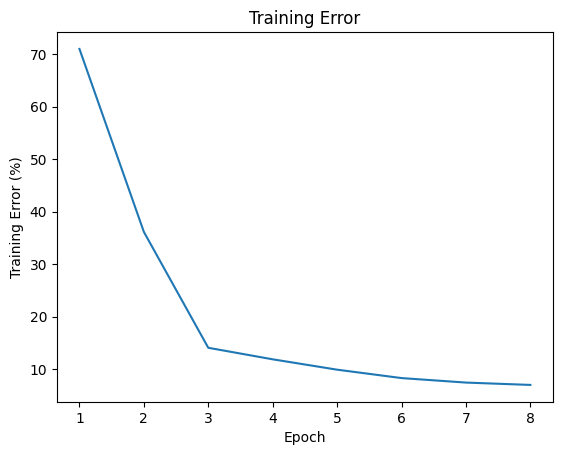

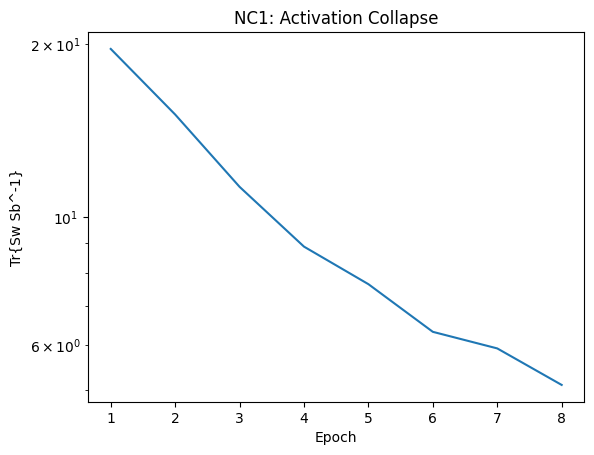

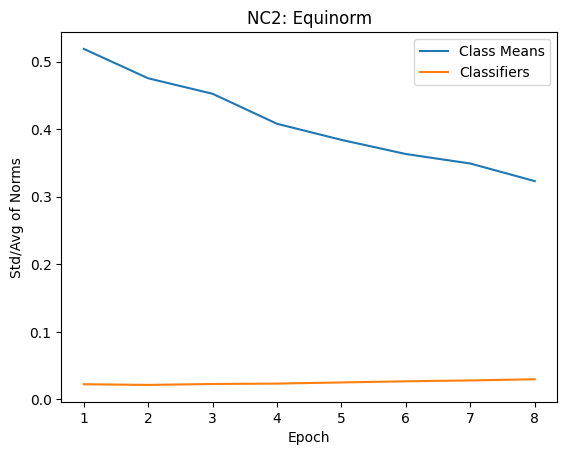

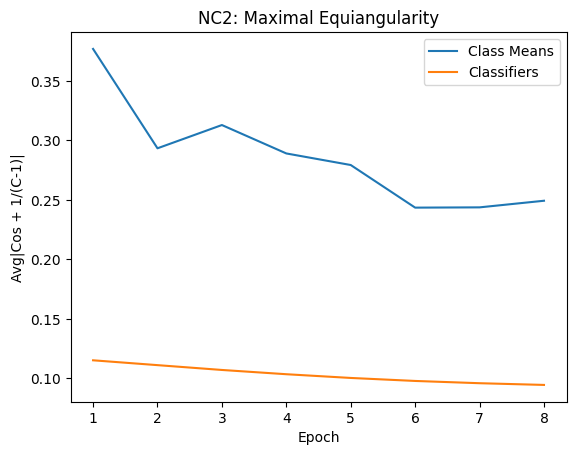

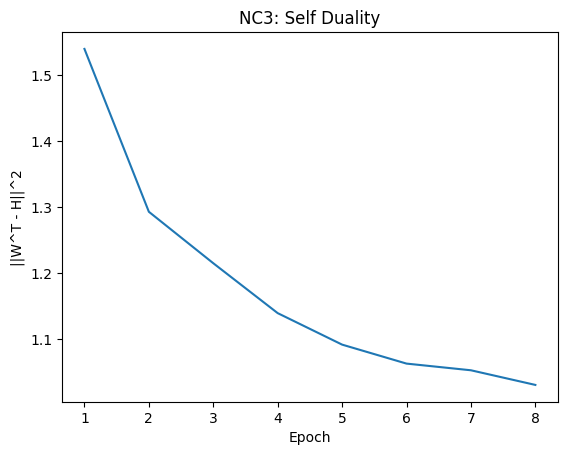

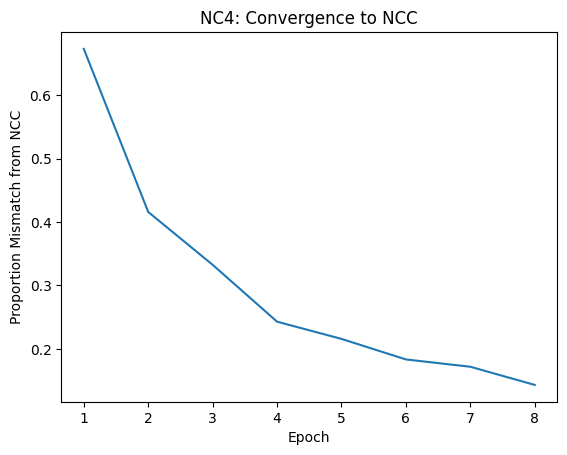

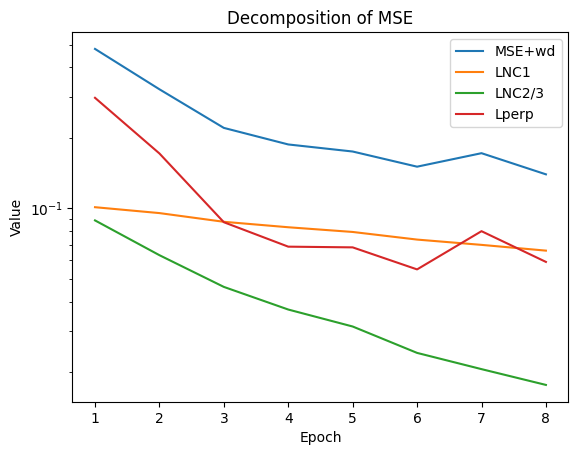

Train		Epoch: 9 [21/469 (4%)] 	Batch Loss: 0.030149 	Batch Accuracy: 0.921875:   4%|▍         | 21/469 [00:03<01:07,  6.62it/s]
Analysis Cov	Epoch: 9 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:45,  9.84it/s]


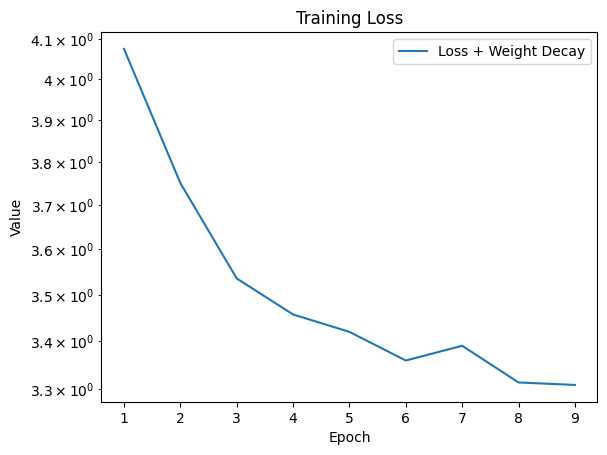

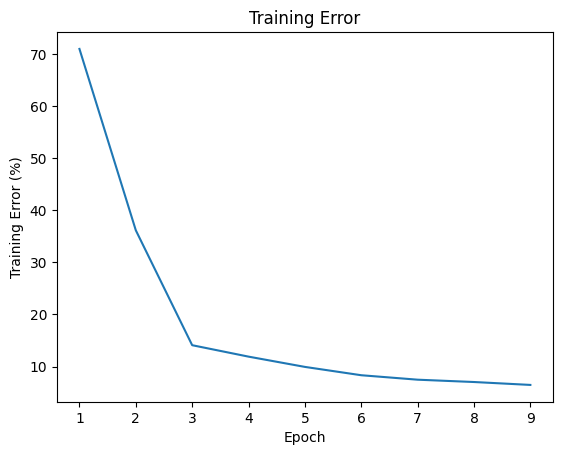

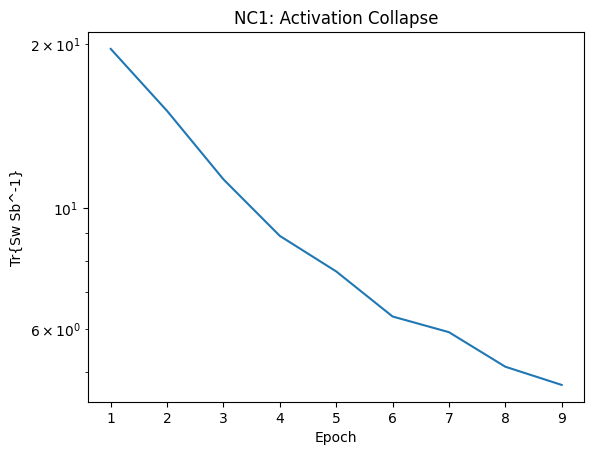

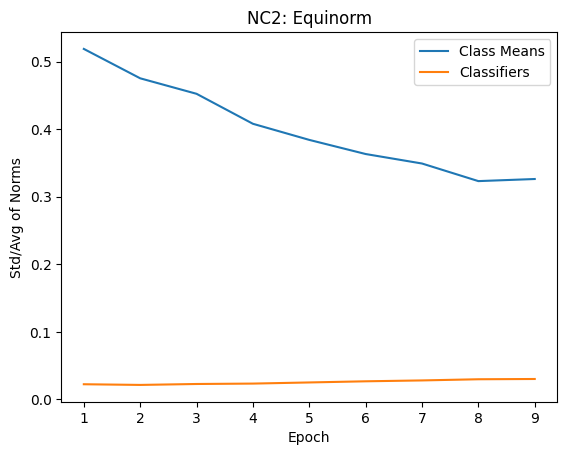

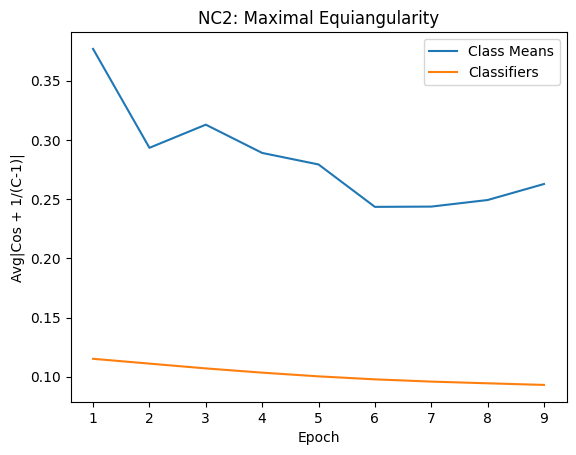

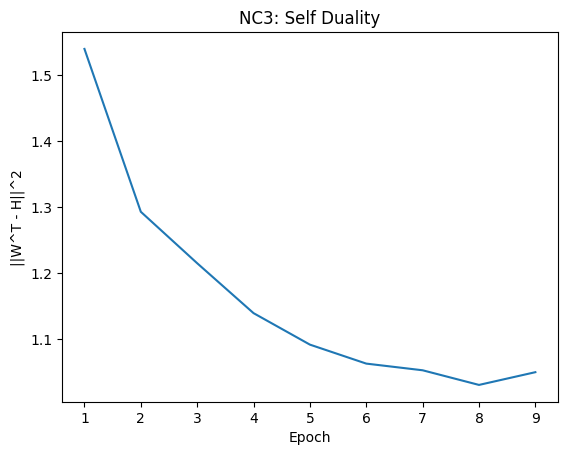

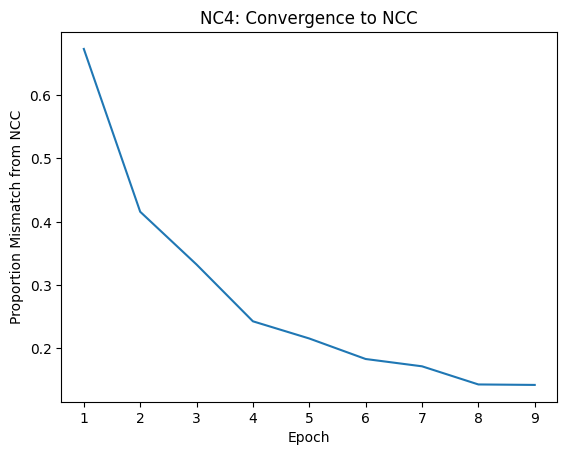

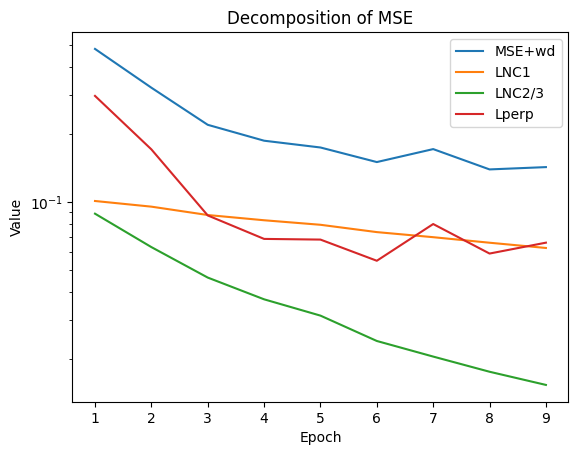

Train		Epoch: 10 [21/469 (4%)] 	Batch Loss: 0.025256 	Batch Accuracy: 0.945312:   4%|▍         | 21/469 [00:03<01:07,  6.59it/s]
Analysis Cov	Epoch: 10 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:40, 10.94it/s]


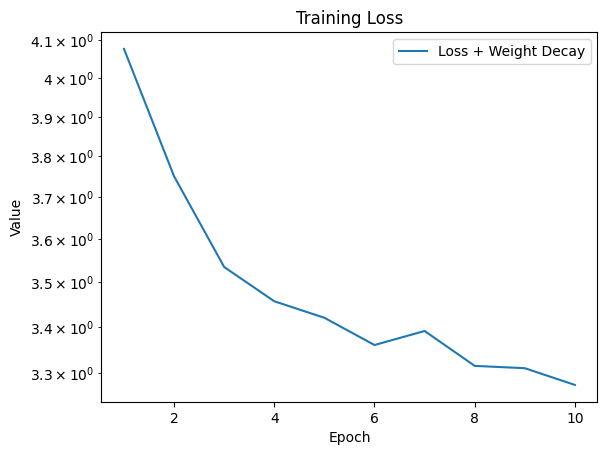

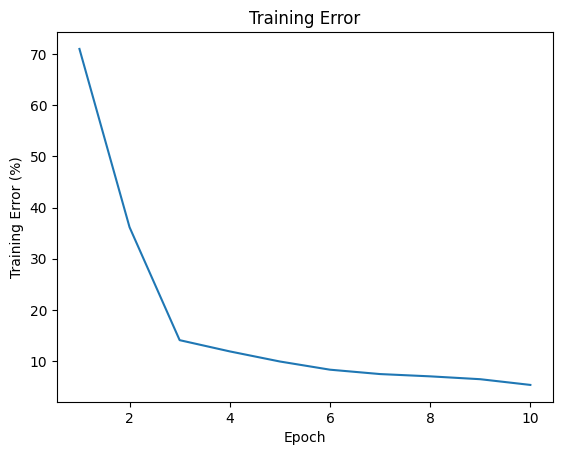

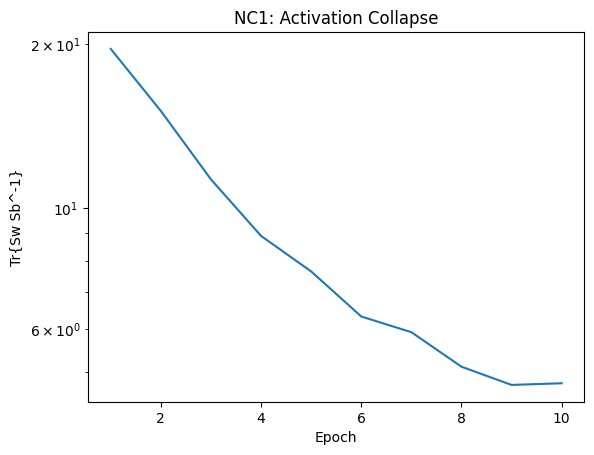

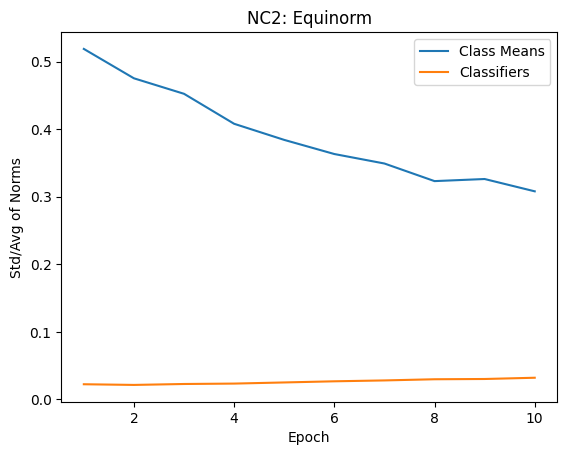

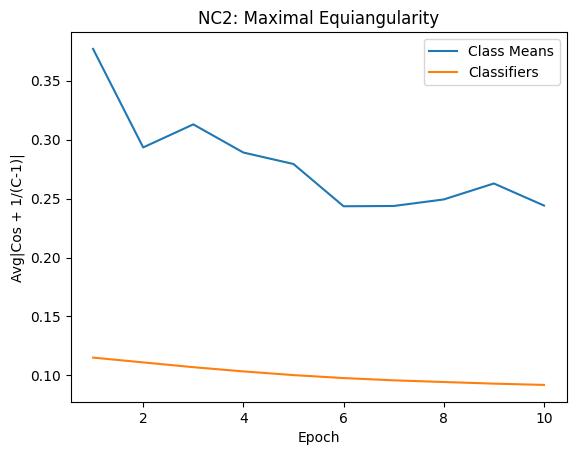

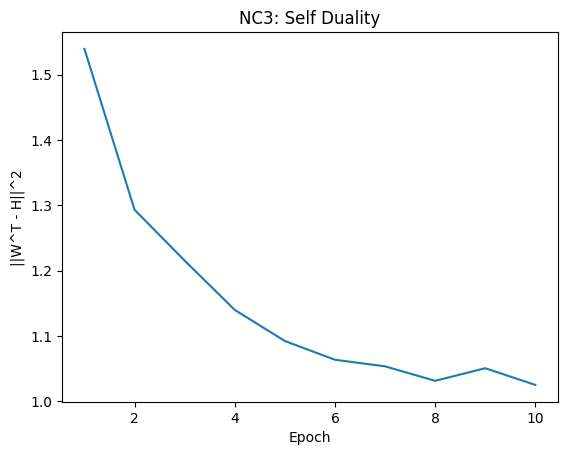

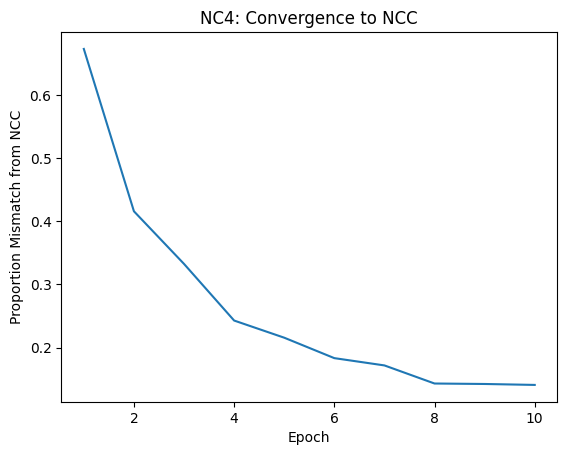

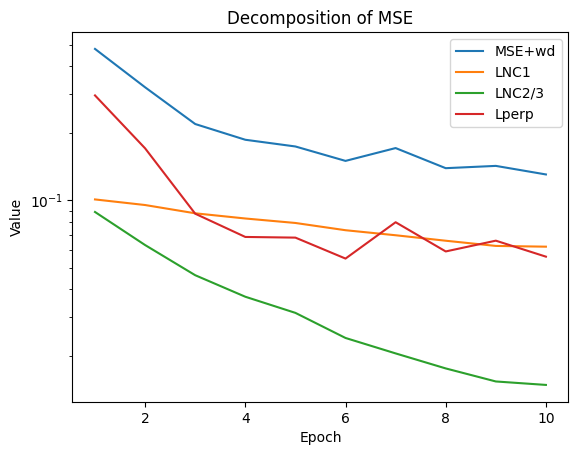

Train		Epoch: 11 [21/469 (4%)] 	Batch Loss: 0.023601 	Batch Accuracy: 0.960938:   4%|▍         | 21/469 [00:03<01:13,  6.12it/s]
Analysis Cov	Epoch: 11 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:40, 11.15it/s]


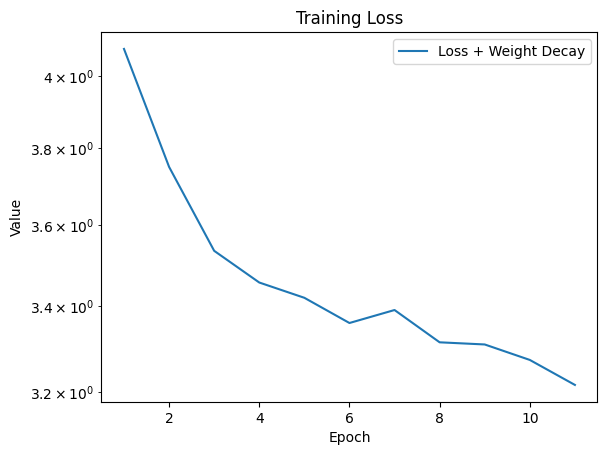

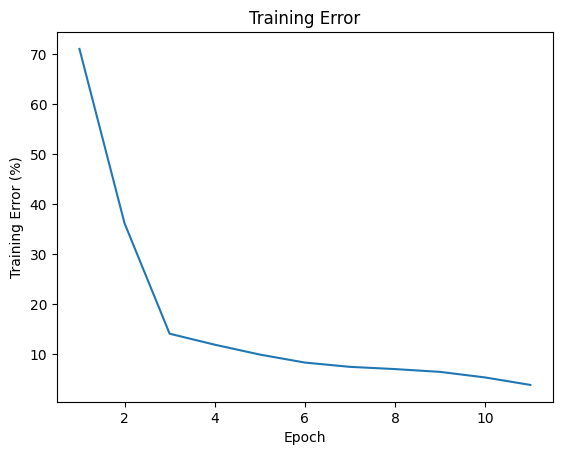

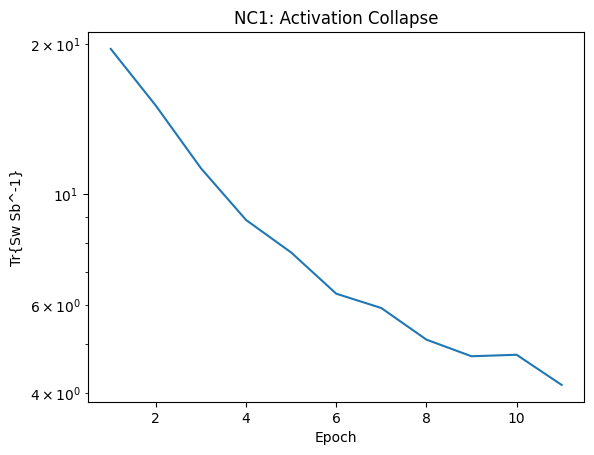

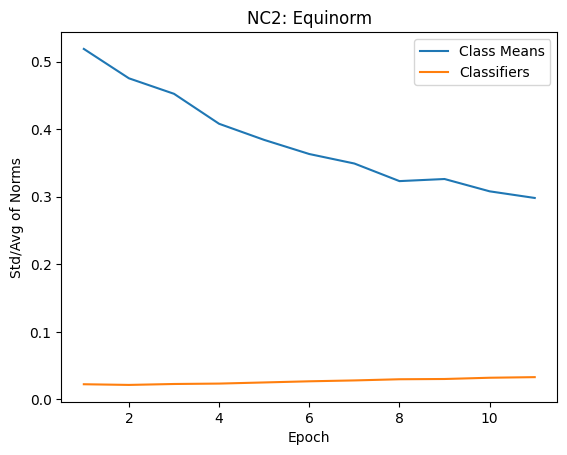

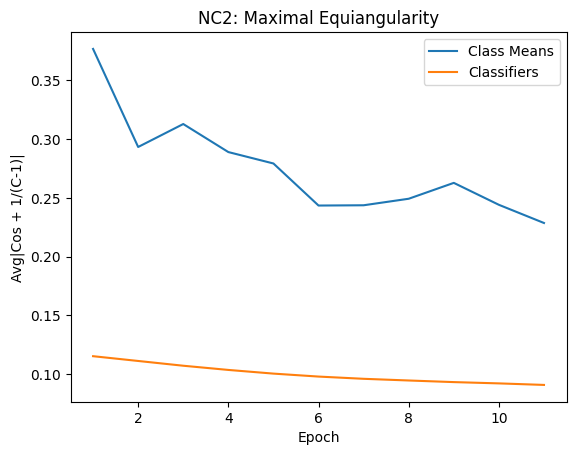

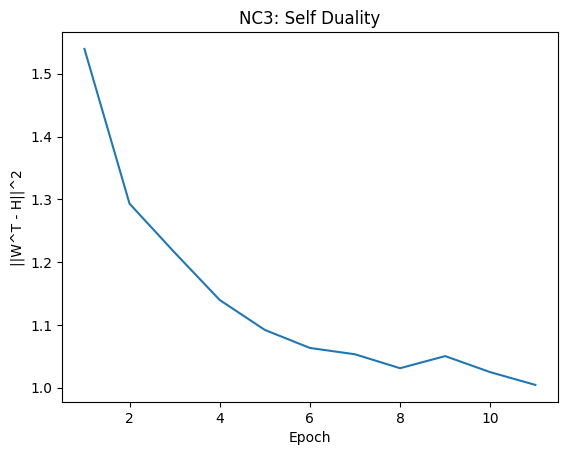

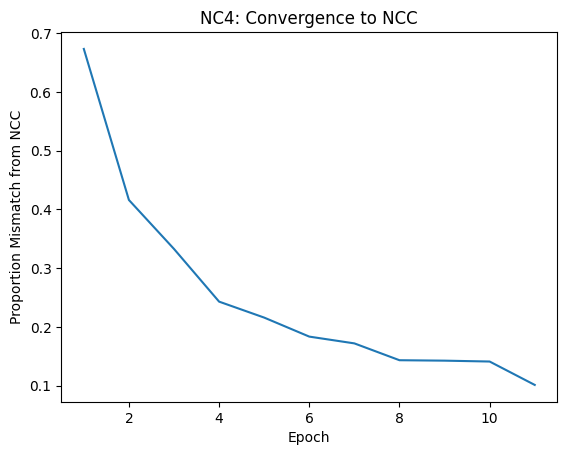

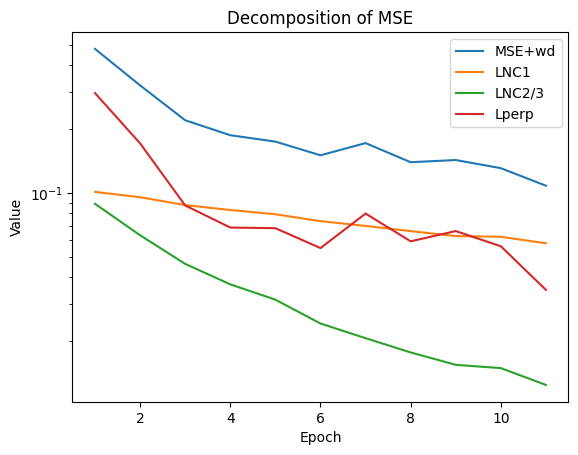

Train		Epoch: 12 [21/469 (4%)] 	Batch Loss: 0.022078 	Batch Accuracy: 0.960938:   4%|▍         | 21/469 [00:03<01:08,  6.53it/s]
Analysis Cov	Epoch: 12 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:45,  9.81it/s]


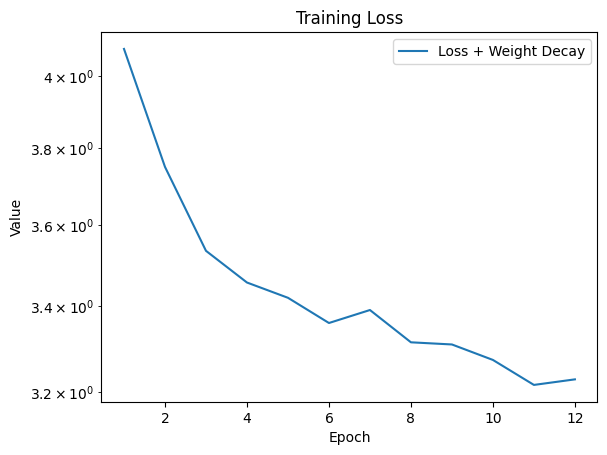

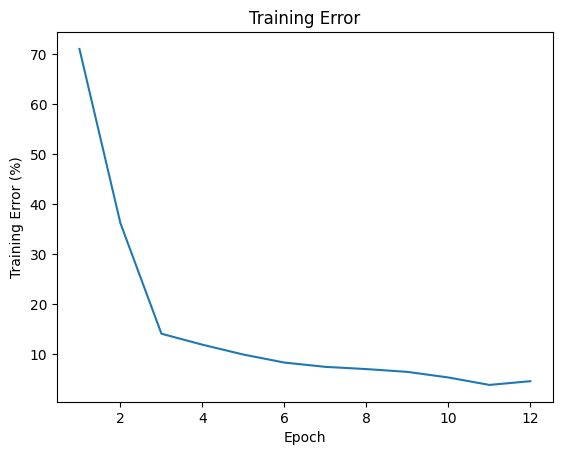

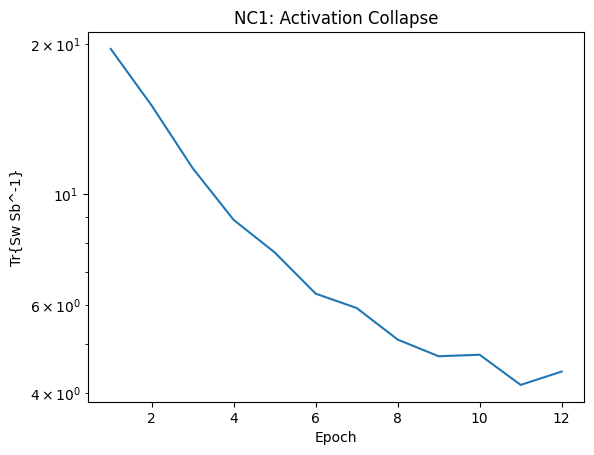

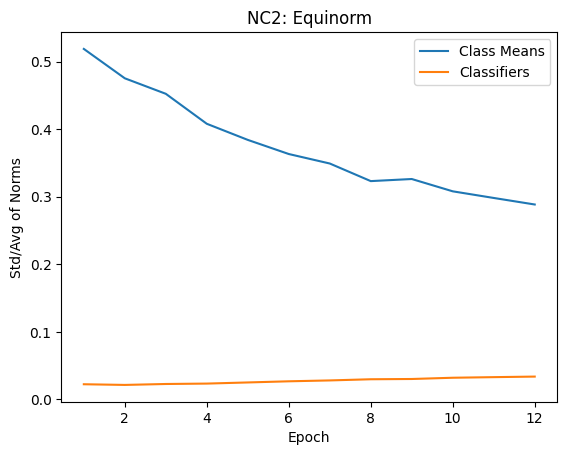

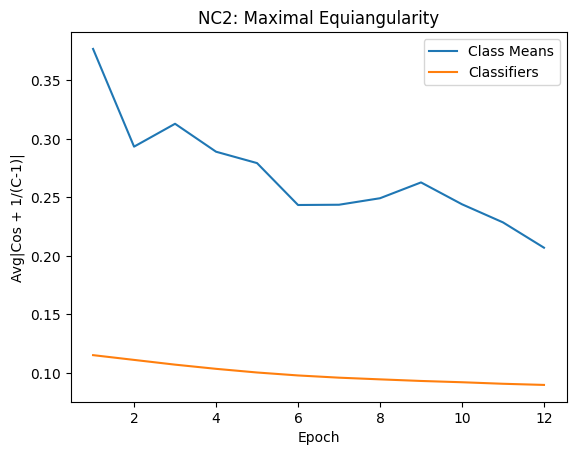

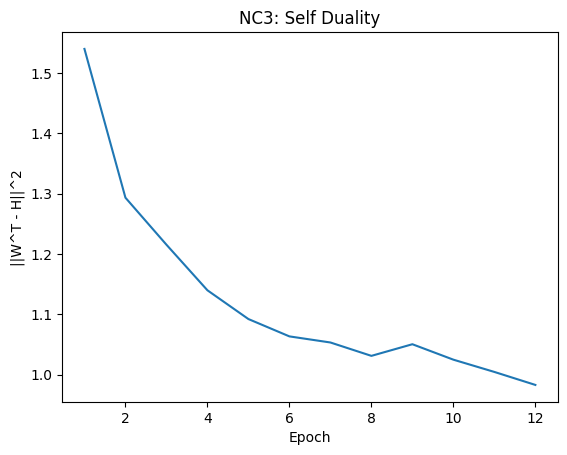

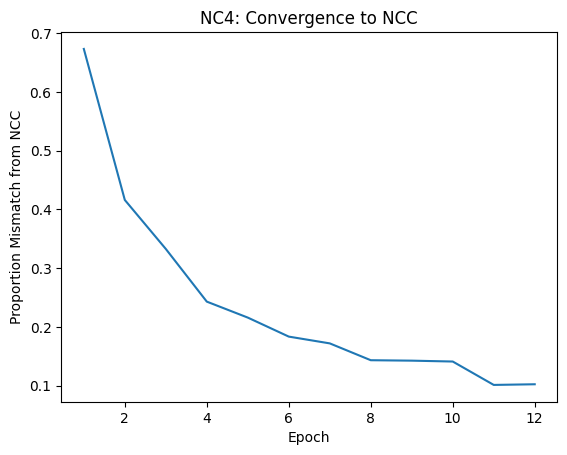

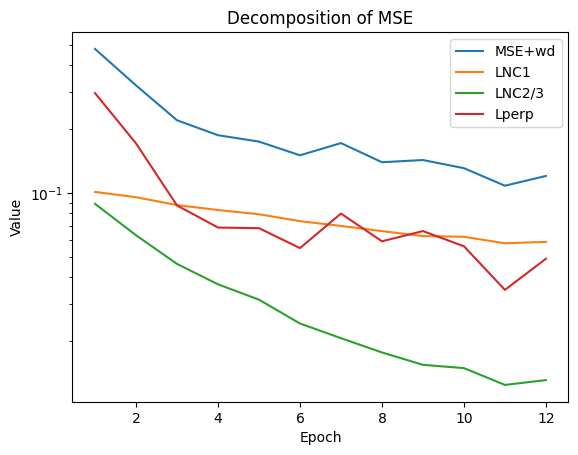

Train		Epoch: 13 [21/469 (4%)] 	Batch Loss: 0.020772 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.55it/s]
Analysis Cov	Epoch: 13 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.63it/s]


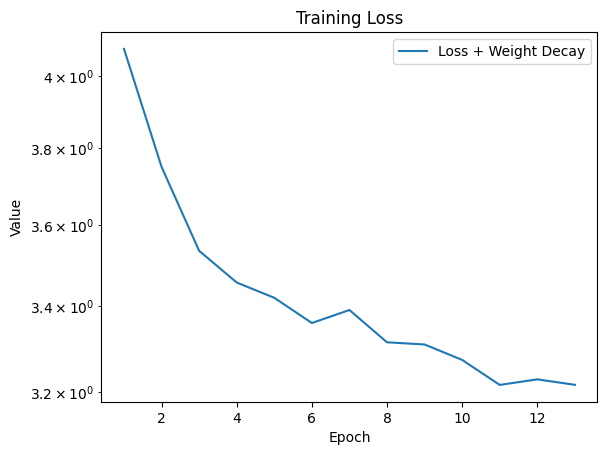

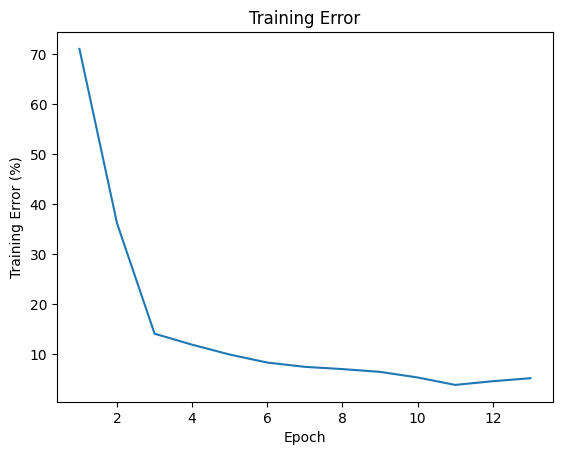

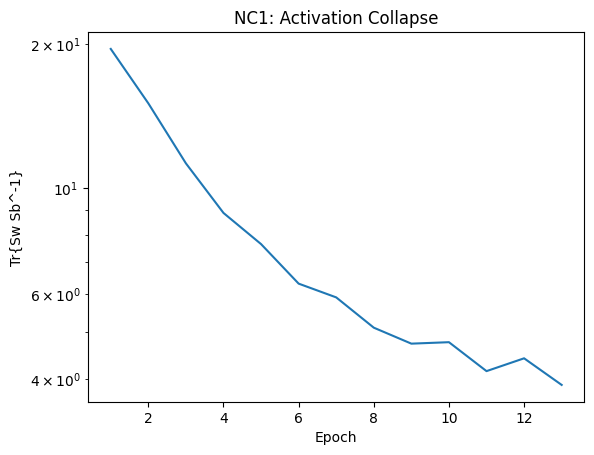

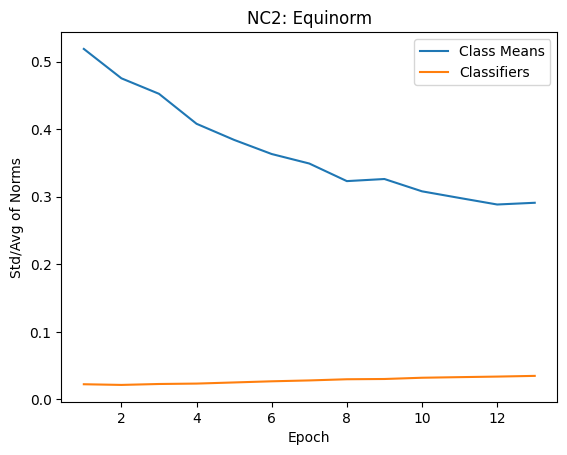

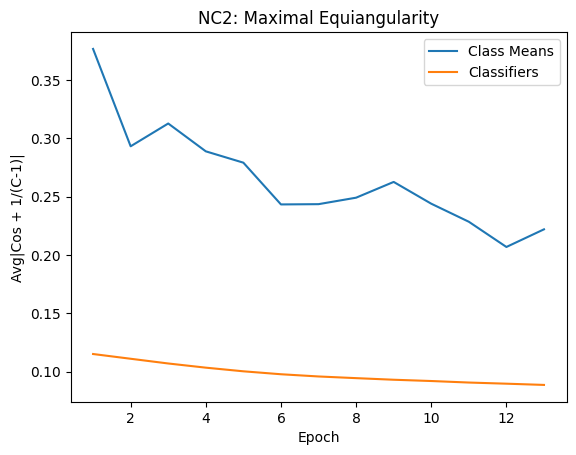

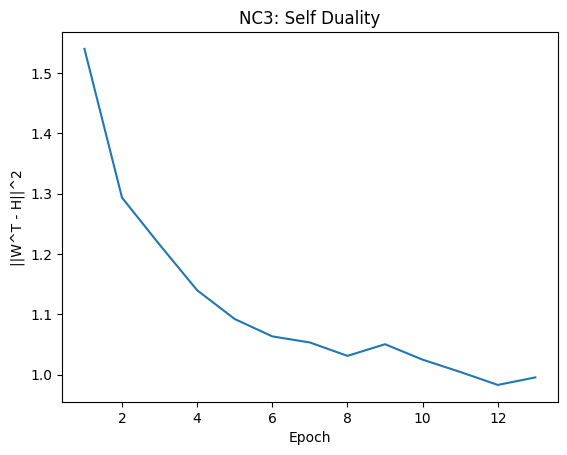

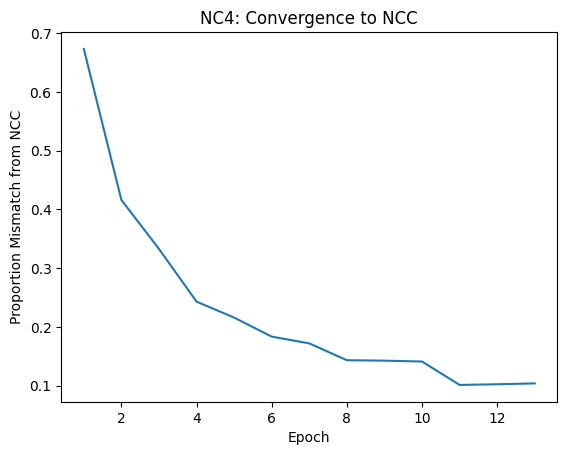

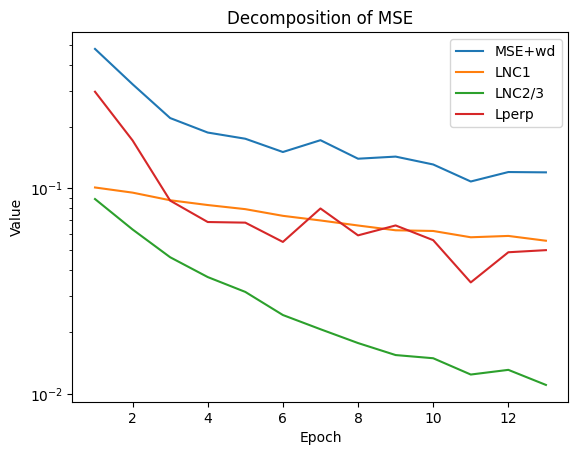

Train		Epoch: 14 [21/469 (4%)] 	Batch Loss: 0.025379 	Batch Accuracy: 0.914062:   4%|▍         | 21/469 [00:03<01:12,  6.15it/s]
Analysis Cov	Epoch: 14 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:41, 10.82it/s]


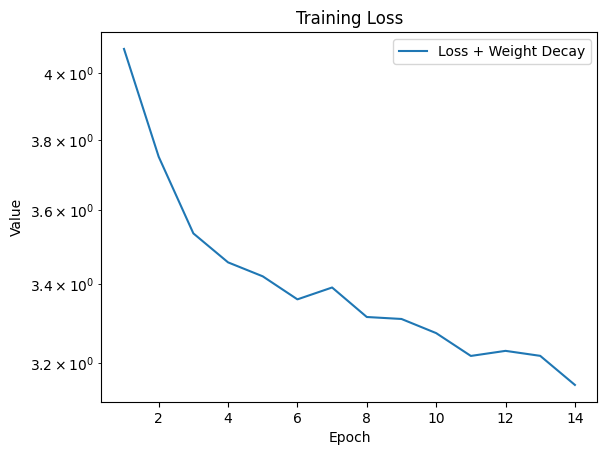

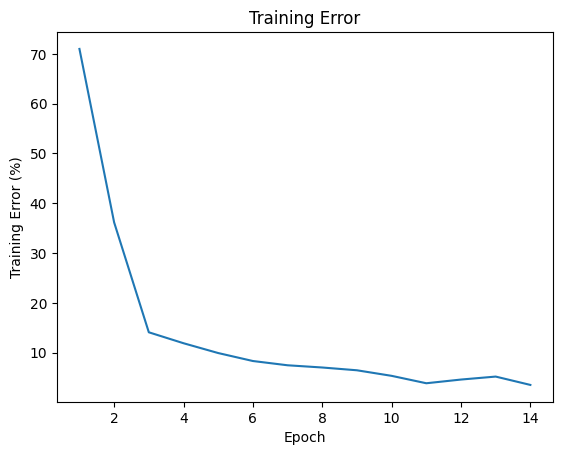

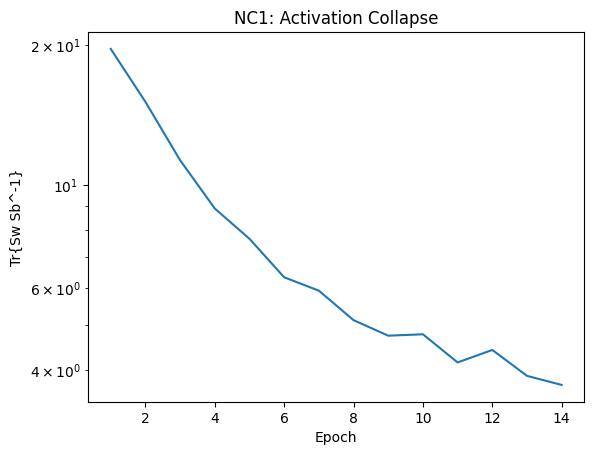

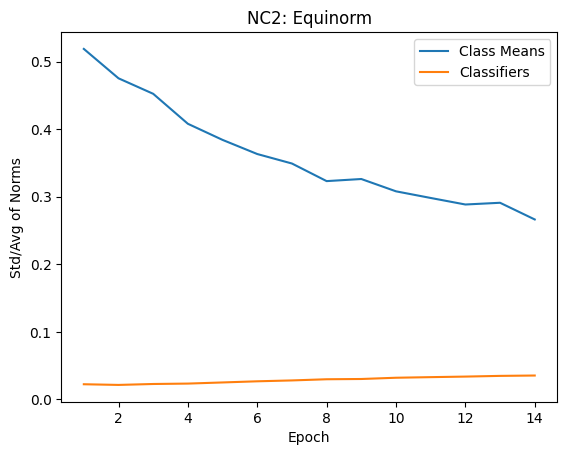

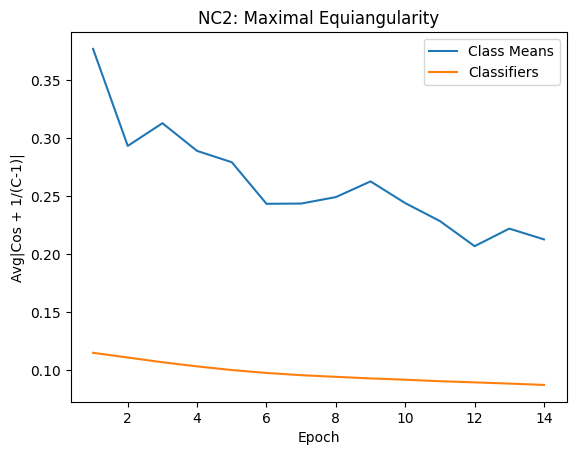

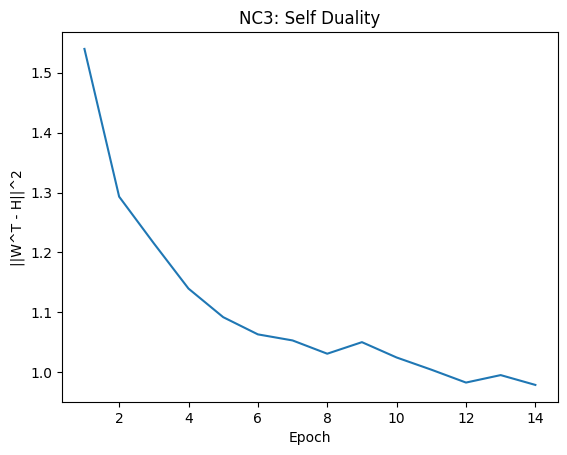

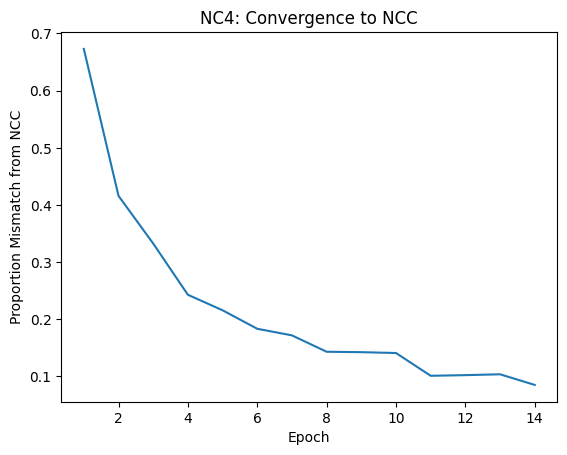

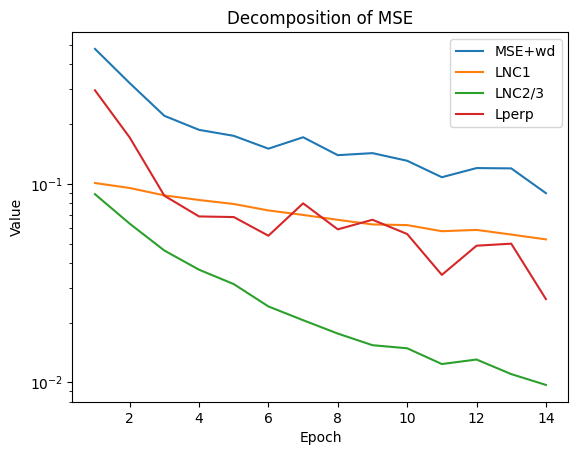

Train		Epoch: 15 [21/469 (4%)] 	Batch Loss: 0.019643 	Batch Accuracy: 0.953125:   4%|▍         | 21/469 [00:03<01:07,  6.65it/s]
Train		Epoch: 16 [21/469 (4%)] 	Batch Loss: 0.018905 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:10,  6.32it/s]
Analysis Cov	Epoch: 16 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:43, 10.38it/s]


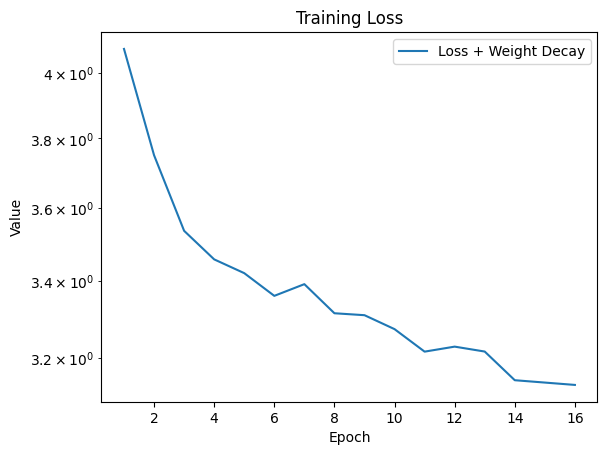

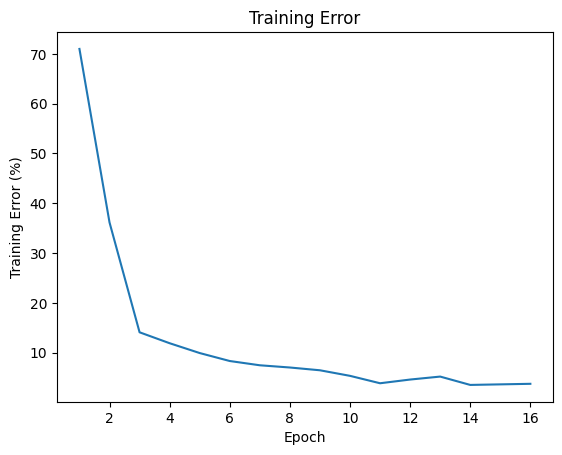

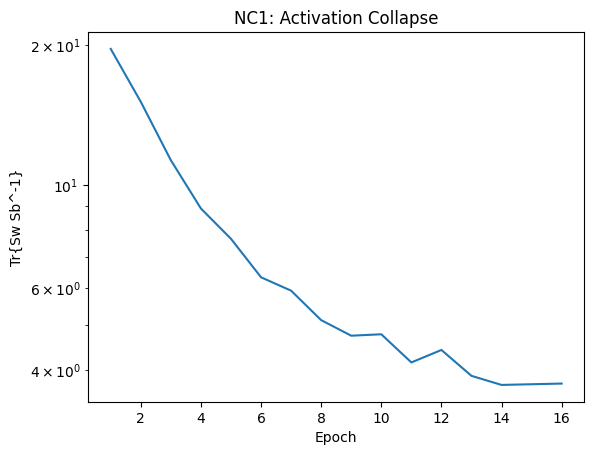

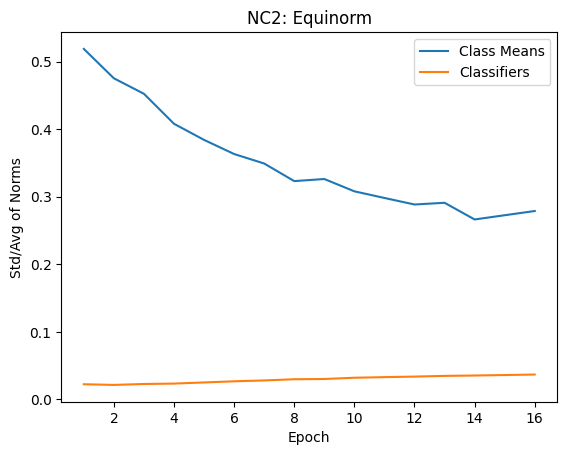

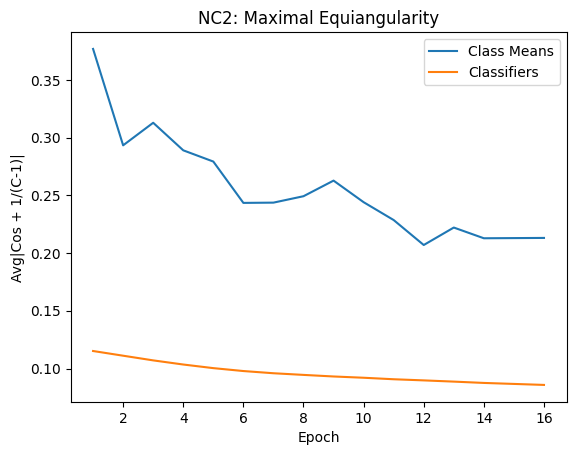

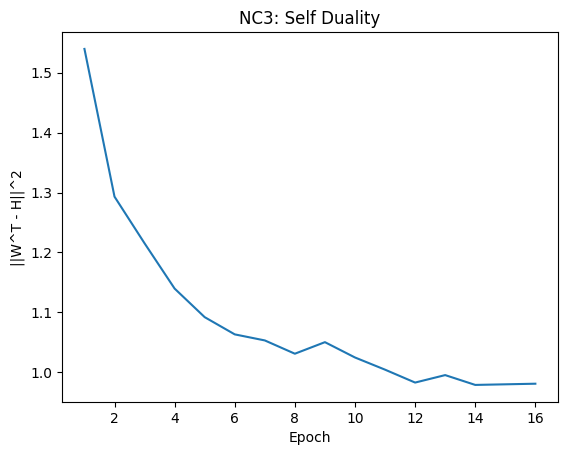

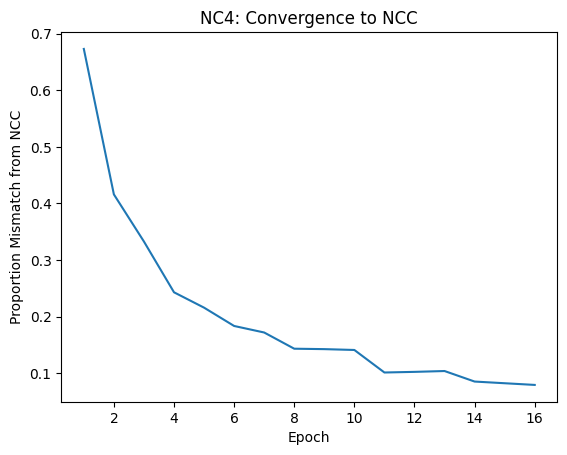

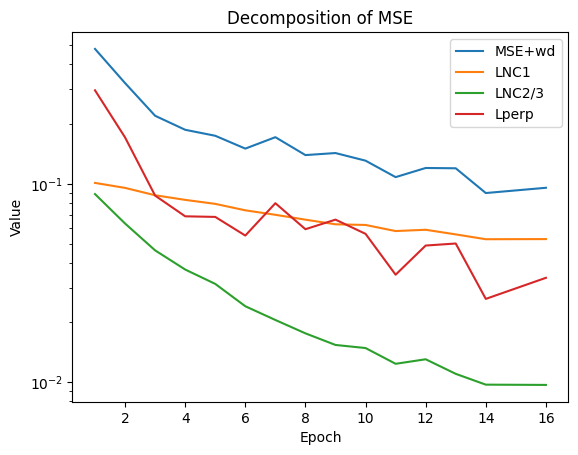

Train		Epoch: 17 [21/469 (4%)] 	Batch Loss: 0.017139 	Batch Accuracy: 0.960938:   4%|▍         | 21/469 [00:03<01:07,  6.61it/s]
Analysis Cov	Epoch: 17 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:47,  9.49it/s]


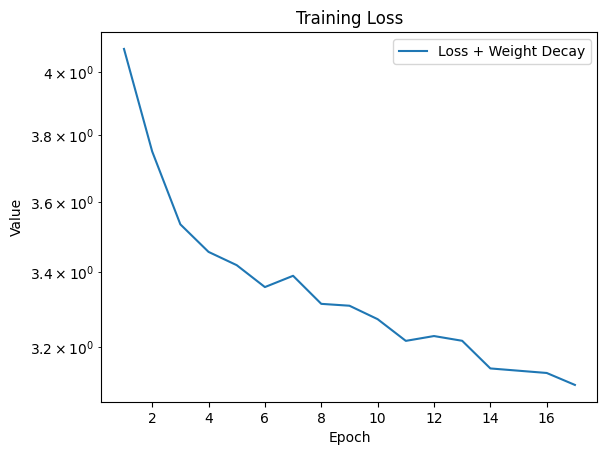

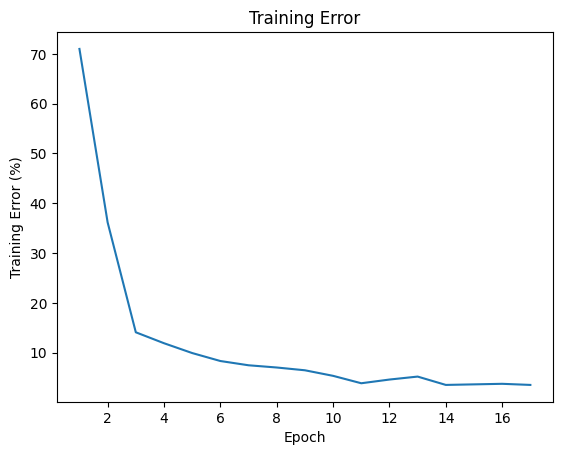

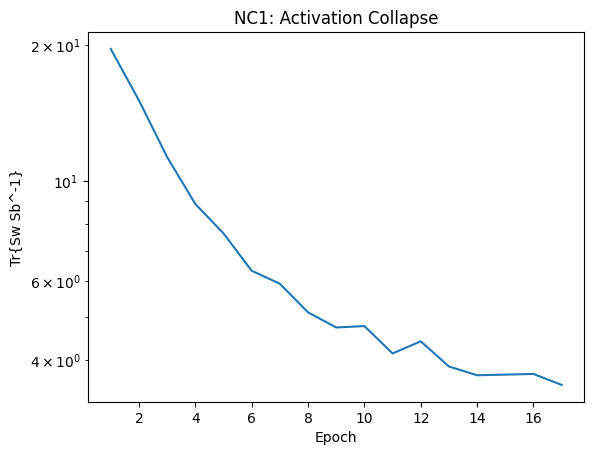

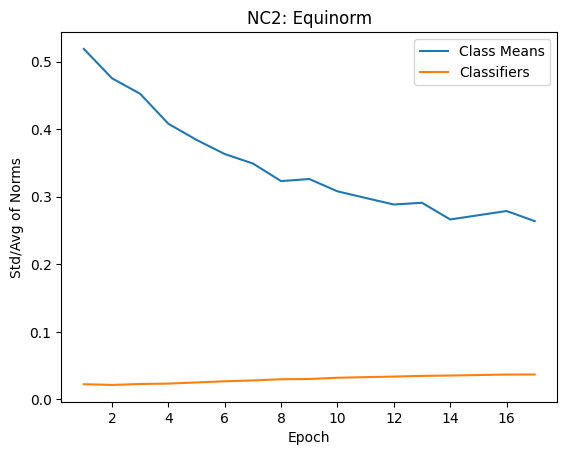

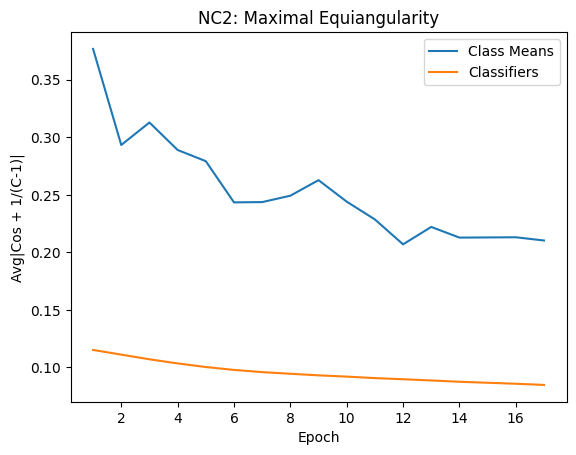

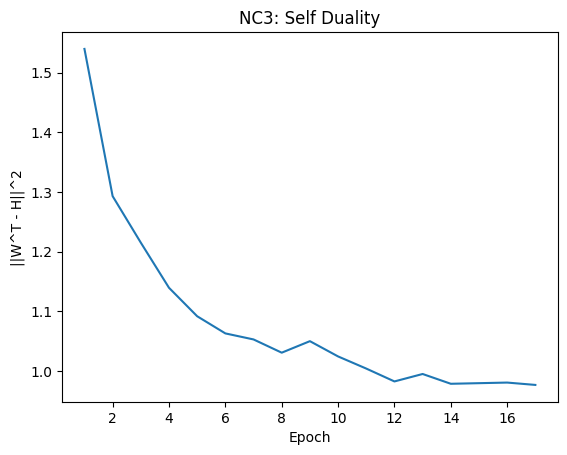

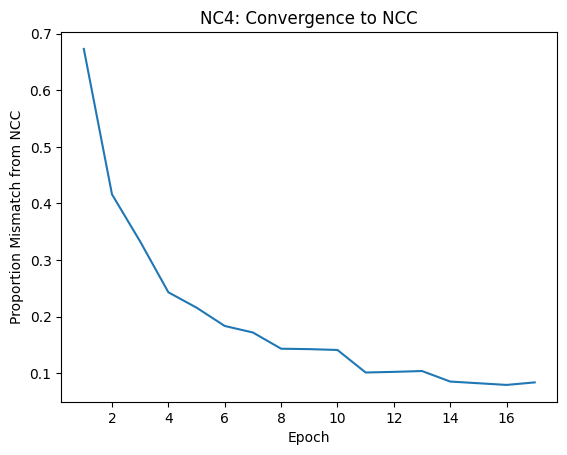

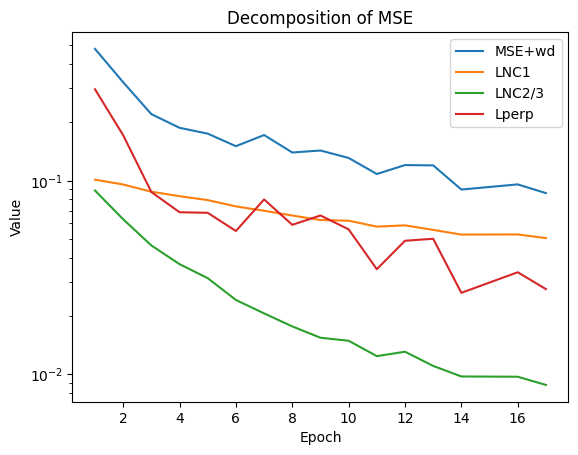

Train		Epoch: 18 [21/469 (4%)] 	Batch Loss: 0.020114 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:07,  6.68it/s]
Train		Epoch: 19 [21/469 (4%)] 	Batch Loss: 0.022317 	Batch Accuracy: 0.960938:   4%|▍         | 21/469 [00:03<01:06,  6.79it/s]
Analysis Cov	Epoch: 19 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.61it/s]


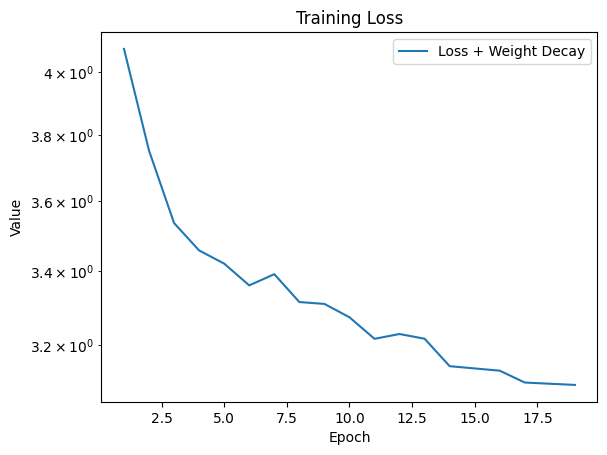

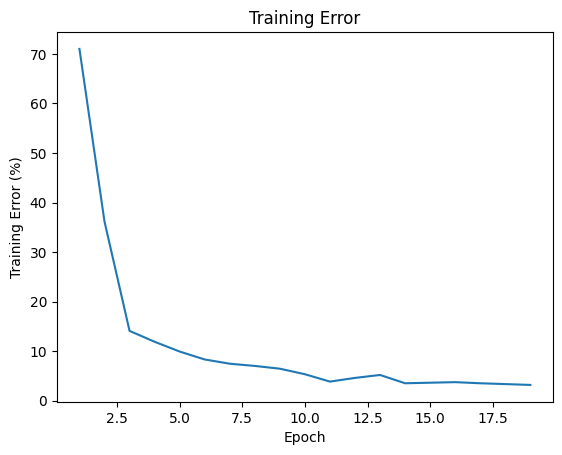

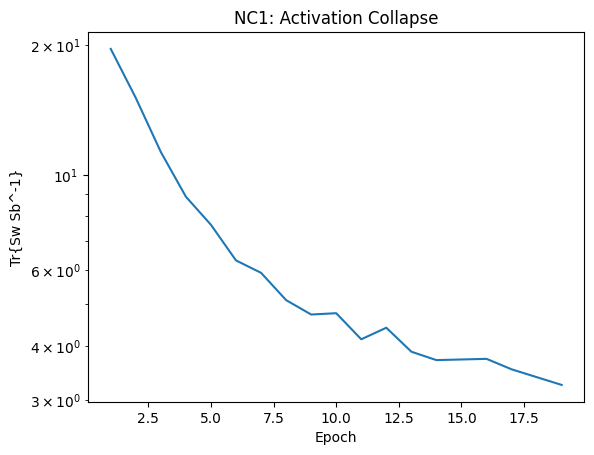

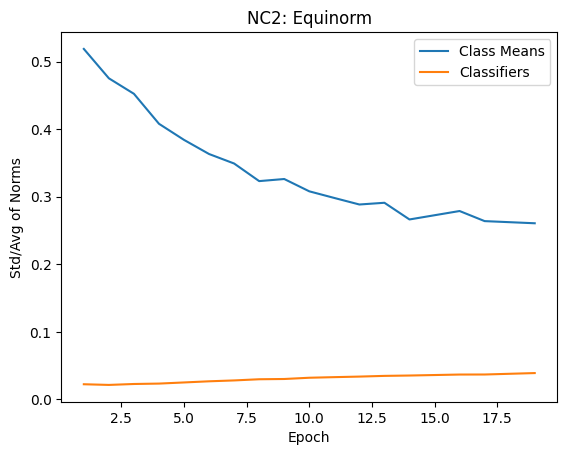

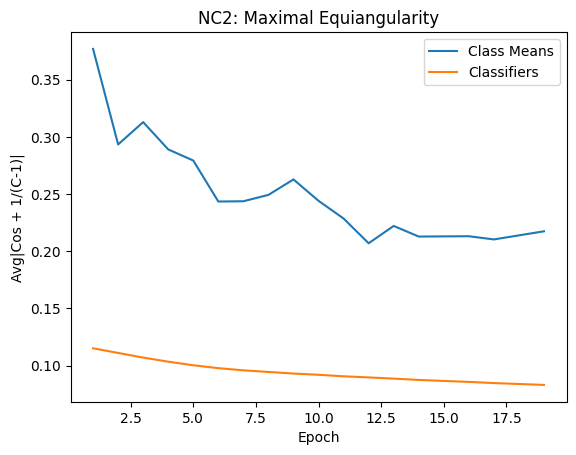

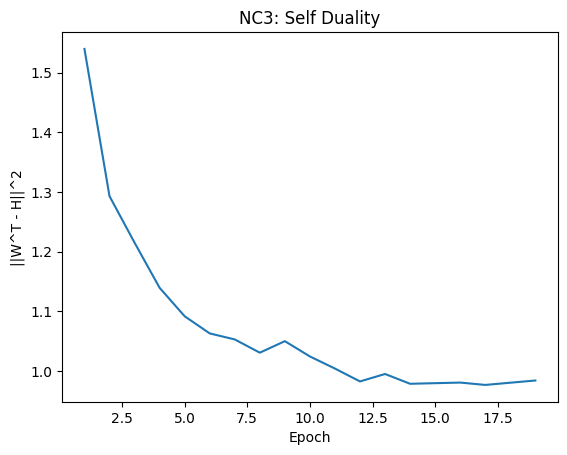

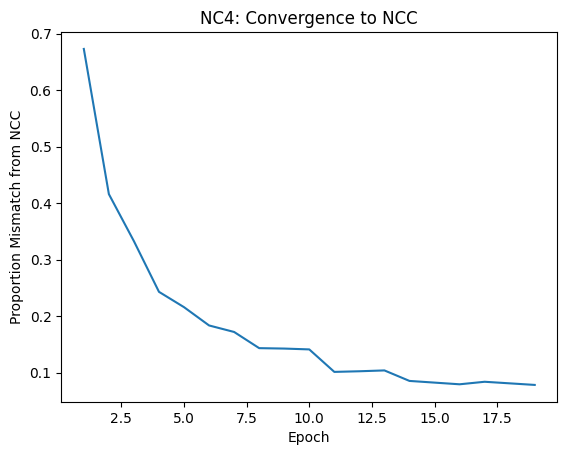

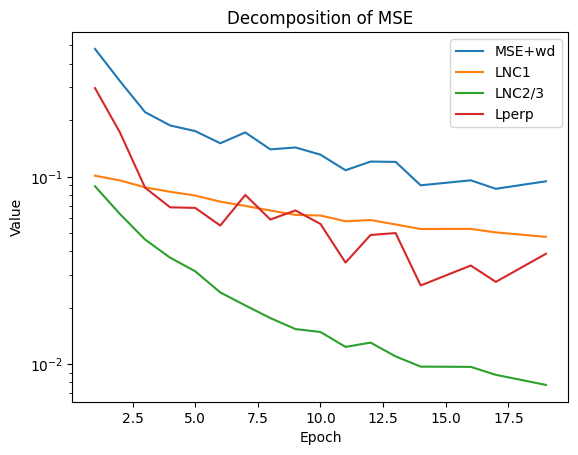

Train		Epoch: 20 [21/469 (4%)] 	Batch Loss: 0.024874 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:07,  6.61it/s]
Analysis Cov	Epoch: 20 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.52it/s]


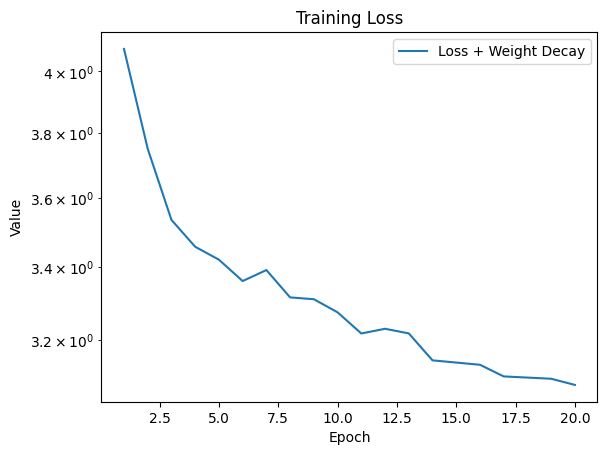

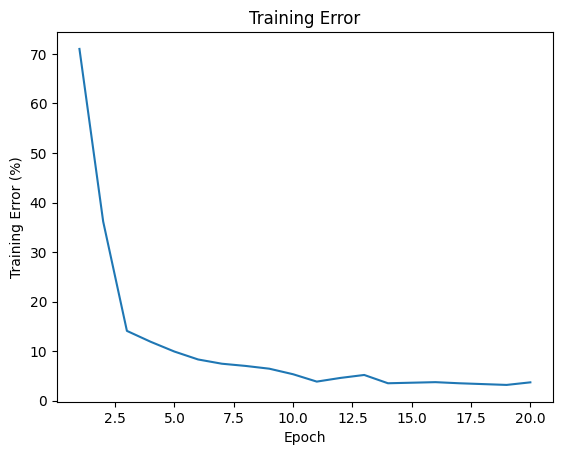

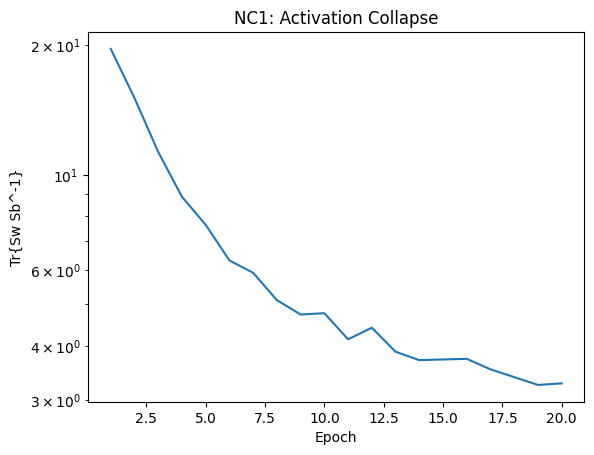

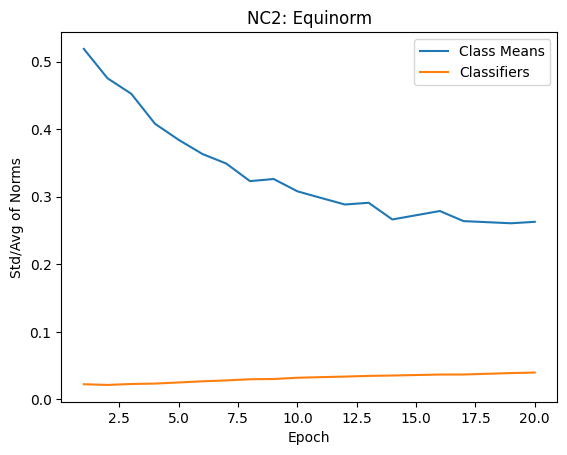

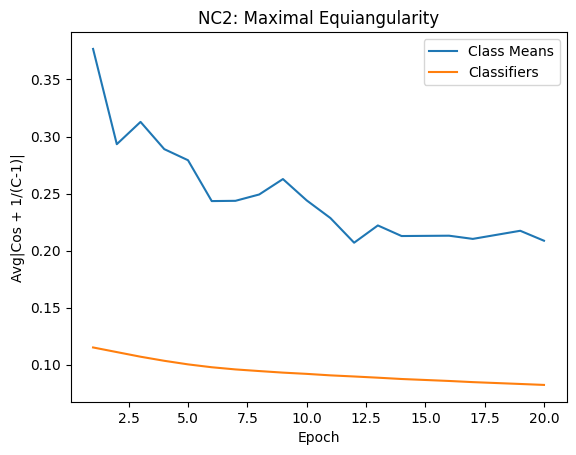

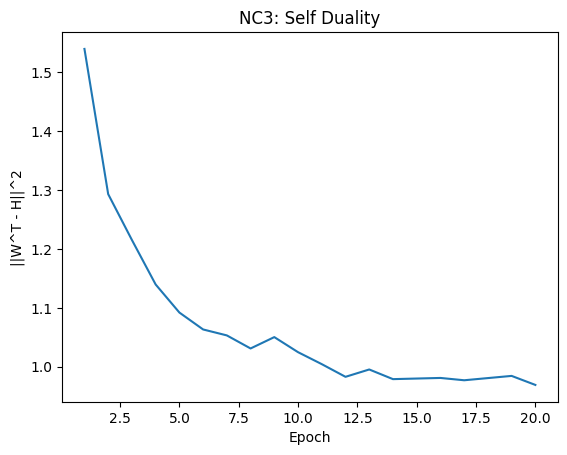

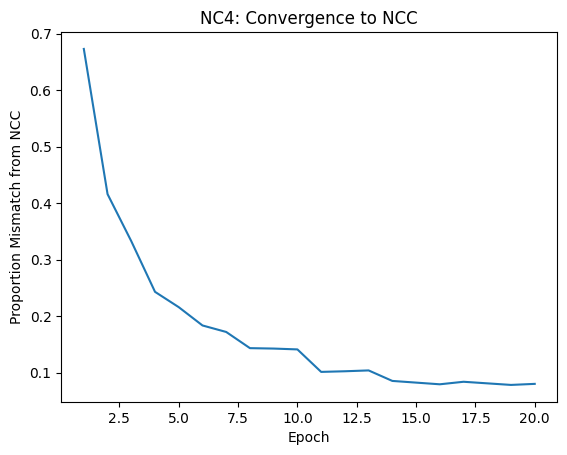

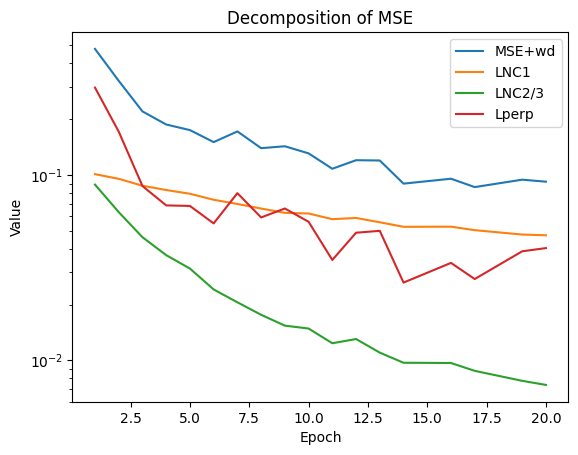

Train		Epoch: 21 [21/469 (4%)] 	Batch Loss: 0.016046 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:13,  6.10it/s]
Train		Epoch: 22 [21/469 (4%)] 	Batch Loss: 0.016005 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:09,  6.43it/s]
Analysis Cov	Epoch: 22 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:41, 10.70it/s]


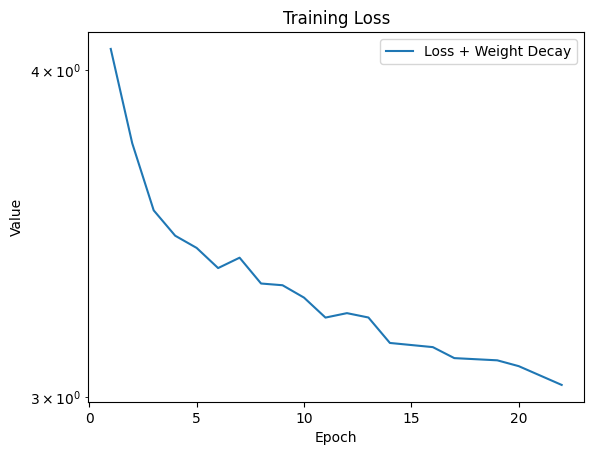

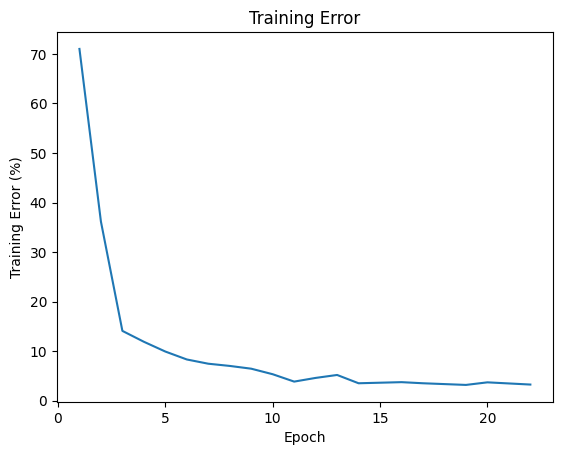

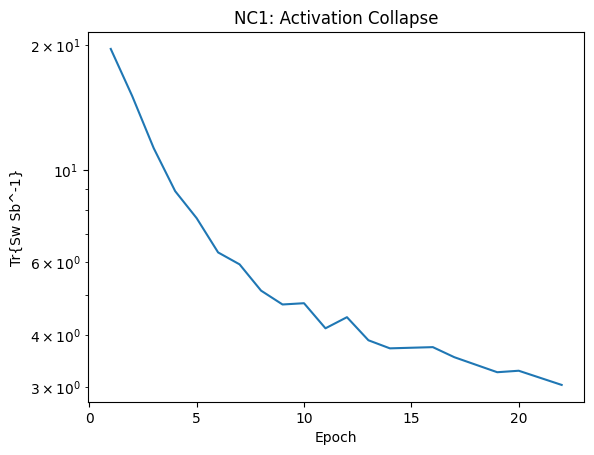

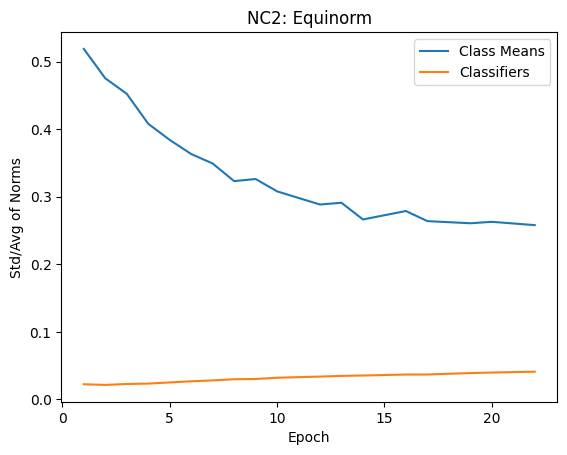

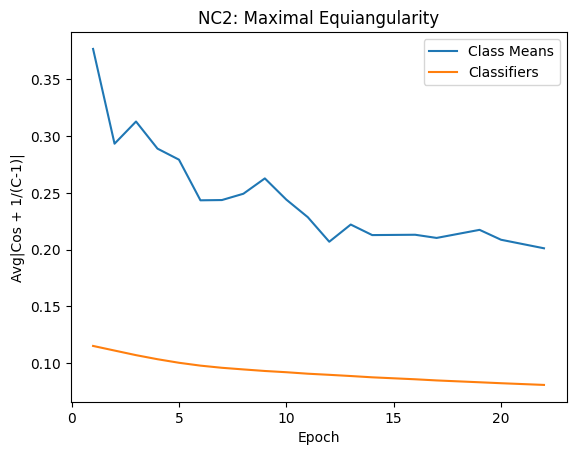

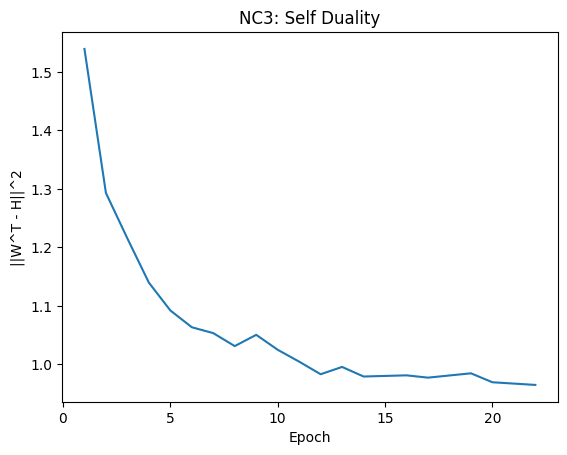

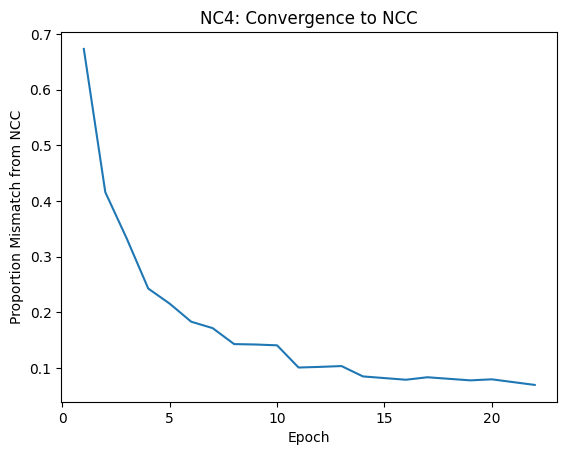

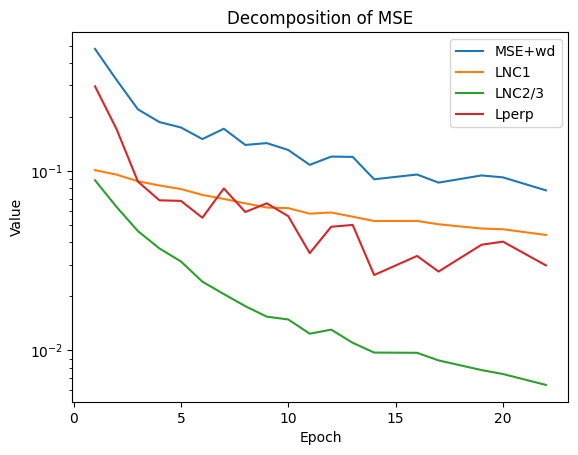

Train		Epoch: 23 [21/469 (4%)] 	Batch Loss: 0.016985 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:10,  6.38it/s]
Train		Epoch: 24 [21/469 (4%)] 	Batch Loss: 0.013958 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:10,  6.38it/s]
Analysis Cov	Epoch: 24 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.57it/s]


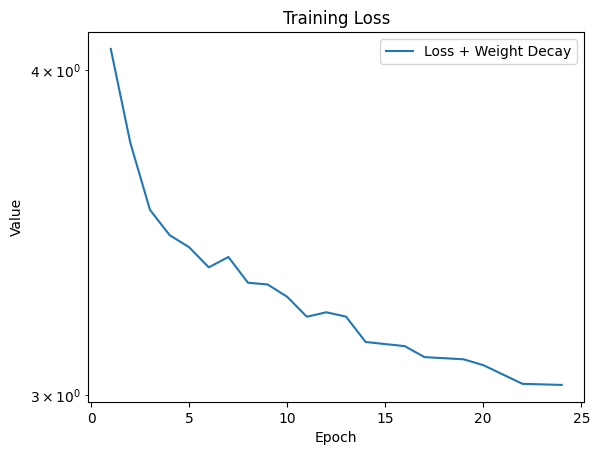

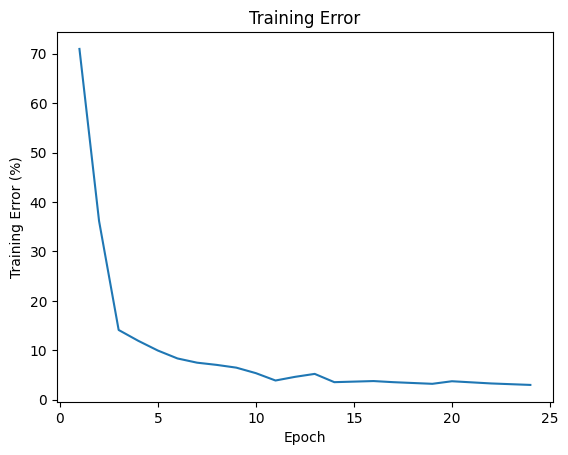

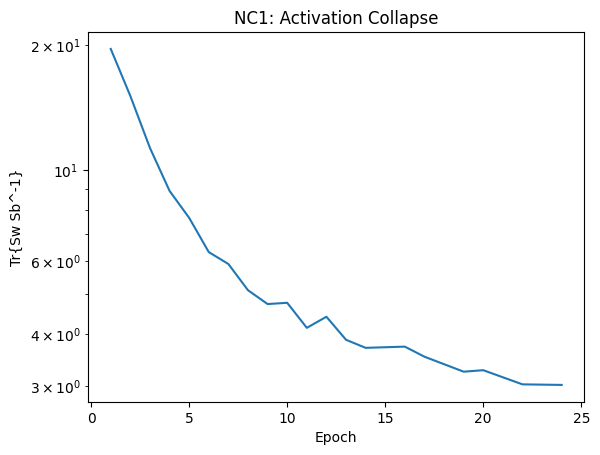

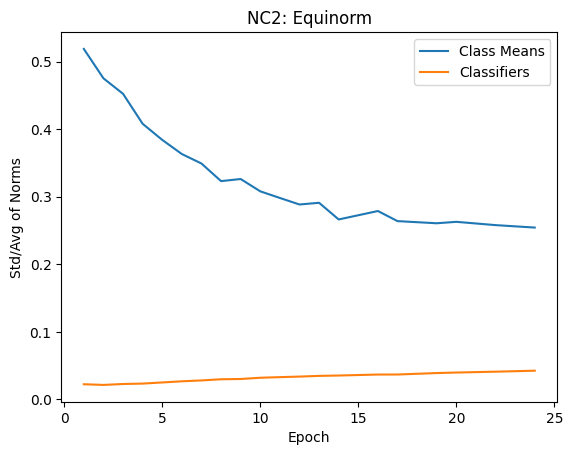

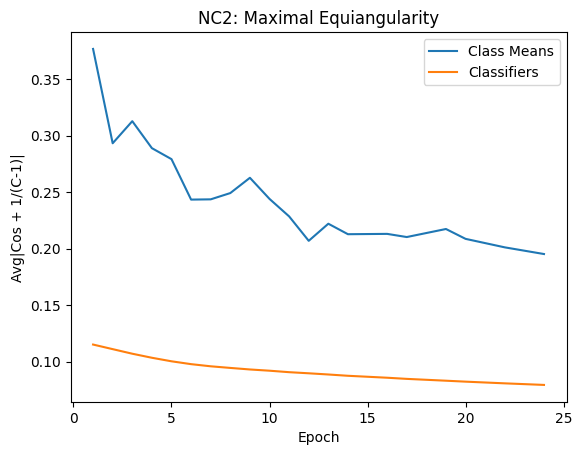

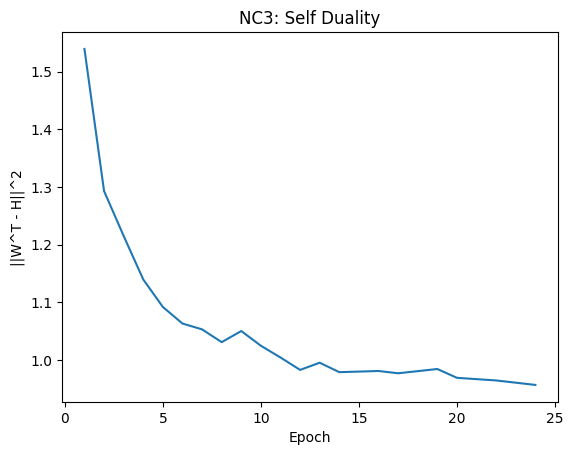

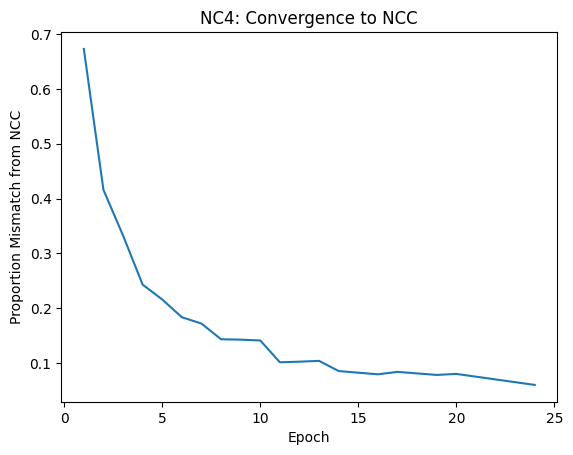

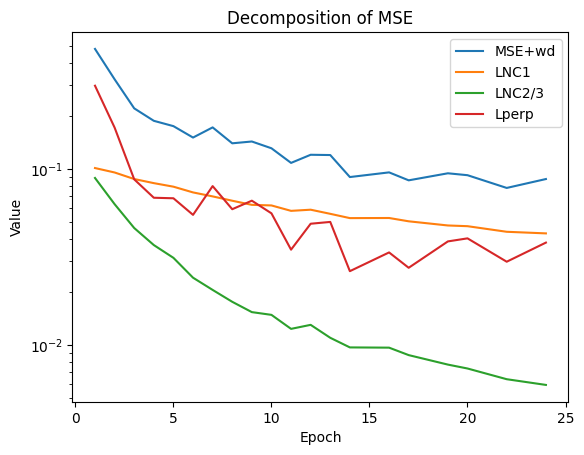

Train		Epoch: 25 [21/469 (4%)] 	Batch Loss: 0.017400 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:08,  6.56it/s]
Train		Epoch: 26 [21/469 (4%)] 	Batch Loss: 0.019169 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:09,  6.44it/s]
Train		Epoch: 27 [21/469 (4%)] 	Batch Loss: 0.013513 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:07,  6.64it/s]
Analysis Cov	Epoch: 27 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.55it/s]


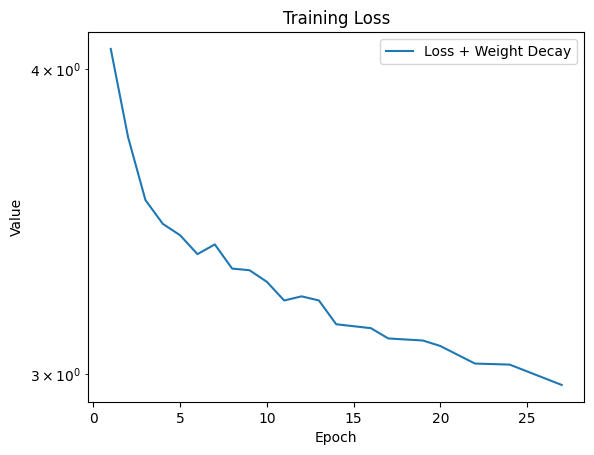

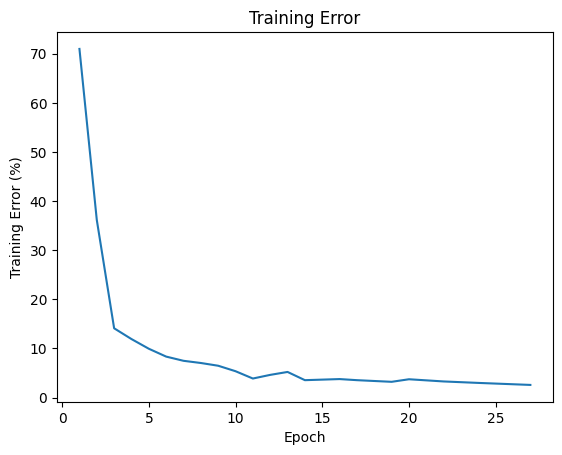

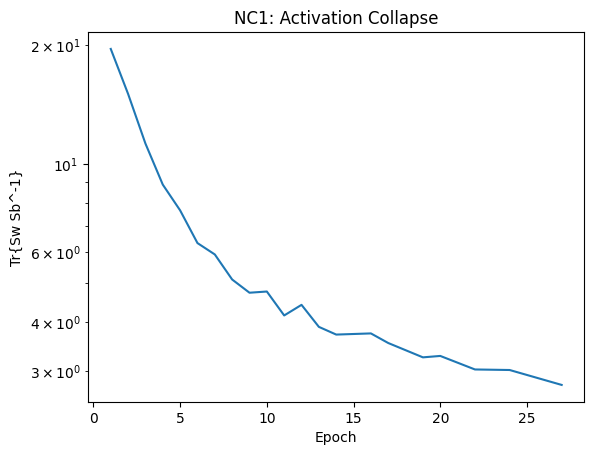

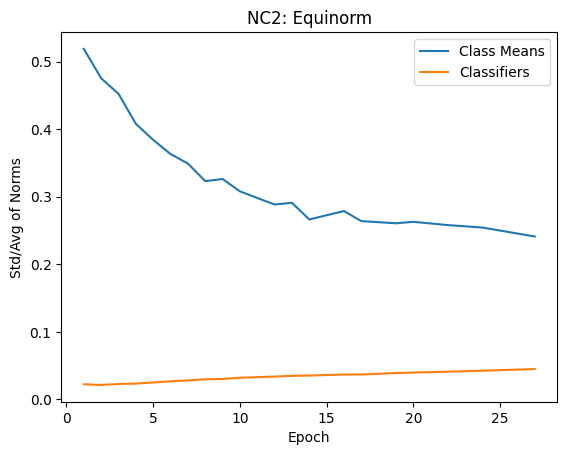

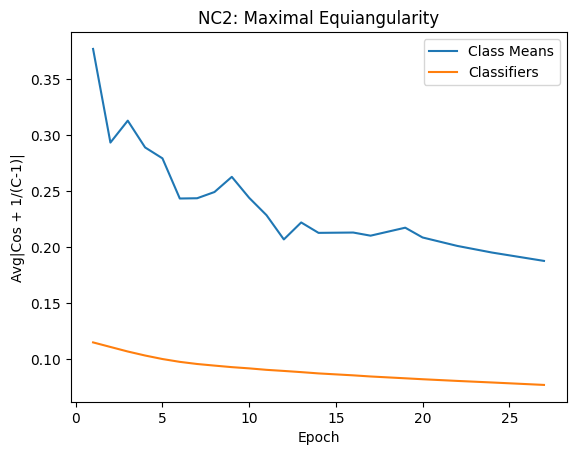

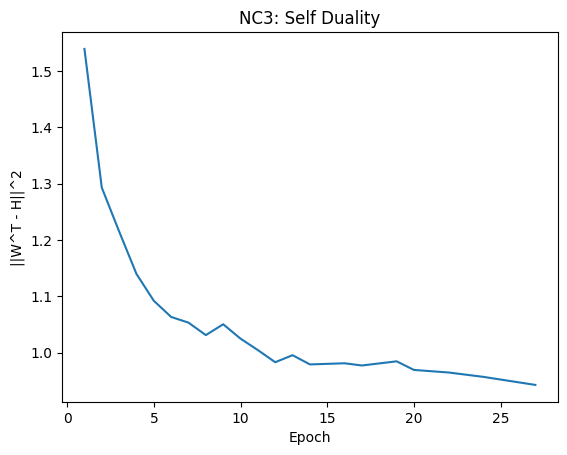

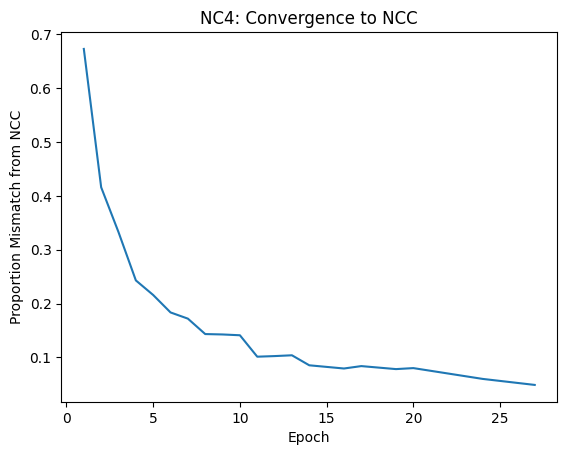

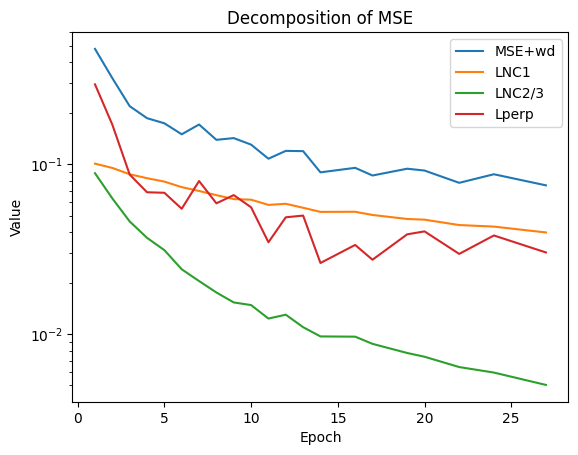

Train		Epoch: 28 [21/469 (4%)] 	Batch Loss: 0.017697 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:08,  6.53it/s]
Train		Epoch: 29 [21/469 (4%)] 	Batch Loss: 0.016184 	Batch Accuracy: 0.953125:   4%|▍         | 21/469 [00:03<01:08,  6.58it/s]
Analysis Cov	Epoch: 29 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:41, 10.81it/s]


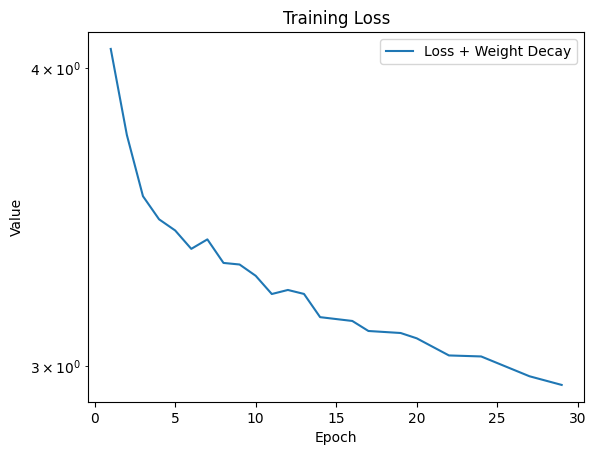

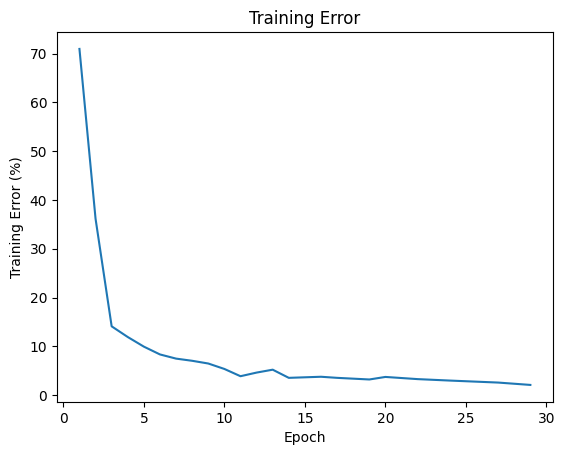

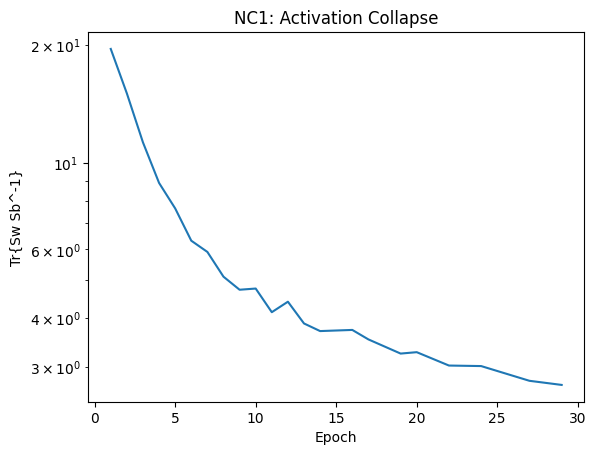

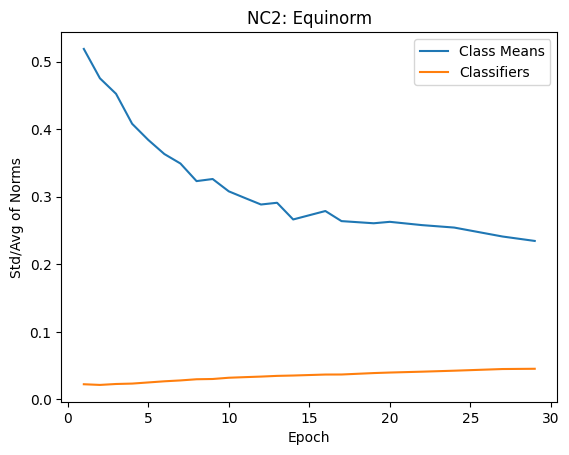

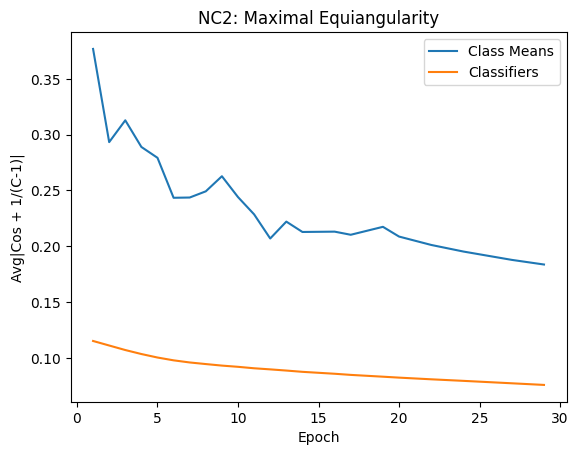

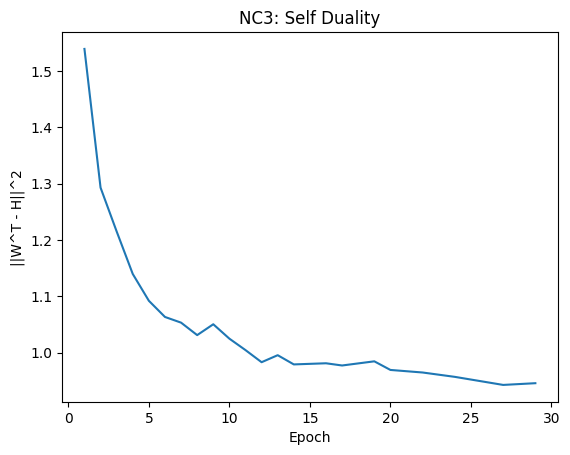

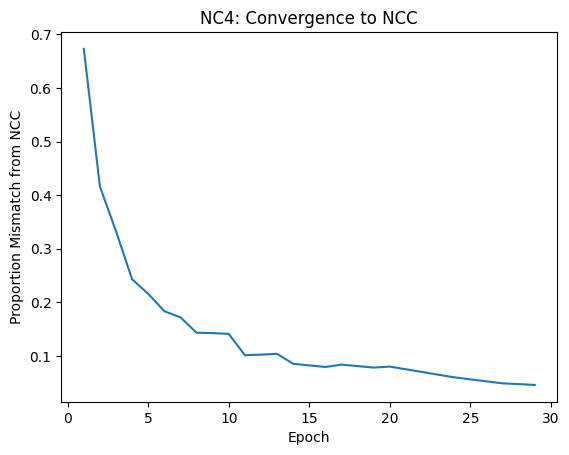

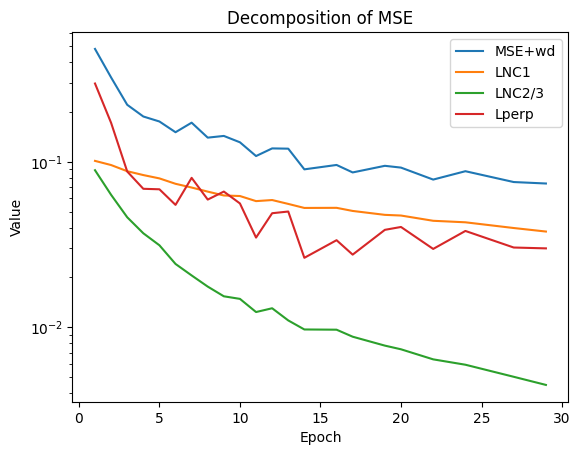

Train		Epoch: 30 [21/469 (4%)] 	Batch Loss: 0.011624 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.58it/s]
Train		Epoch: 31 [21/469 (4%)] 	Batch Loss: 0.014512 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:07,  6.63it/s]
Train		Epoch: 32 [21/469 (4%)] 	Batch Loss: 0.010987 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:10,  6.34it/s]
Analysis Cov	Epoch: 32 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:41, 10.75it/s]


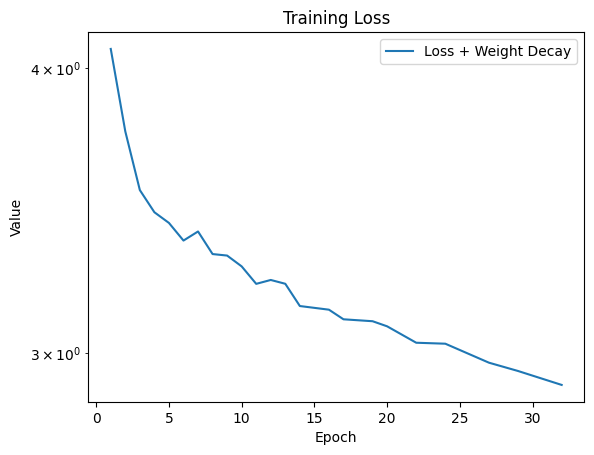

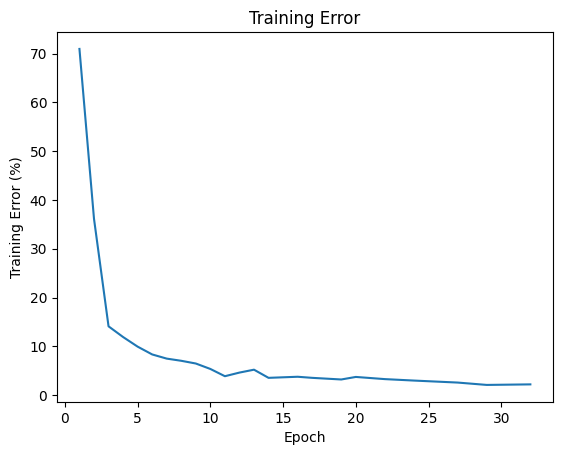

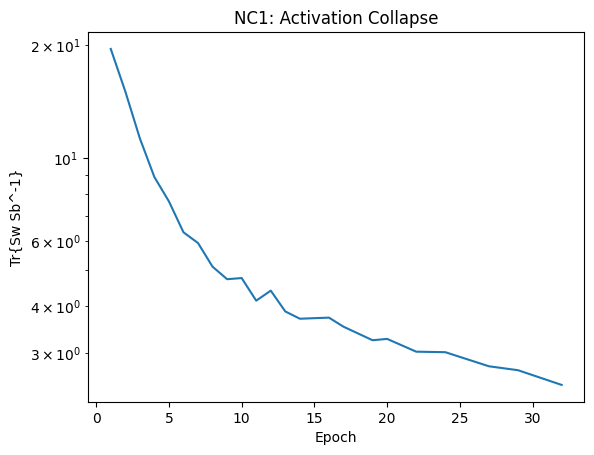

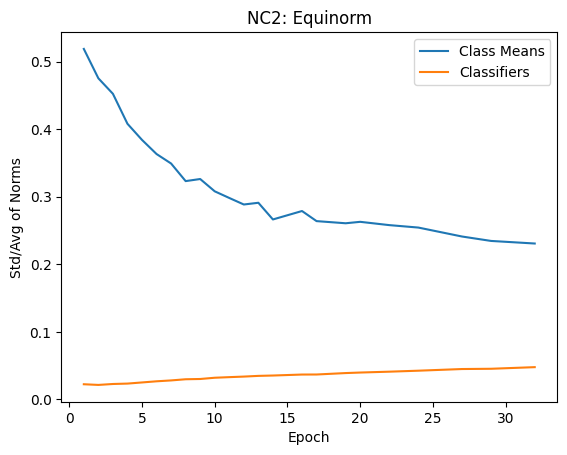

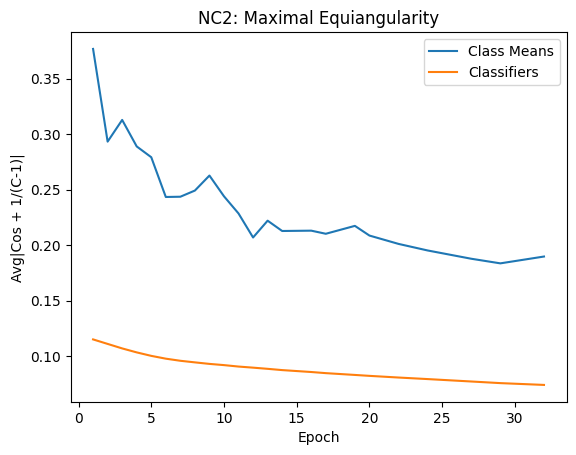

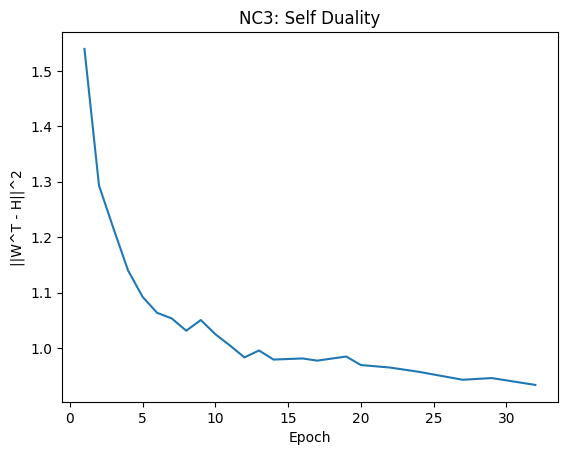

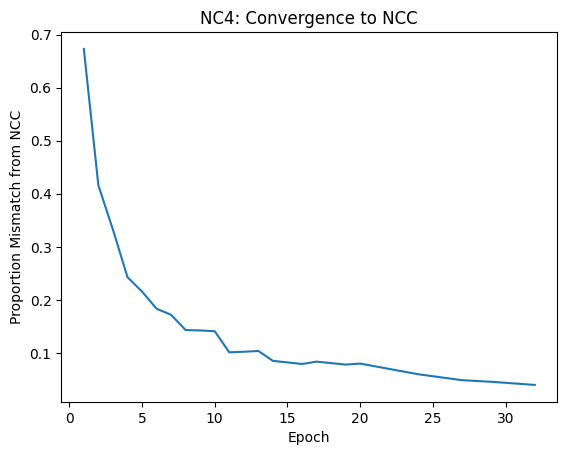

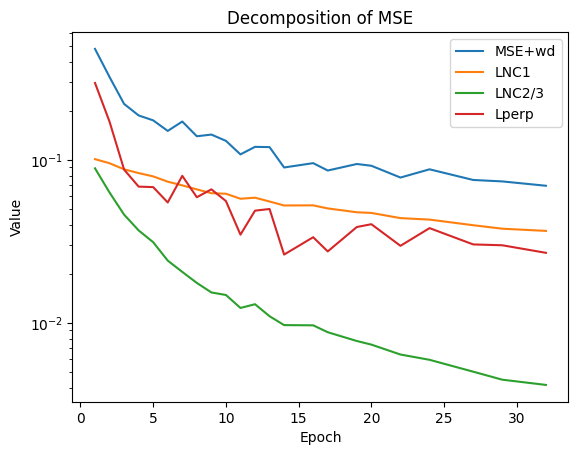

Train		Epoch: 33 [21/469 (4%)] 	Batch Loss: 0.010920 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:10,  6.34it/s]
Train		Epoch: 34 [21/469 (4%)] 	Batch Loss: 0.016500 	Batch Accuracy: 0.953125:   4%|▍         | 21/469 [00:03<01:10,  6.35it/s]
Train		Epoch: 35 [21/469 (4%)] 	Batch Loss: 0.013614 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.77it/s]
Analysis Cov	Epoch: 35 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:43, 10.40it/s]


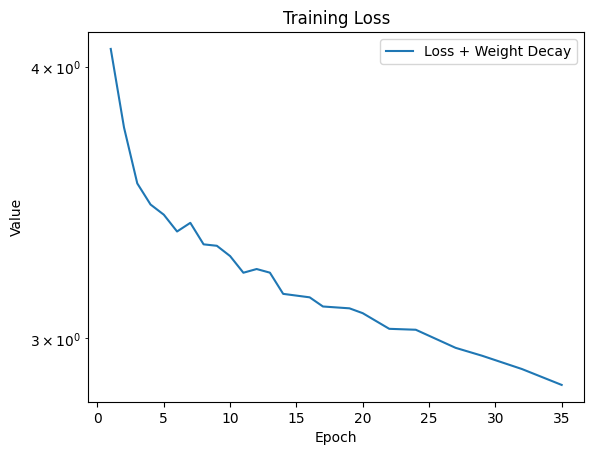

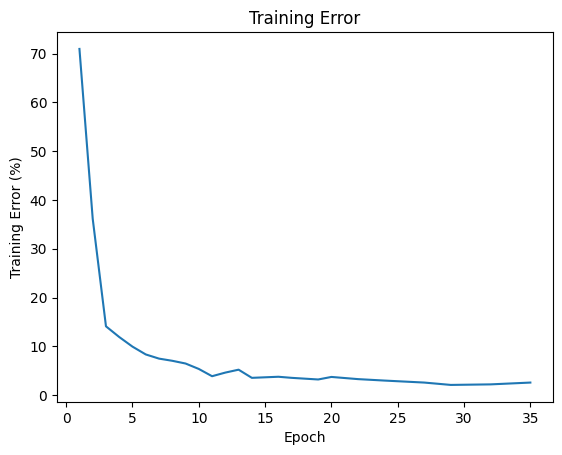

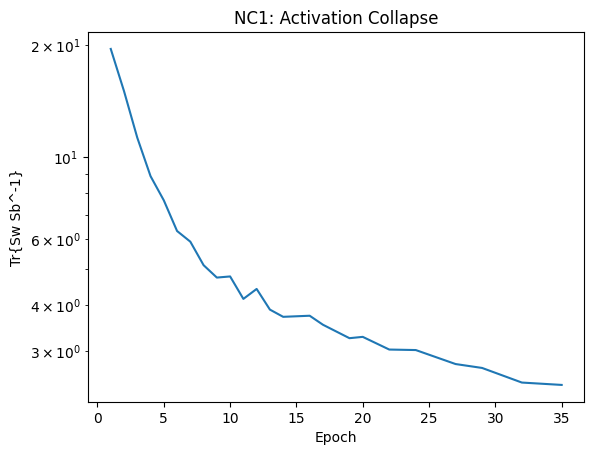

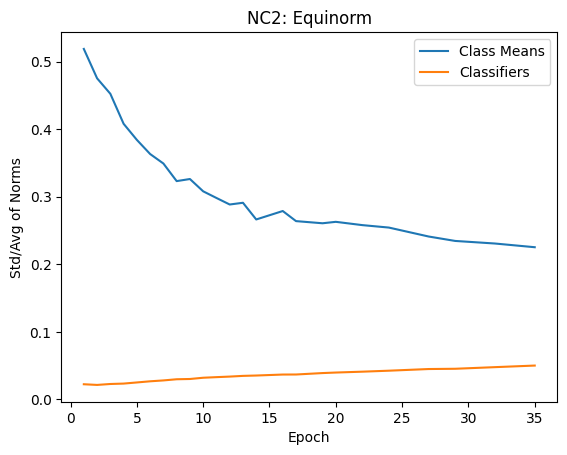

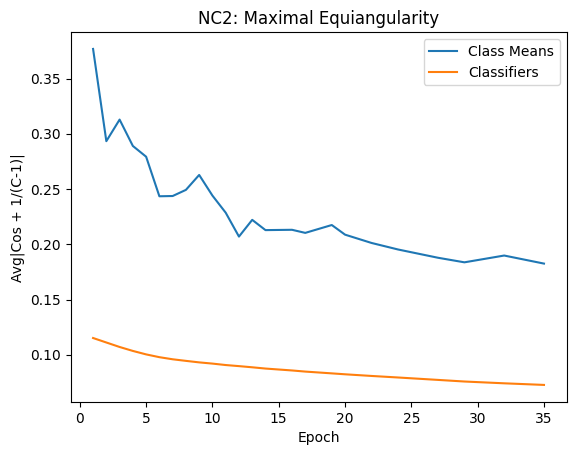

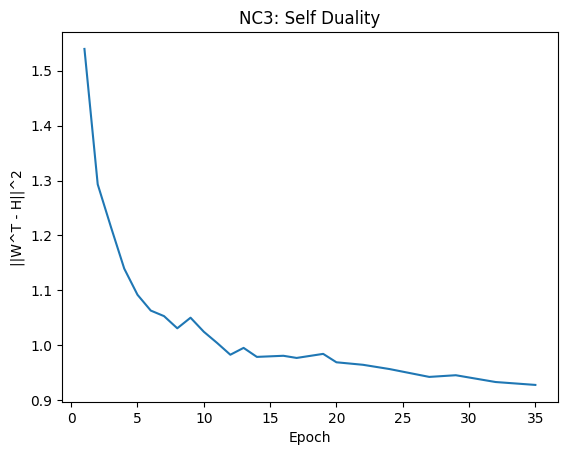

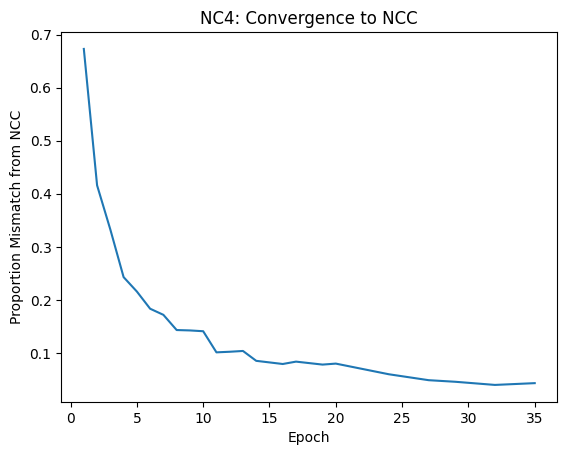

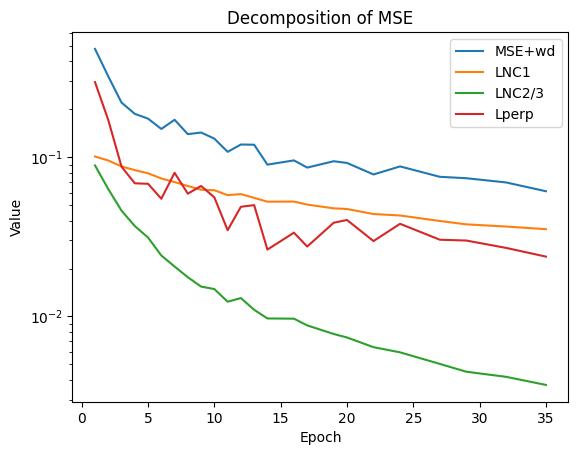

Train		Epoch: 36 [21/469 (4%)] 	Batch Loss: 0.014569 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:09,  6.46it/s]
Train		Epoch: 37 [21/469 (4%)] 	Batch Loss: 0.013893 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:08,  6.52it/s]
Train		Epoch: 38 [21/469 (4%)] 	Batch Loss: 0.012331 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:06,  6.78it/s]
Analysis Cov	Epoch: 38 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:40, 11.10it/s]


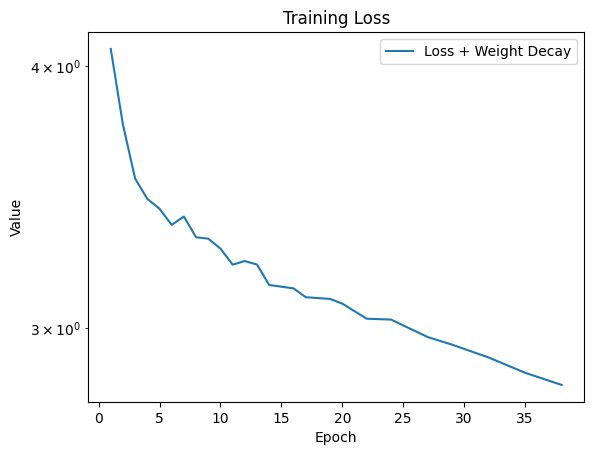

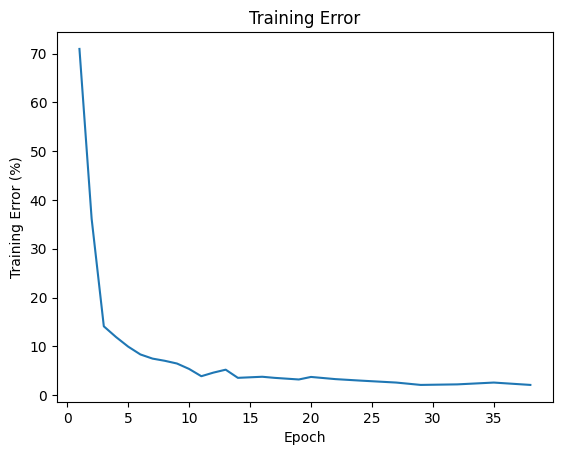

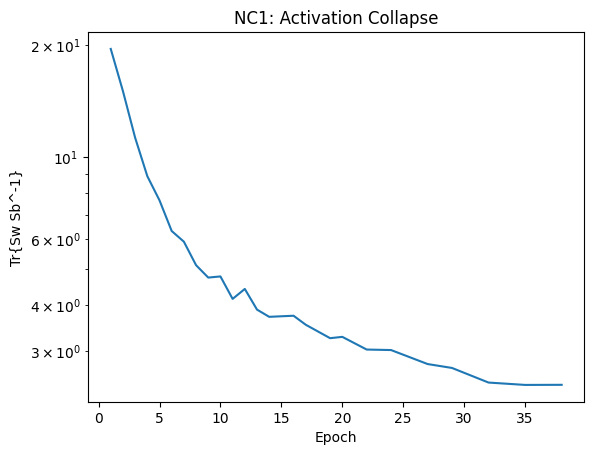

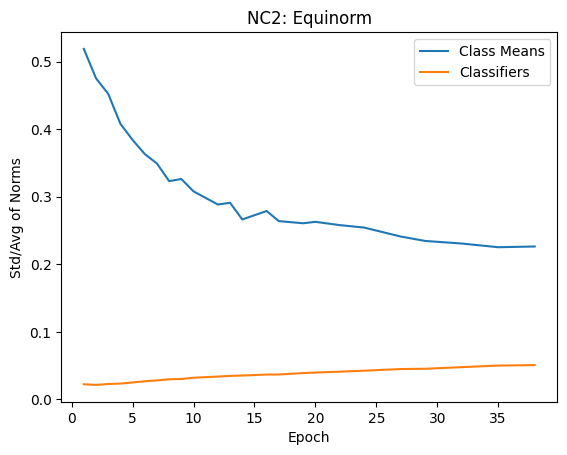

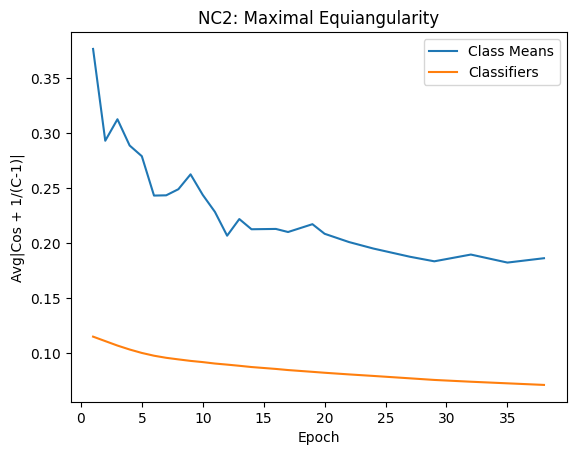

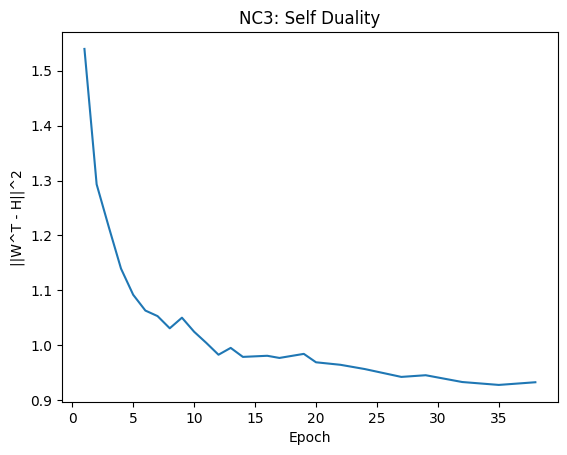

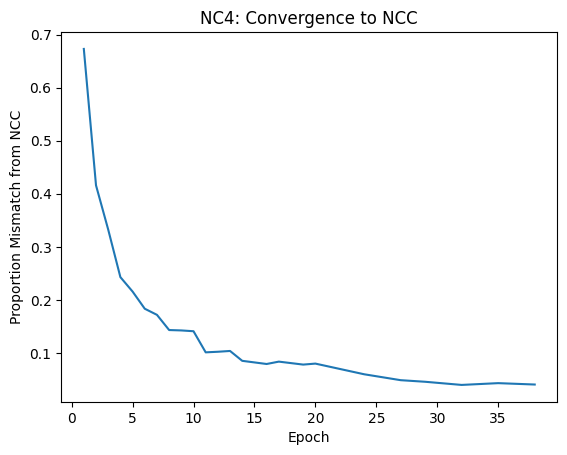

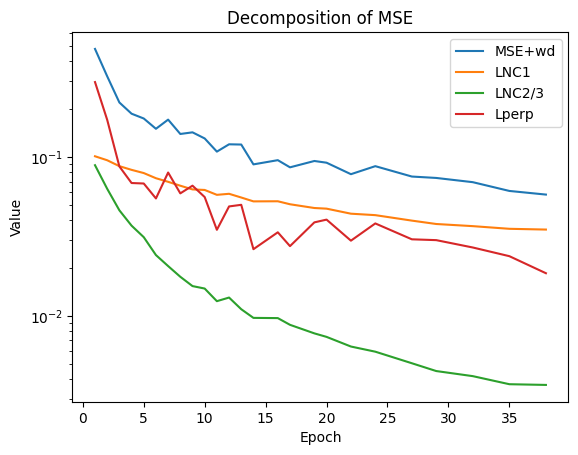

Train		Epoch: 39 [21/469 (4%)] 	Batch Loss: 0.012335 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:10,  6.32it/s]
Train		Epoch: 40 [21/469 (4%)] 	Batch Loss: 0.015918 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:07,  6.63it/s]
Train		Epoch: 41 [21/469 (4%)] 	Batch Loss: 0.013827 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:06,  6.71it/s]
Train		Epoch: 42 [21/469 (4%)] 	Batch Loss: 0.015165 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:08,  6.51it/s]
Analysis Cov	Epoch: 42 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:46,  9.54it/s]


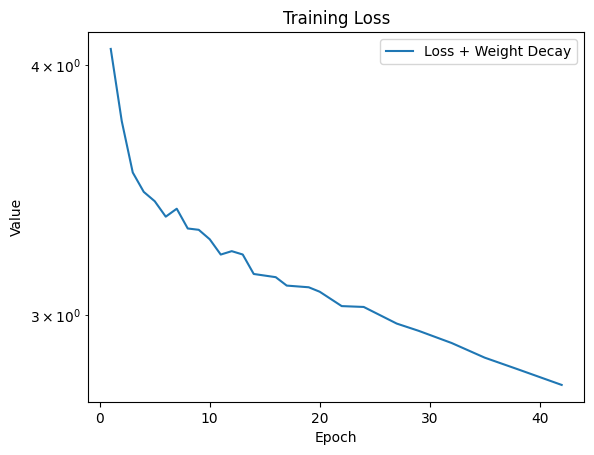

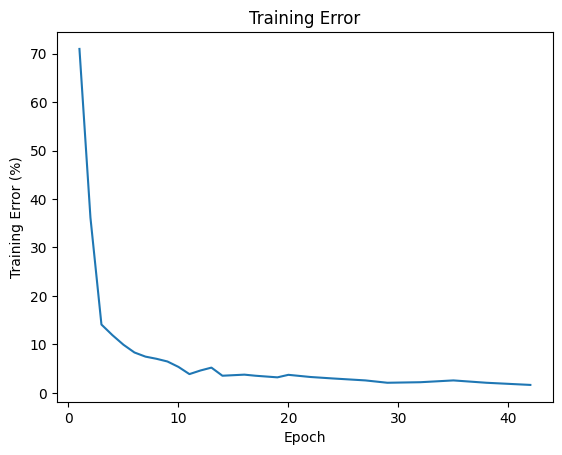

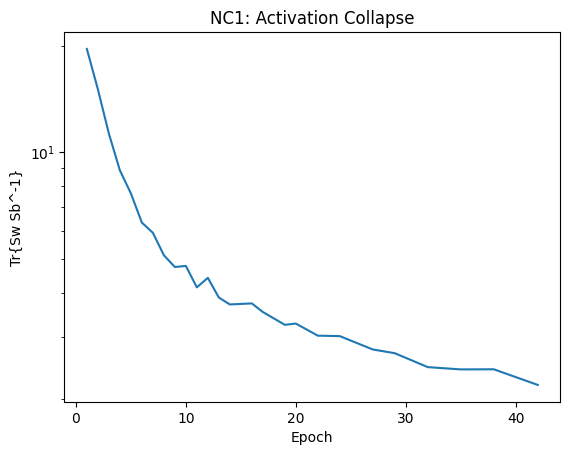

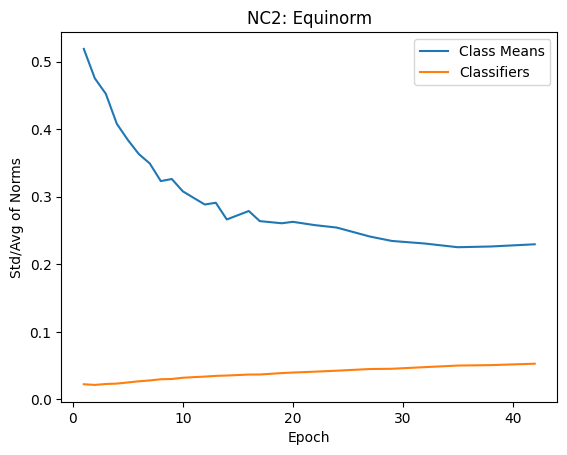

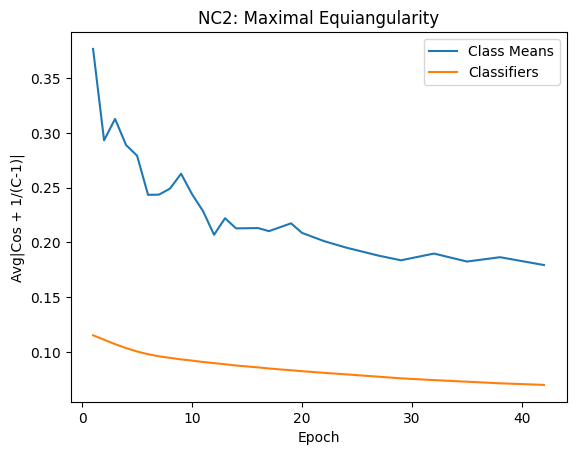

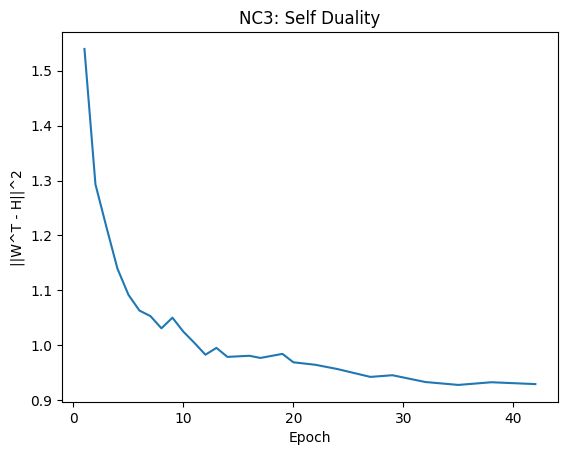

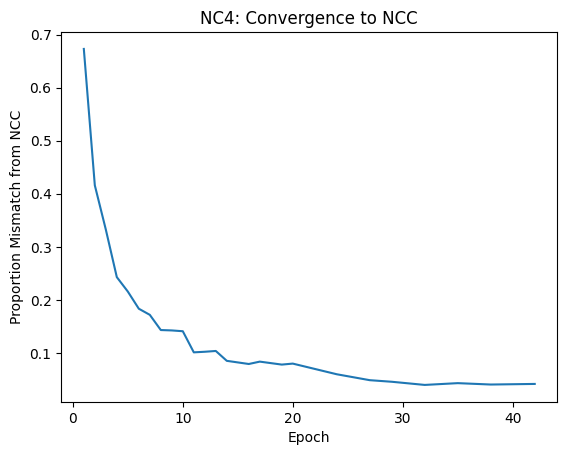

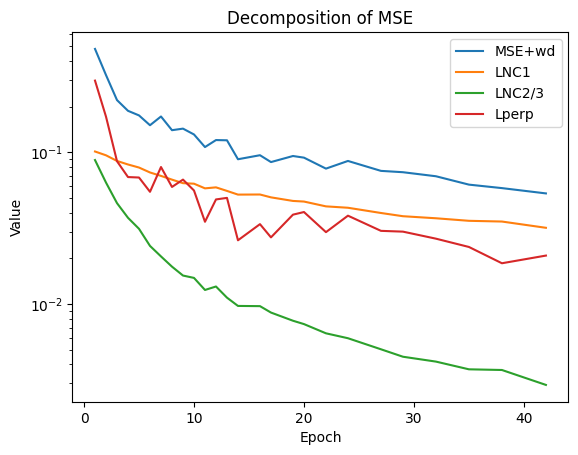

Train		Epoch: 43 [21/469 (4%)] 	Batch Loss: 0.013182 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:07,  6.62it/s]
Train		Epoch: 44 [21/469 (4%)] 	Batch Loss: 0.012406 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.59it/s]
Train		Epoch: 45 [21/469 (4%)] 	Batch Loss: 0.010126 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.55it/s]
Analysis Cov	Epoch: 45 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:41, 10.74it/s]


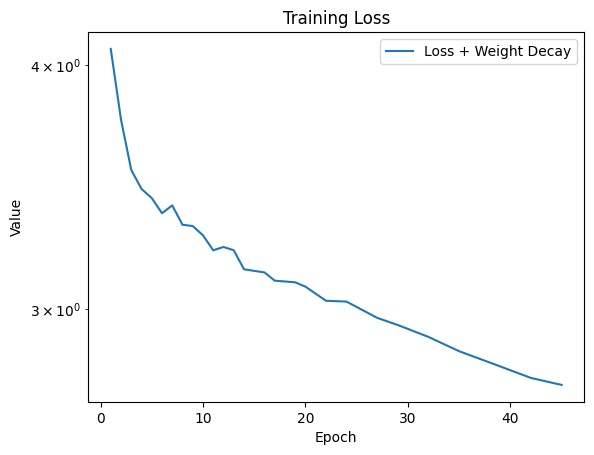

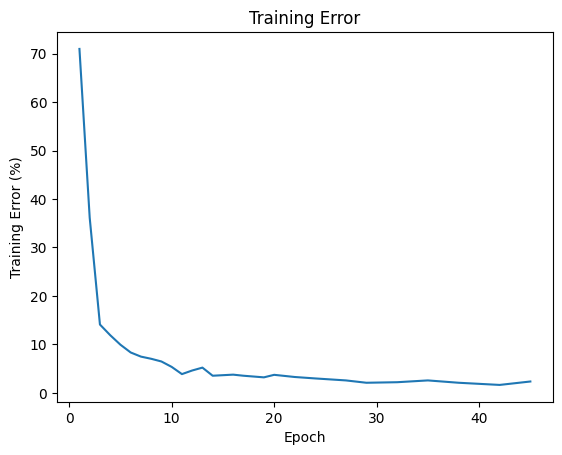

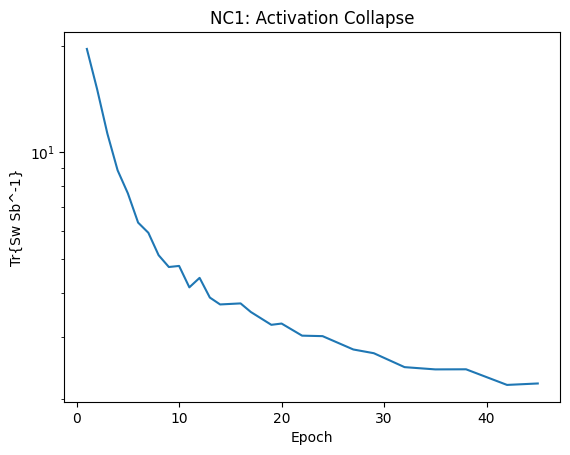

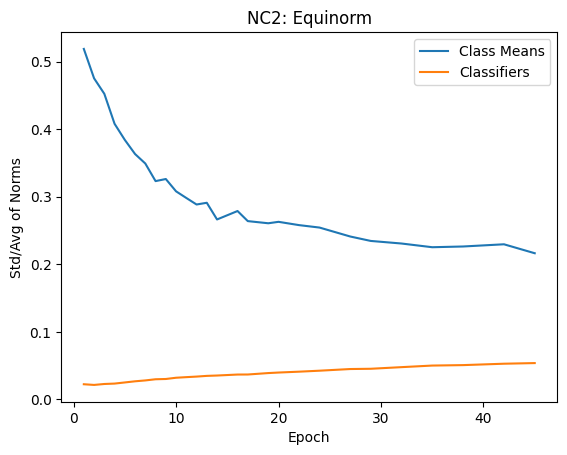

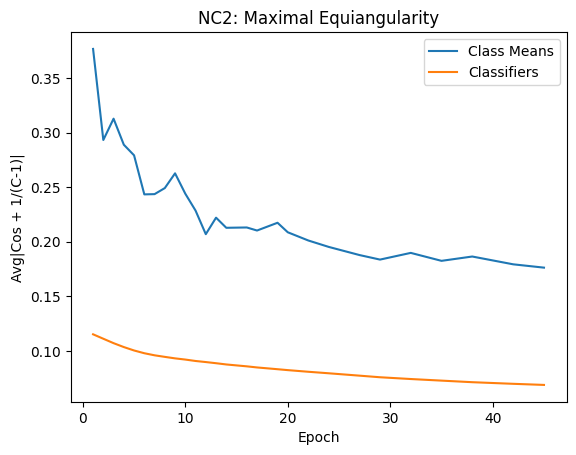

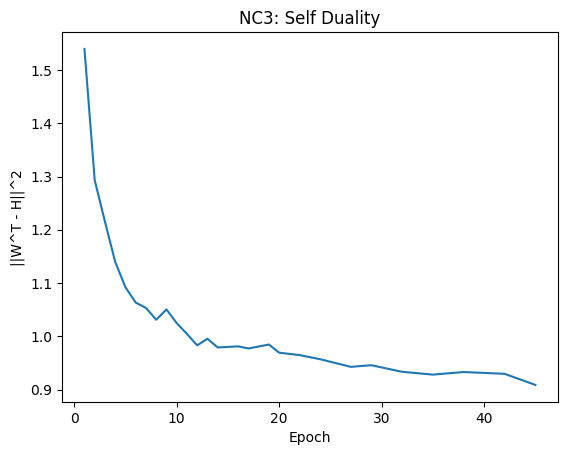

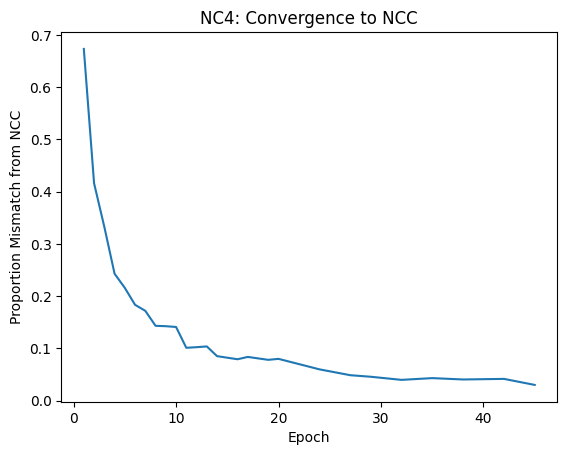

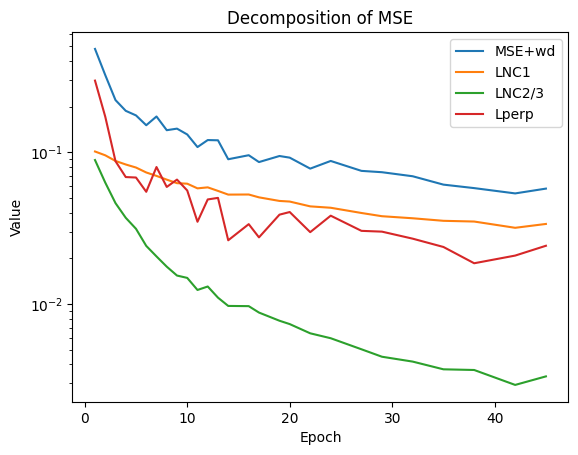

Train		Epoch: 46 [21/469 (4%)] 	Batch Loss: 0.011544 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.61it/s]
Train		Epoch: 47 [21/469 (4%)] 	Batch Loss: 0.011284 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.74it/s]
Train		Epoch: 48 [21/469 (4%)] 	Batch Loss: 0.009841 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:09,  6.43it/s]
Train		Epoch: 49 [21/469 (4%)] 	Batch Loss: 0.010197 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:08,  6.53it/s]
Train		Epoch: 50 [21/469 (4%)] 	Batch Loss: 0.013661 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.57it/s]
Analysis Cov	Epoch: 50 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.59it/s]


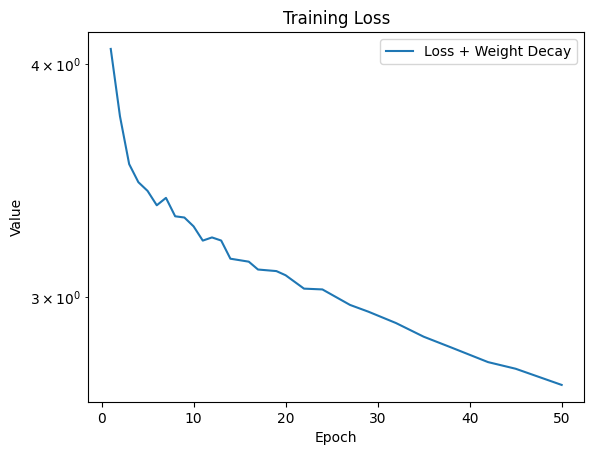

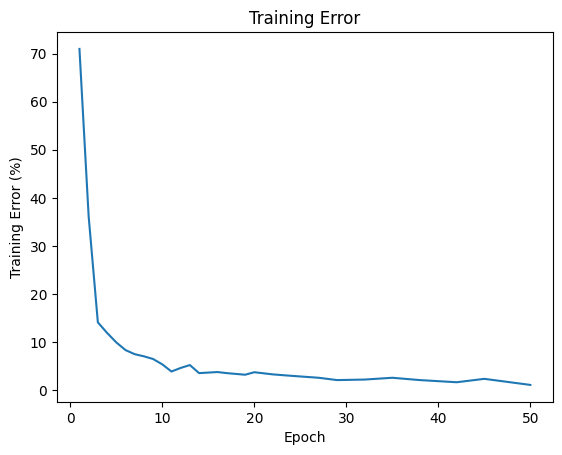

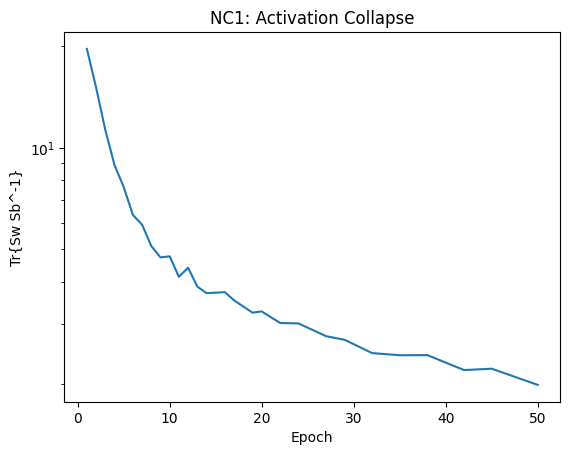

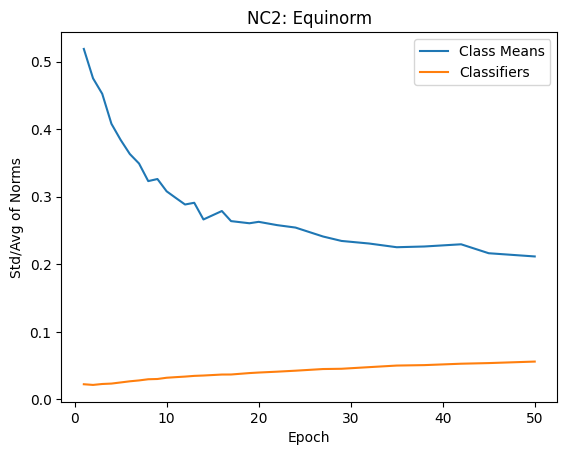

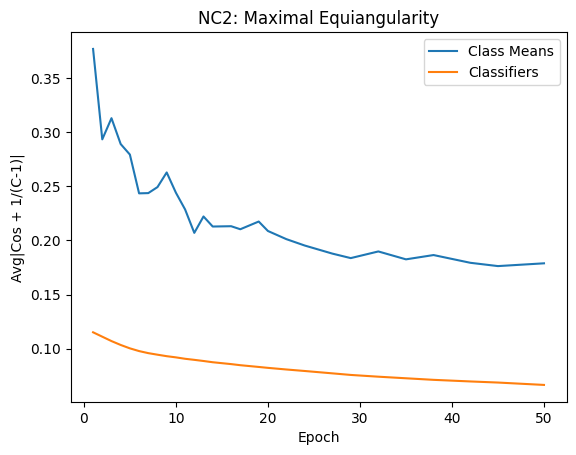

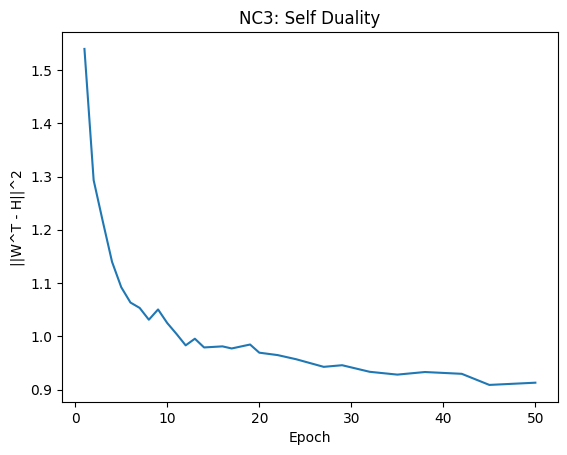

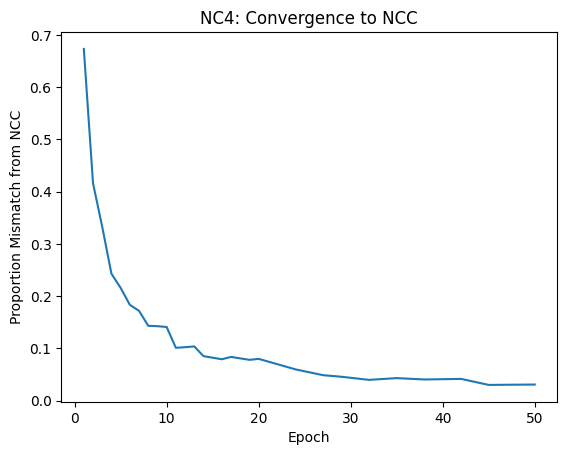

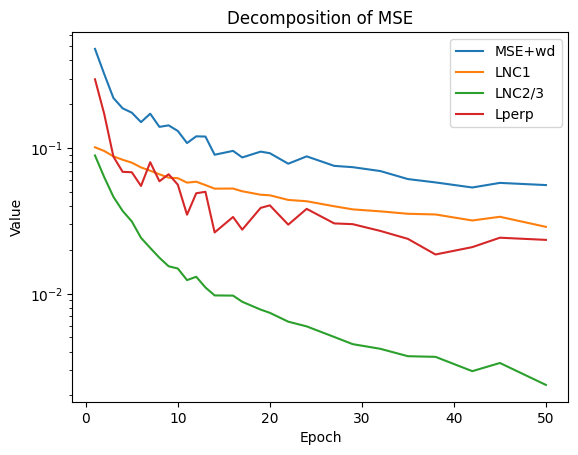

Train		Epoch: 51 [21/469 (4%)] 	Batch Loss: 0.012463 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:12,  6.17it/s]
Train		Epoch: 52 [21/469 (4%)] 	Batch Loss: 0.011761 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:07,  6.65it/s]
Train		Epoch: 53 [21/469 (4%)] 	Batch Loss: 0.009964 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.69it/s]
Train		Epoch: 54 [21/469 (4%)] 	Batch Loss: 0.012712 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.65it/s]
Analysis Cov	Epoch: 54 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:48,  9.19it/s]


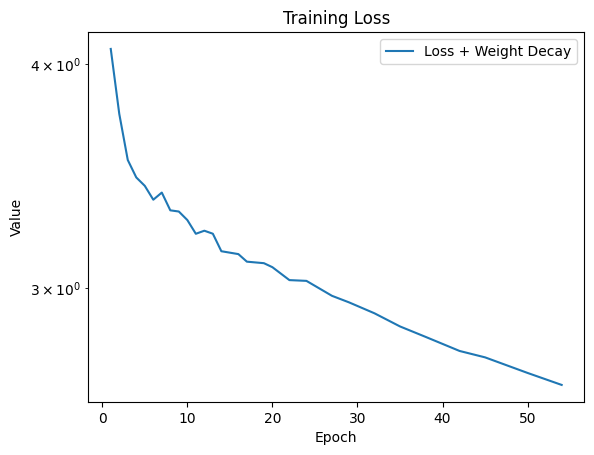

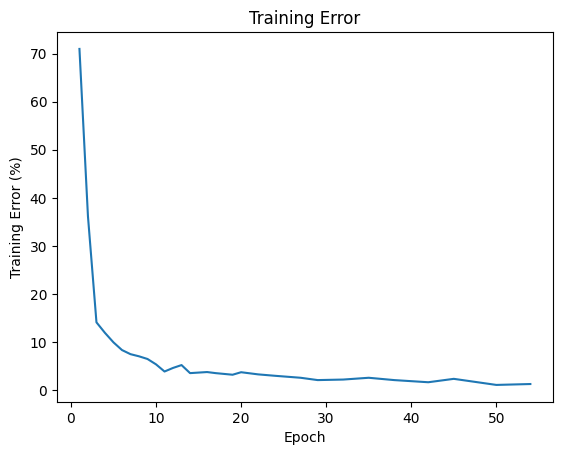

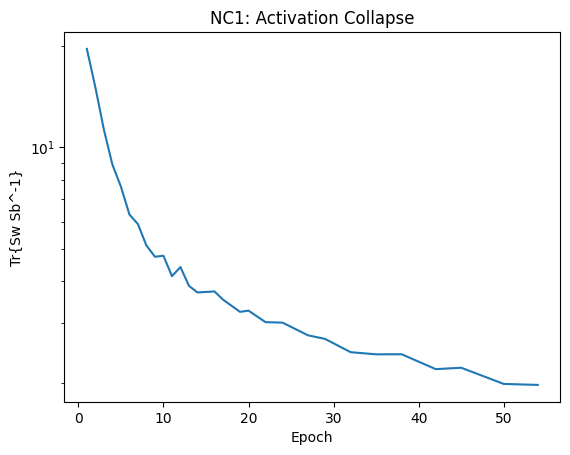

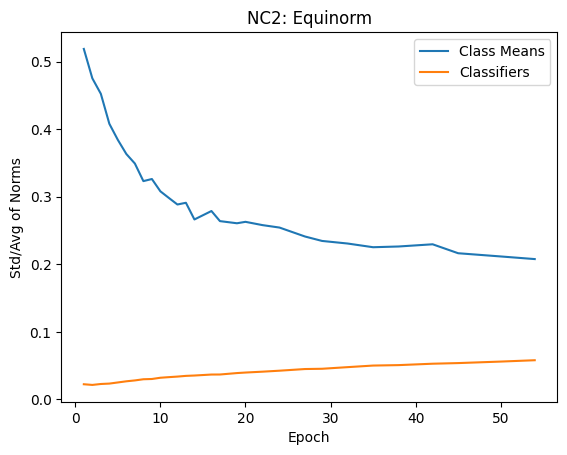

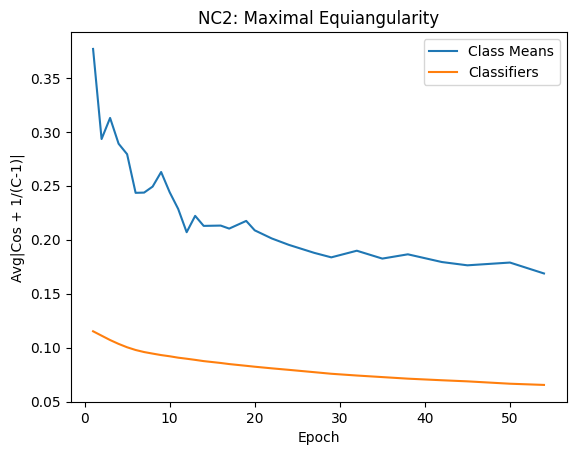

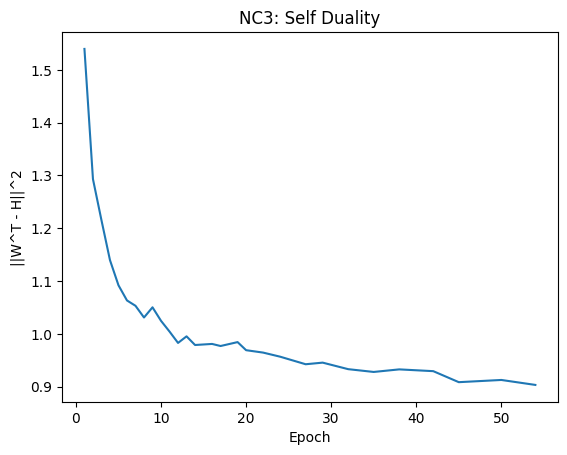

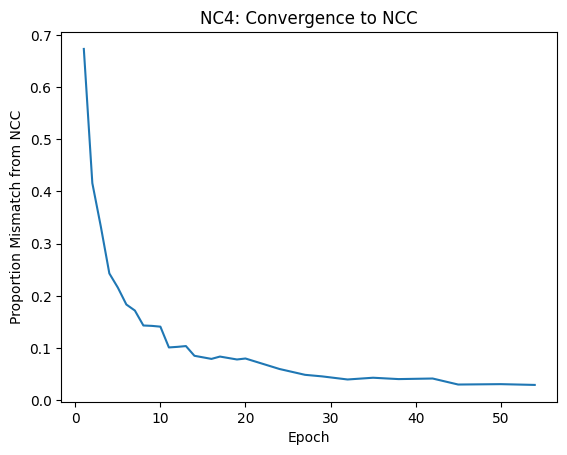

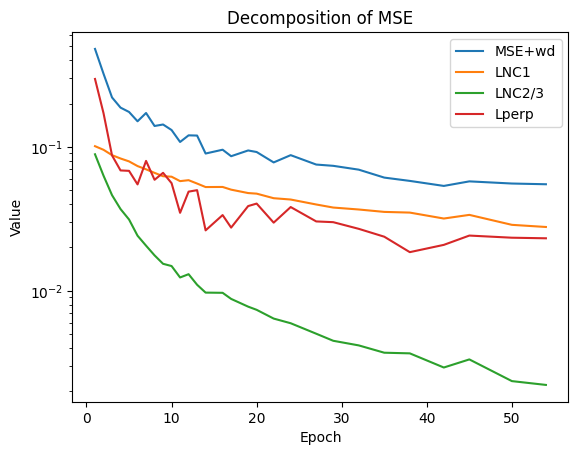

Train		Epoch: 55 [21/469 (4%)] 	Batch Loss: 0.011150 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:07,  6.67it/s]
Train		Epoch: 56 [21/469 (4%)] 	Batch Loss: 0.009160 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.76it/s]
Train		Epoch: 57 [21/469 (4%)] 	Batch Loss: 0.012209 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:09,  6.42it/s]
Train		Epoch: 58 [21/469 (4%)] 	Batch Loss: 0.008176 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:08,  6.50it/s]
Train		Epoch: 59 [21/469 (4%)] 	Batch Loss: 0.011036 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.71it/s]
Analysis Cov	Epoch: 59 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.66it/s]


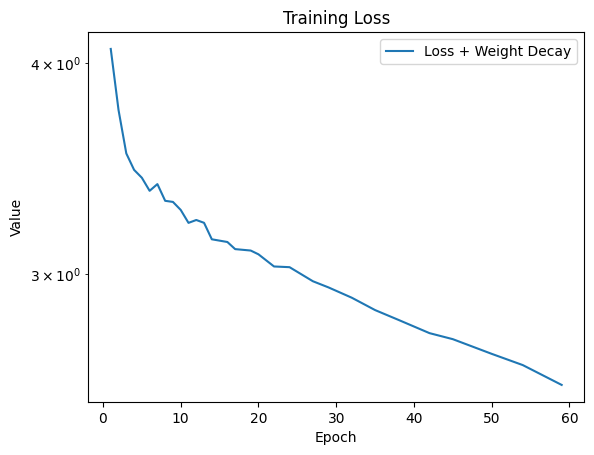

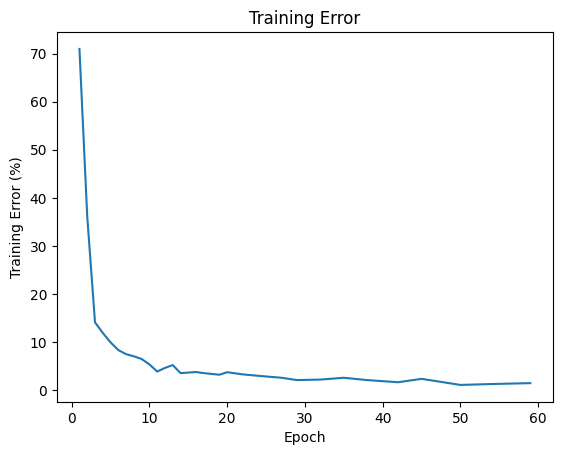

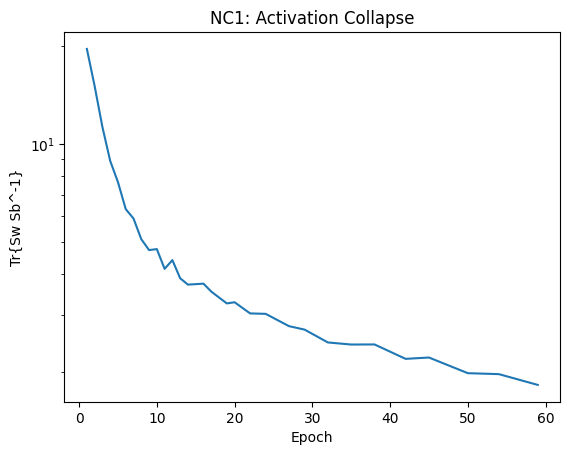

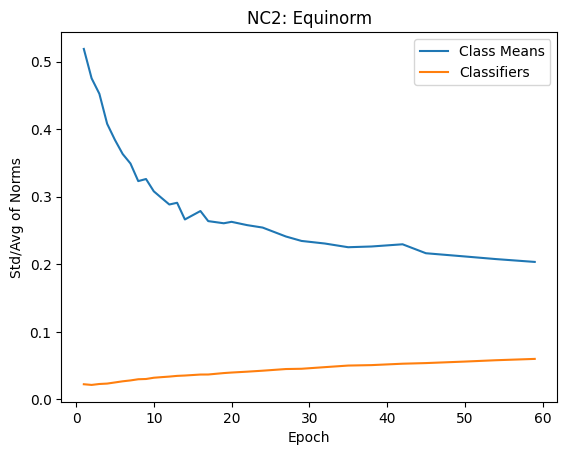

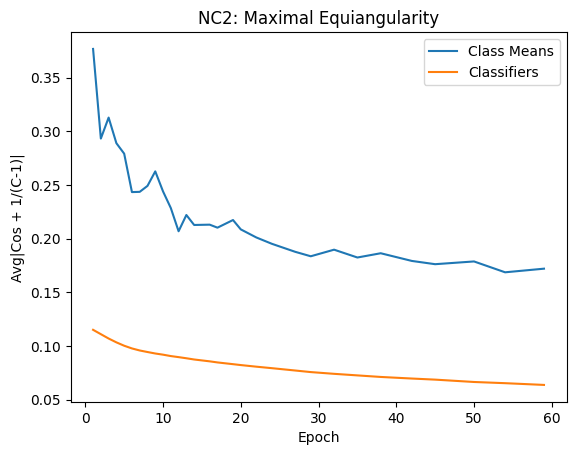

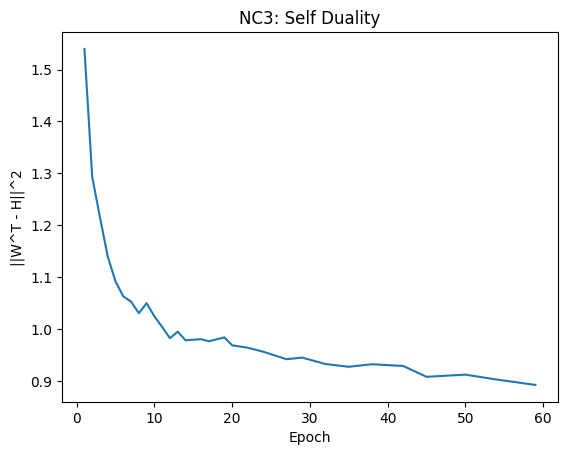

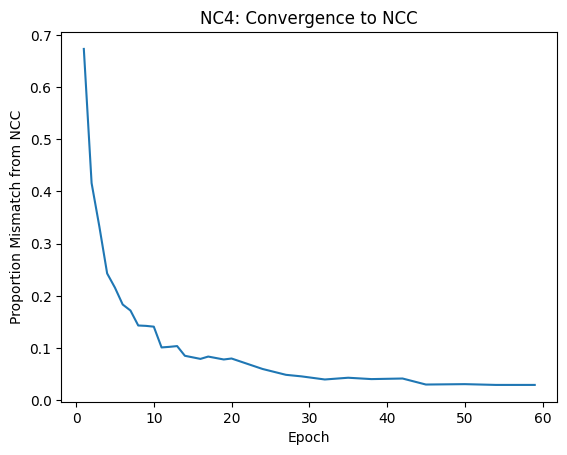

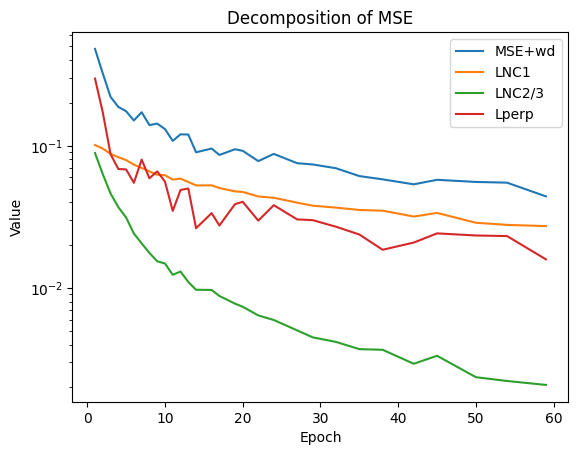

Train		Epoch: 60 [21/469 (4%)] 	Batch Loss: 0.008407 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:13,  6.13it/s]
Train		Epoch: 61 [21/469 (4%)] 	Batch Loss: 0.010879 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.72it/s]
Train		Epoch: 62 [21/469 (4%)] 	Batch Loss: 0.009059 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:07,  6.66it/s]
Train		Epoch: 63 [21/469 (4%)] 	Batch Loss: 0.007702 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Train		Epoch: 64 [21/469 (4%)] 	Batch Loss: 0.007847 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:11,  6.24it/s]
Train		Epoch: 65 [21/469 (4%)] 	Batch Loss: 0.012157 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:10,  6.39it/s]
Analysis Cov	Epoch: 65 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:41, 10.79it/s]


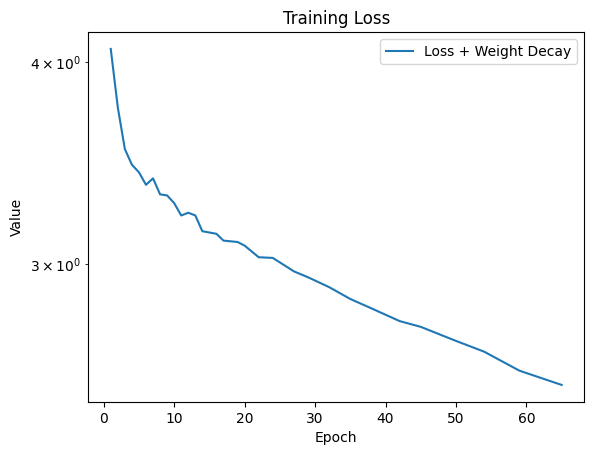

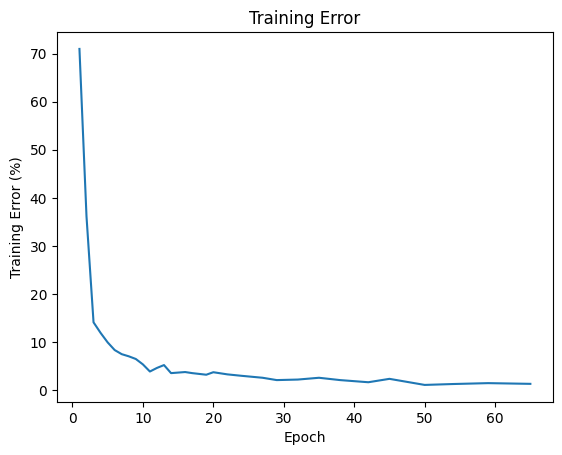

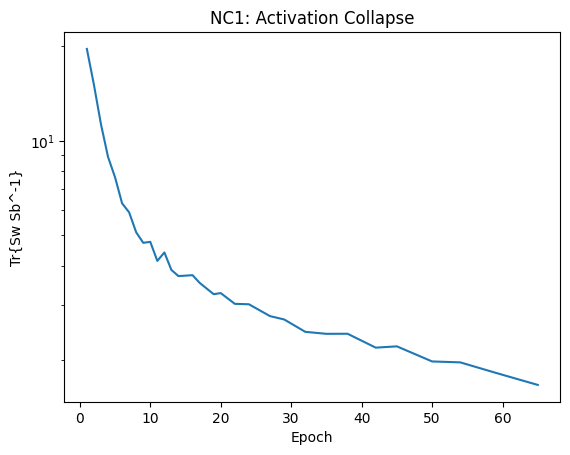

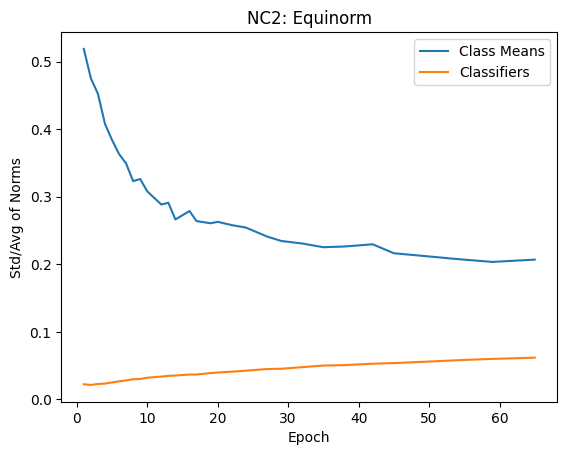

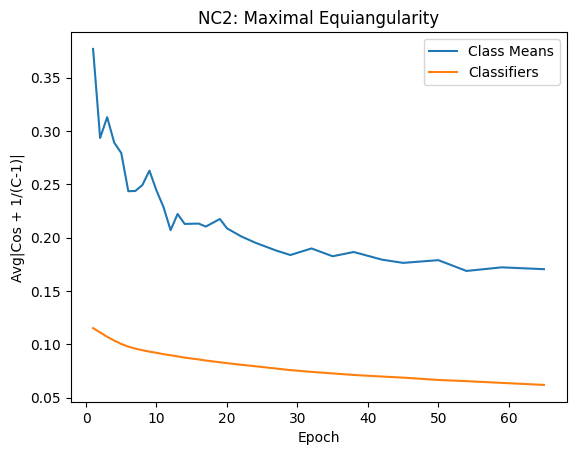

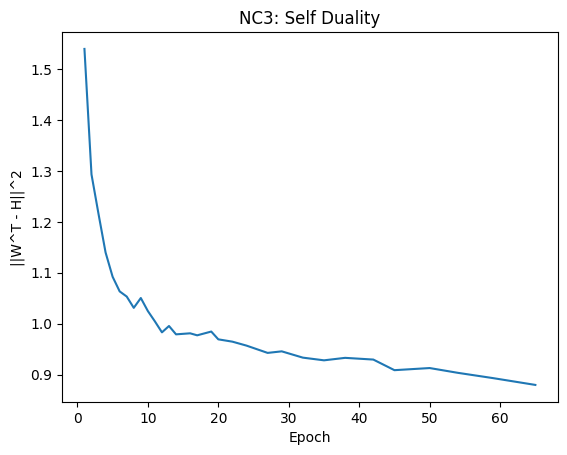

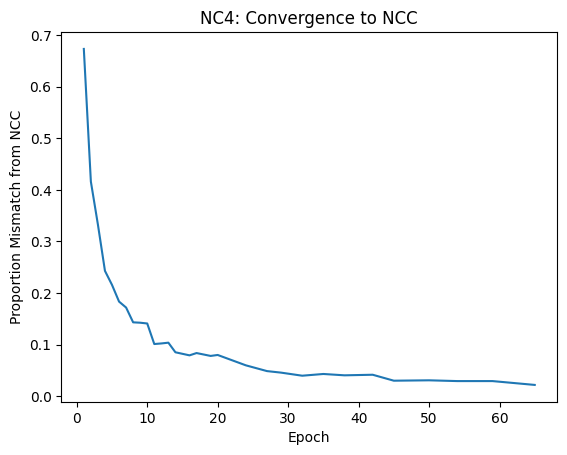

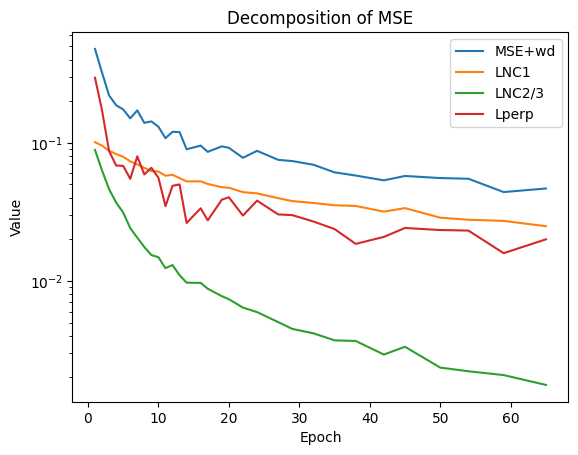

Train		Epoch: 66 [21/469 (4%)] 	Batch Loss: 0.008251 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:09,  6.47it/s]
Train		Epoch: 67 [21/469 (4%)] 	Batch Loss: 0.010215 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:09,  6.44it/s]
Train		Epoch: 68 [21/469 (4%)] 	Batch Loss: 0.007912 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.67it/s]
Train		Epoch: 69 [21/469 (4%)] 	Batch Loss: 0.011791 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:05,  6.84it/s]
Train		Epoch: 70 [21/469 (4%)] 	Batch Loss: 0.011612 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Train		Epoch: 71 [21/469 (4%)] 	Batch Loss: 0.006516 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Analysis Cov	Epoch: 71 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:47,  9.44it/s]


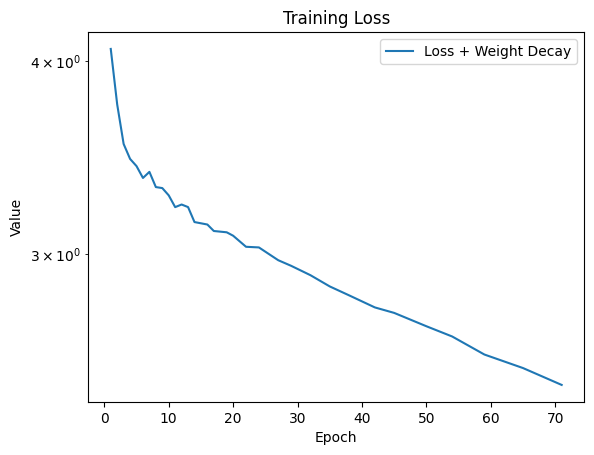

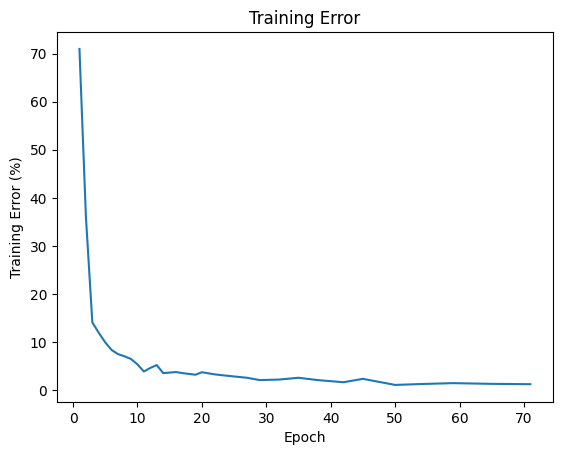

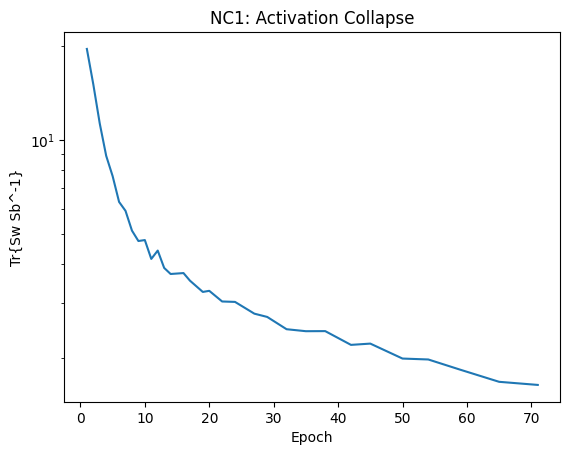

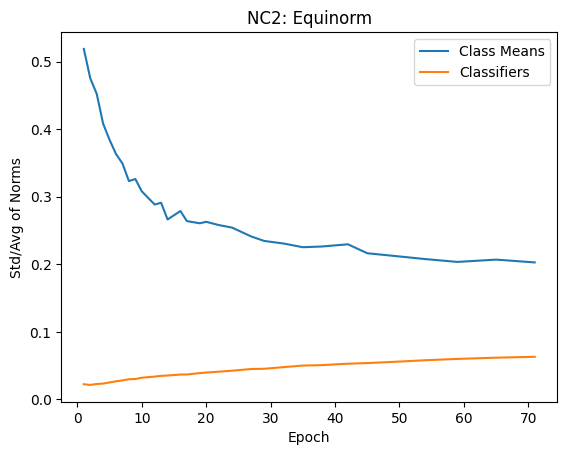

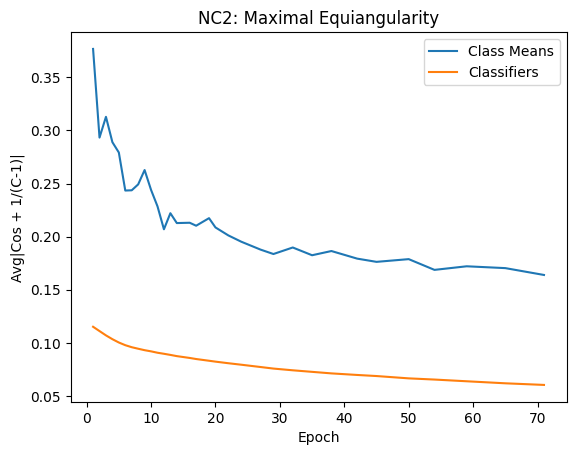

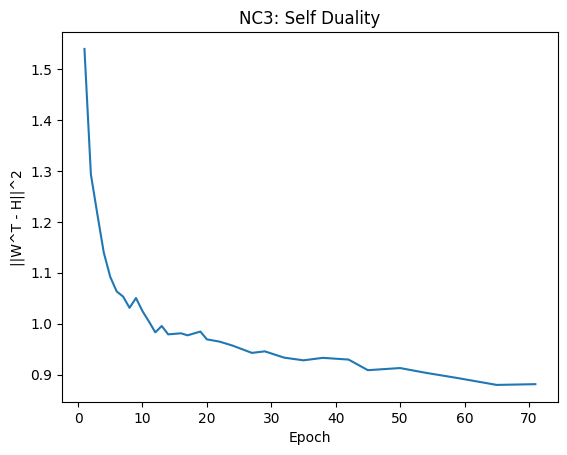

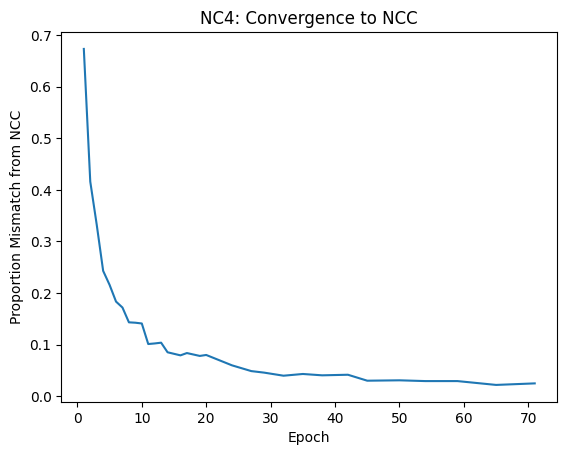

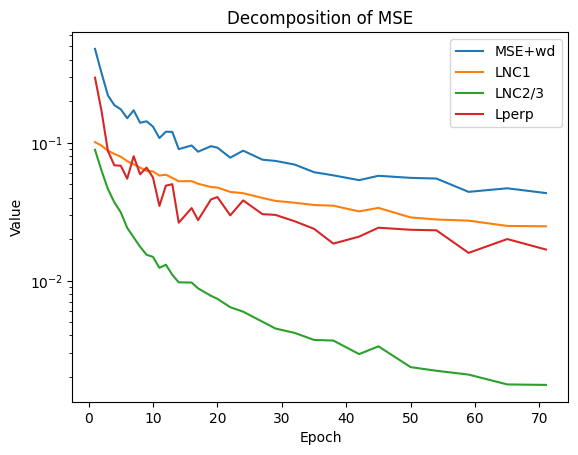

Train		Epoch: 72 [21/469 (4%)] 	Batch Loss: 0.008682 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.64it/s]
Train		Epoch: 73 [21/469 (4%)] 	Batch Loss: 0.010931 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Train		Epoch: 74 [21/469 (4%)] 	Batch Loss: 0.008201 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:10,  6.35it/s]
Train		Epoch: 75 [21/469 (4%)] 	Batch Loss: 0.009678 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.51it/s]
Train		Epoch: 76 [21/469 (4%)] 	Batch Loss: 0.010735 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.69it/s]
Train		Epoch: 77 [21/469 (4%)] 	Batch Loss: 0.005876 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.78it/s]
Analysis Cov	Epoch: 77 [21/469 (4%)]:   4%|▍         | 21/469 [00:02<00:48,  9.20it/s]


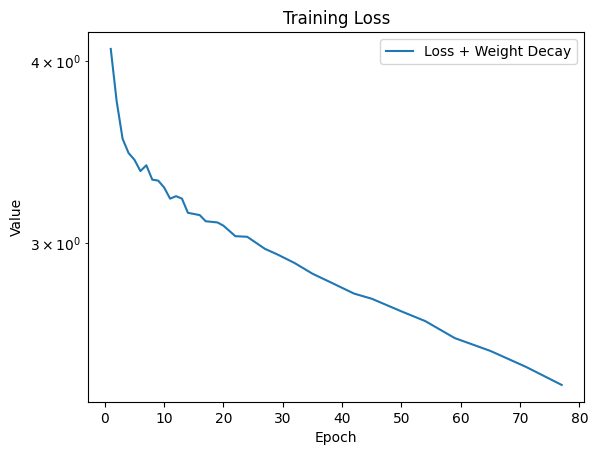

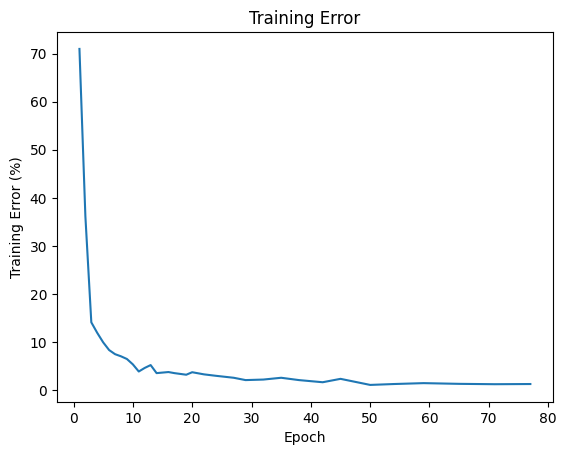

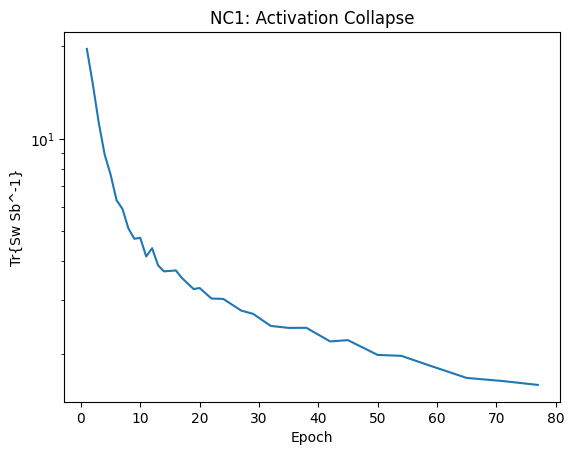

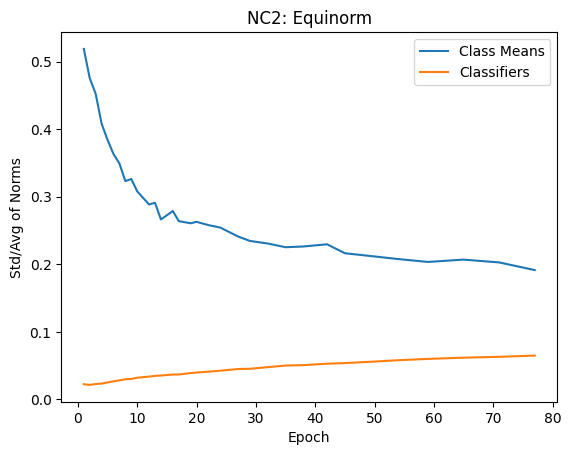

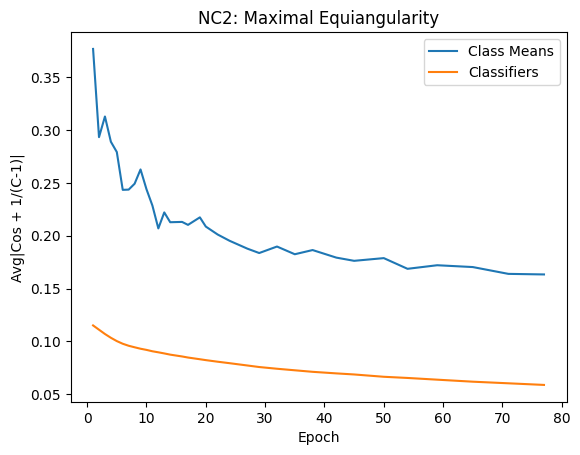

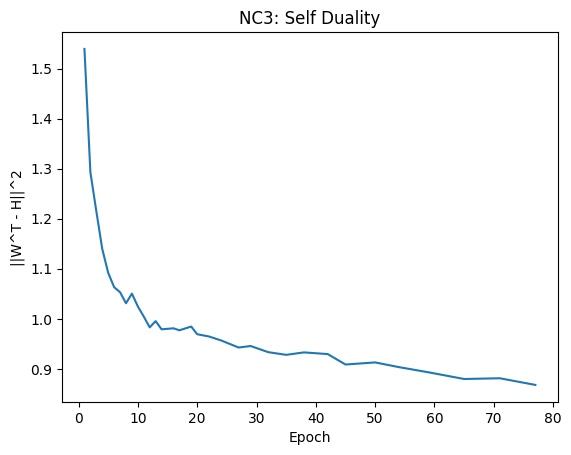

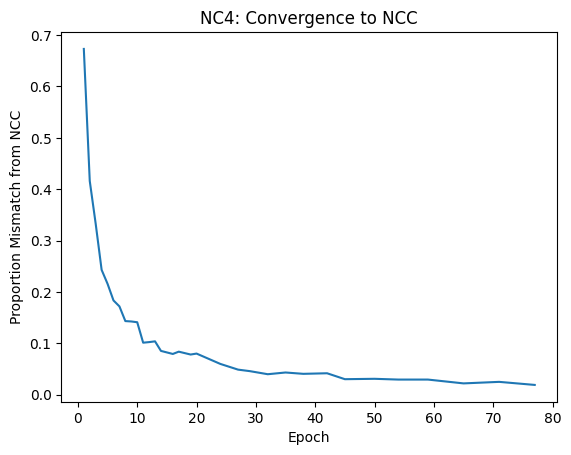

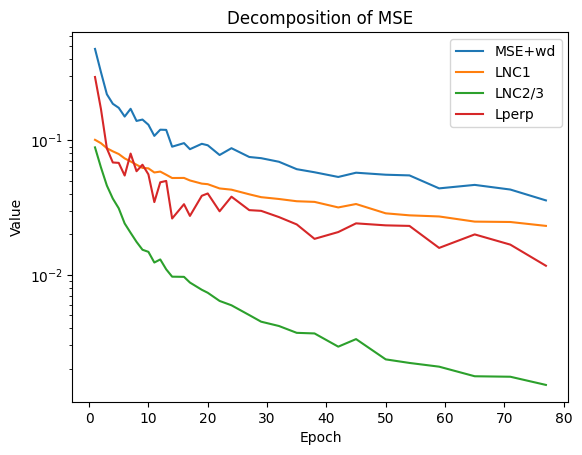

Train		Epoch: 78 [21/469 (4%)] 	Batch Loss: 0.008479 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.71it/s]
Train		Epoch: 79 [21/469 (4%)] 	Batch Loss: 0.011019 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:05,  6.83it/s]
Train		Epoch: 80 [21/469 (4%)] 	Batch Loss: 0.008458 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.74it/s]
Train		Epoch: 81 [21/469 (4%)] 	Batch Loss: 0.010949 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:09,  6.45it/s]
Train		Epoch: 82 [21/469 (4%)] 	Batch Loss: 0.008011 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.68it/s]
Train		Epoch: 83 [21/469 (4%)] 	Batch Loss: 0.008794 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:06,  6.71it/s]
Train		Epoch: 84 [21/469 (4%)] 	Batch Loss: 0.008109 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.82it/s]
Train		Epoch: 85 [21/469 (4%)] 	Batch Loss: 0.006489 	Batch Accuracy: 0.992188:   4%|▍         | 

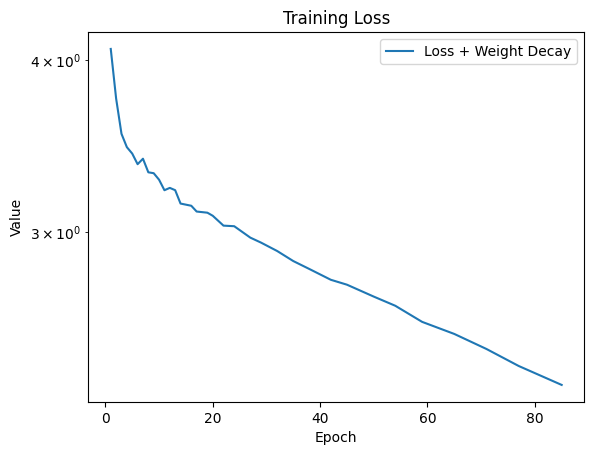

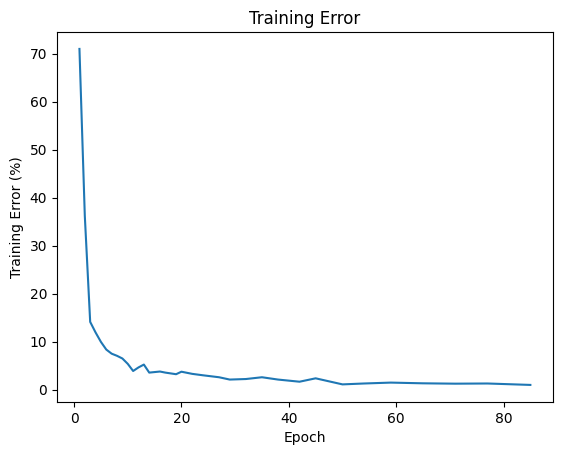

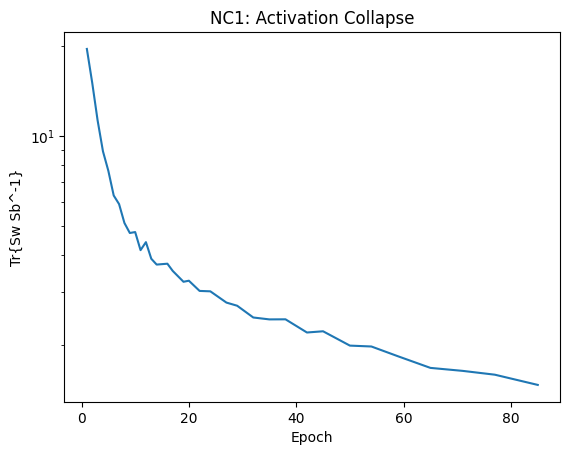

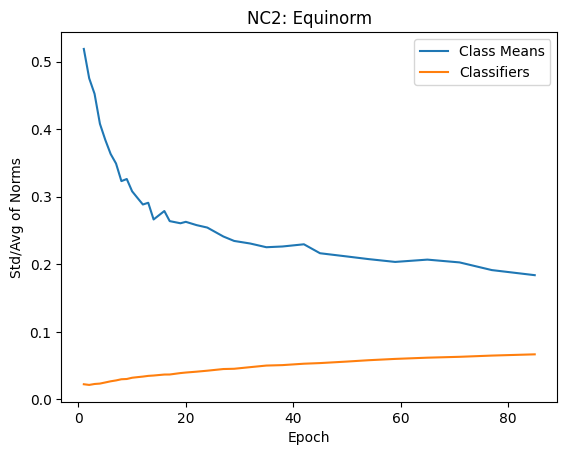

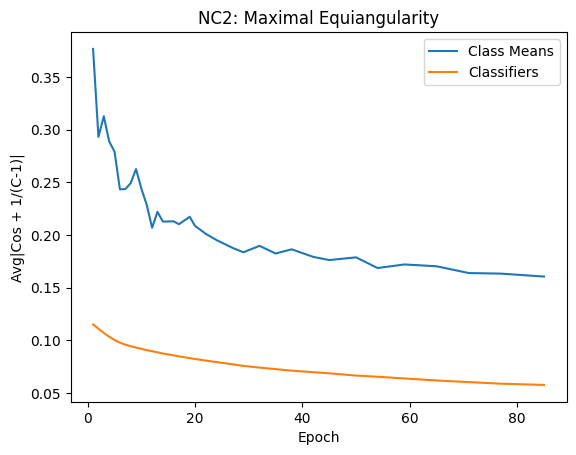

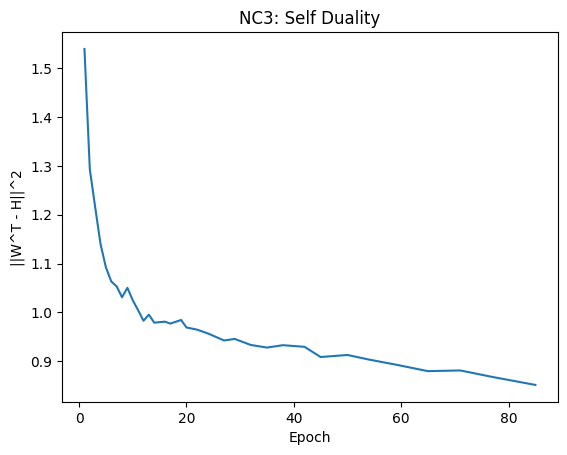

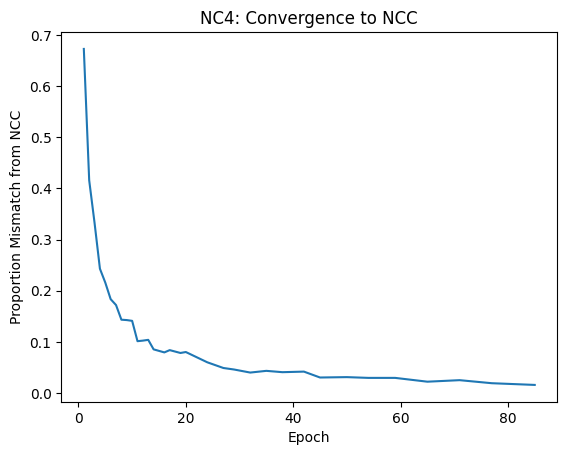

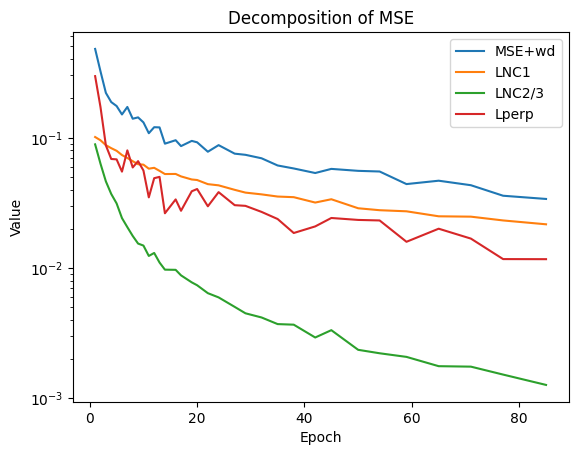

Train		Epoch: 86 [21/469 (4%)] 	Batch Loss: 0.006745 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.61it/s]
Train		Epoch: 87 [21/469 (4%)] 	Batch Loss: 0.006015 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:09,  6.43it/s]
Train		Epoch: 88 [21/469 (4%)] 	Batch Loss: 0.012819 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:12,  6.22it/s]
Train		Epoch: 89 [21/469 (4%)] 	Batch Loss: 0.007584 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.74it/s]
Train		Epoch: 90 [21/469 (4%)] 	Batch Loss: 0.009097 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:06,  6.78it/s]
Train		Epoch: 91 [21/469 (4%)] 	Batch Loss: 0.008917 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:06,  6.77it/s]
Train		Epoch: 92 [21/469 (4%)] 	Batch Loss: 0.009181 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:11,  6.29it/s]
Analysis Cov	Epoch: 92 [21/469 (4%)]:   4%|▍         | 21/469 [00:01<00:42, 10.63it/s]


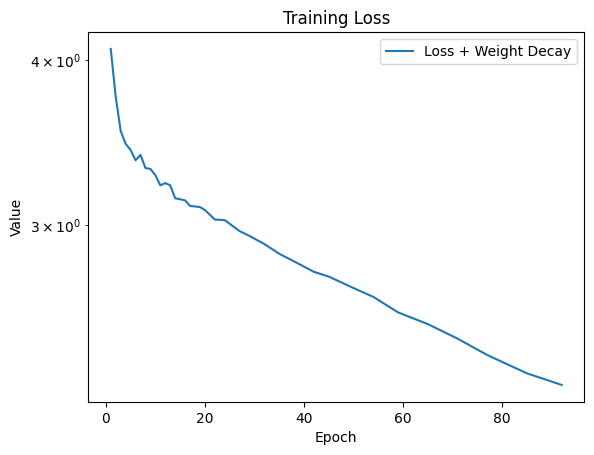

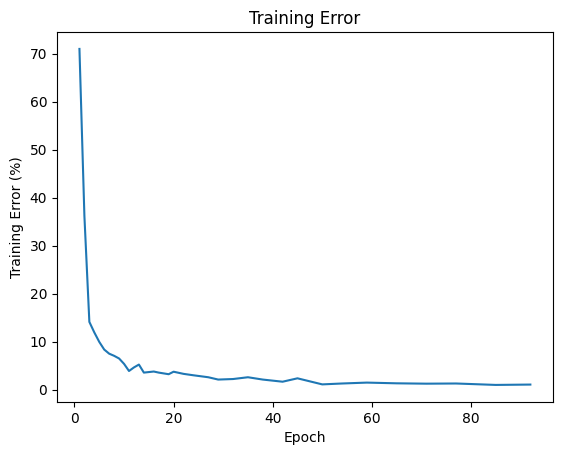

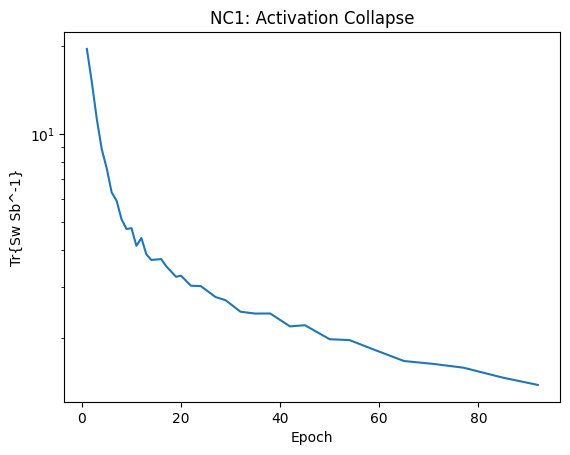

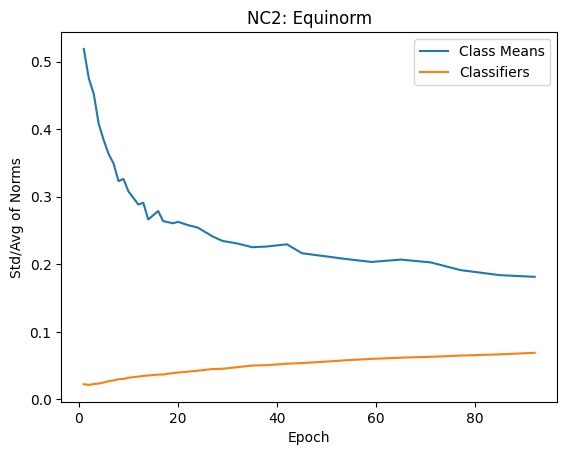

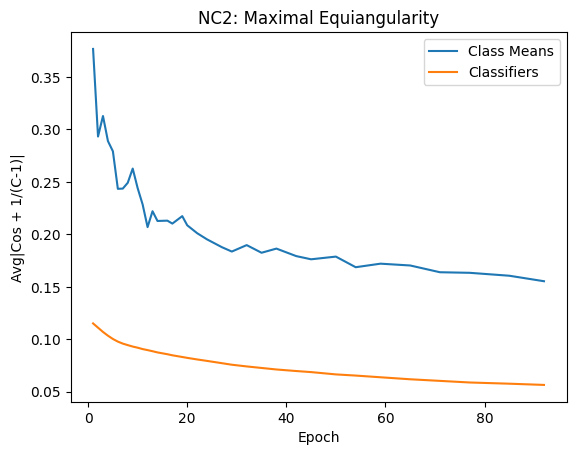

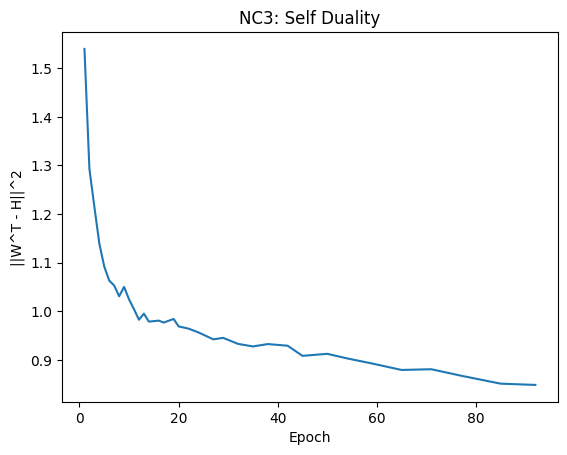

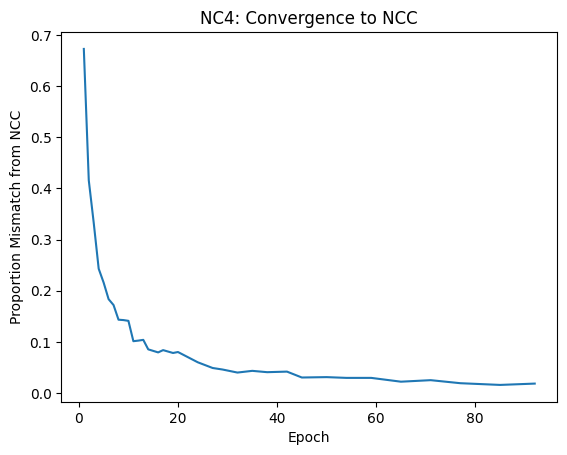

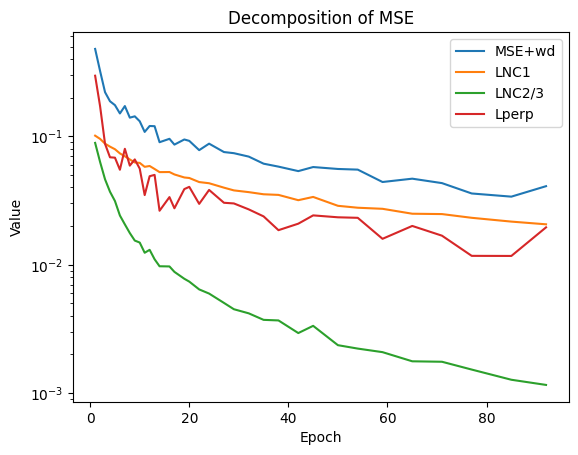

Train		Epoch: 93 [21/469 (4%)] 	Batch Loss: 0.006259 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:07,  6.67it/s]
Train		Epoch: 94 [21/469 (4%)] 	Batch Loss: 0.007511 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:07,  6.61it/s]
Train		Epoch: 95 [21/469 (4%)] 	Batch Loss: 0.007691 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:10,  6.34it/s]
Train		Epoch: 96 [21/469 (4%)] 	Batch Loss: 0.008066 	Batch Accuracy: 0.960938:   4%|▍         | 21/469 [00:03<01:06,  6.73it/s]
Train		Epoch: 97 [21/469 (4%)] 	Batch Loss: 0.010873 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:05,  6.79it/s]
Train		Epoch: 98 [21/469 (4%)] 	Batch Loss: 0.010505 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.74it/s]
Train		Epoch: 99 [21/469 (4%)] 	Batch Loss: 0.007397 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:09,  6.48it/s]
Train		Epoch: 100 [21/469 (4%)] 	Batch Loss: 0.006539 	Batch Accuracy: 0.992188:   4%|▍         |

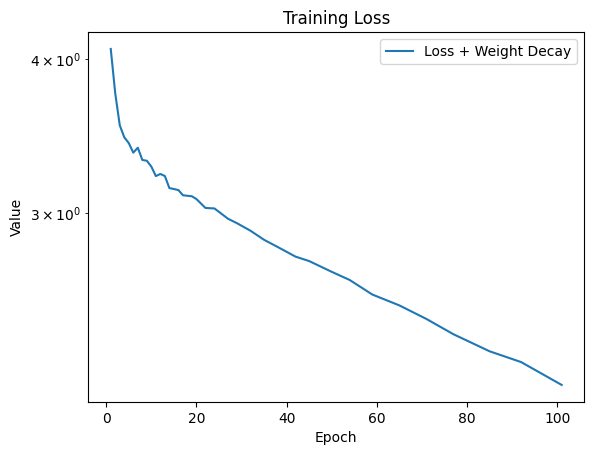

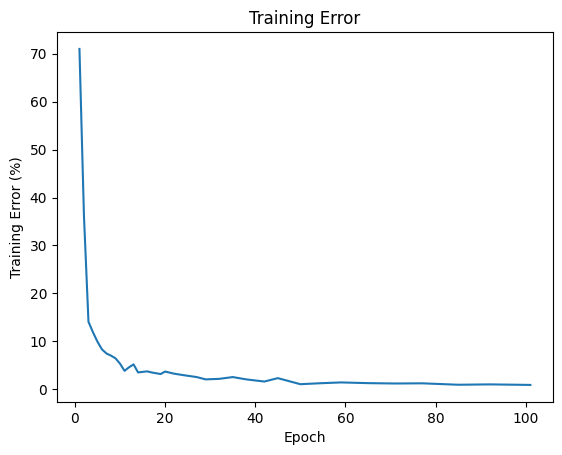

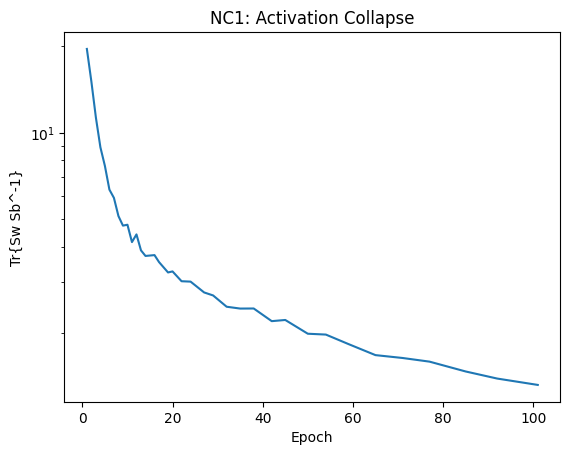

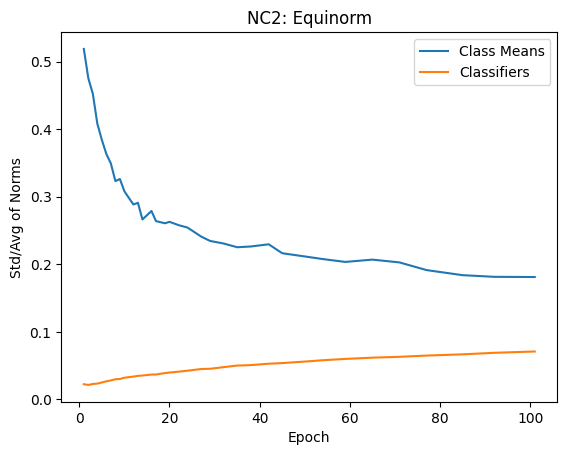

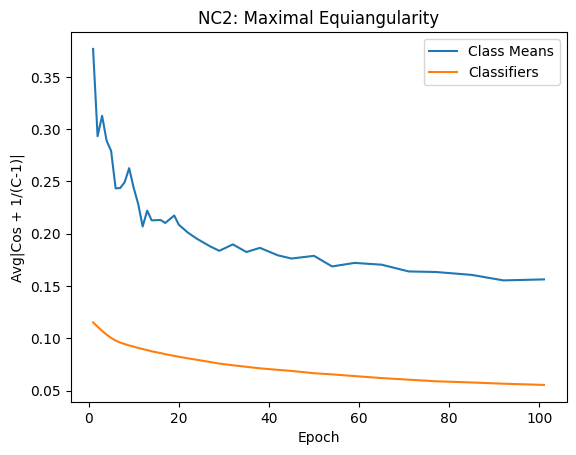

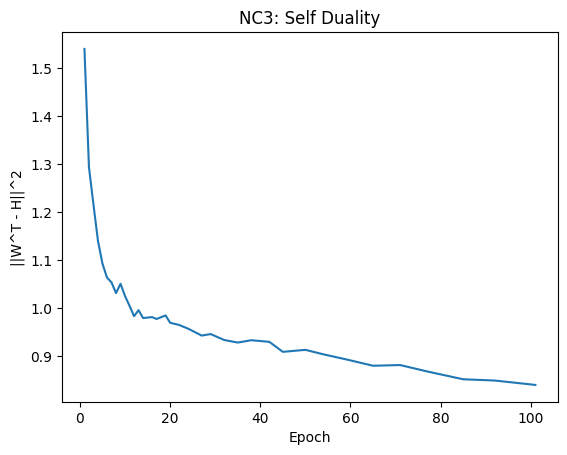

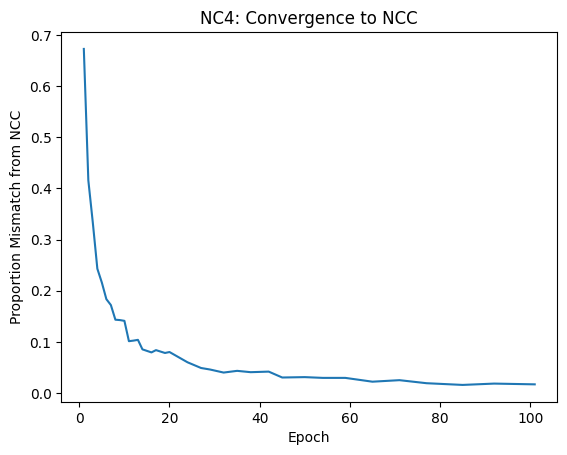

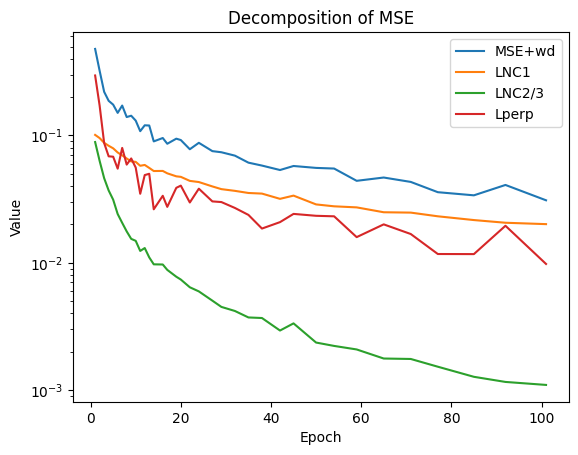

Train		Epoch: 102 [21/469 (4%)] 	Batch Loss: 0.006242 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:11,  6.28it/s]
Train		Epoch: 103 [21/469 (4%)] 	Batch Loss: 0.009684 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Train		Epoch: 104 [21/469 (4%)] 	Batch Loss: 0.009079 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.71it/s]
Train		Epoch: 105 [21/469 (4%)] 	Batch Loss: 0.007806 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.72it/s]
Train		Epoch: 106 [21/469 (4%)] 	Batch Loss: 0.008571 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:08,  6.57it/s]
Train		Epoch: 107 [21/469 (4%)] 	Batch Loss: 0.007210 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.54it/s]
Train		Epoch: 108 [21/469 (4%)] 	Batch Loss: 0.006268 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Train		Epoch: 109 [21/469 (4%)] 	Batch Loss: 0.006196 	Batch Accuracy: 0.992188:   4%|▍   

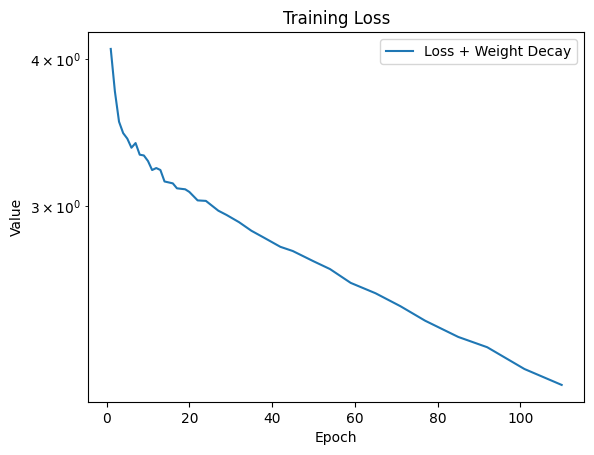

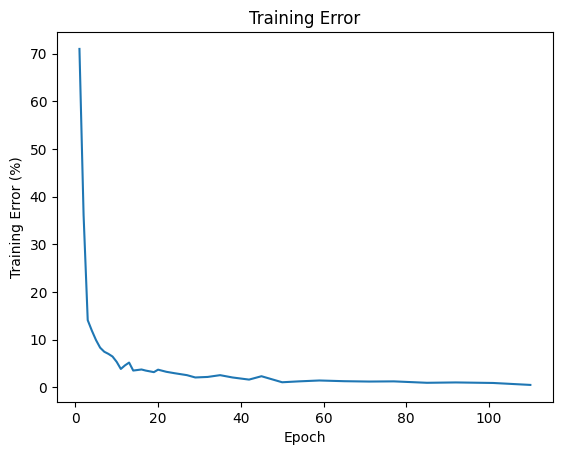

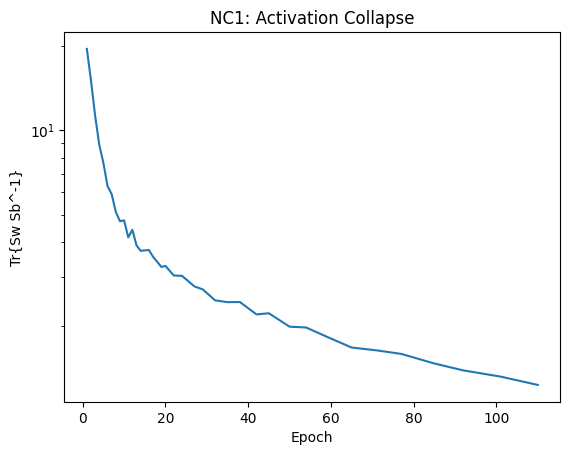

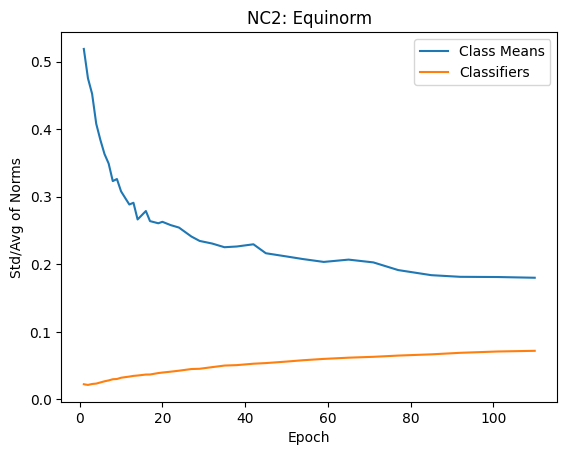

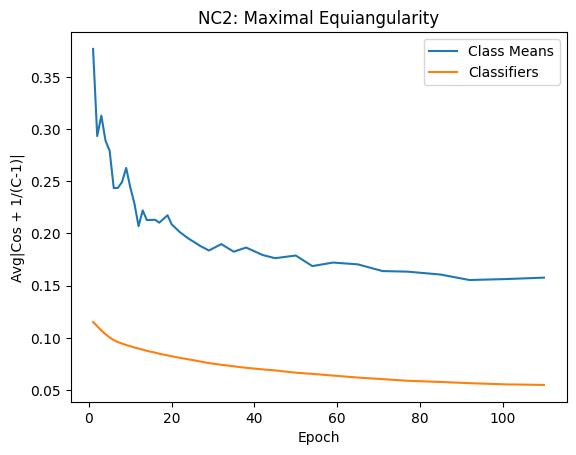

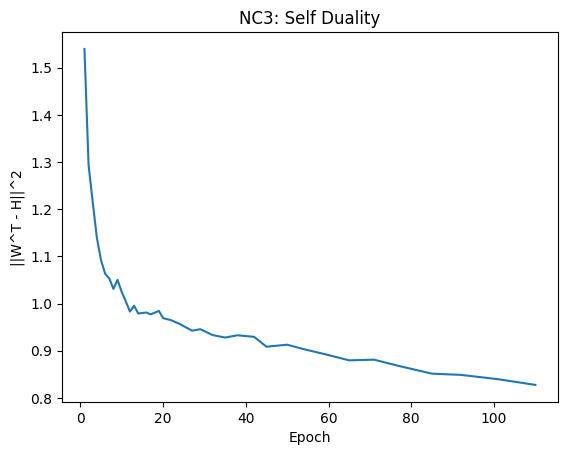

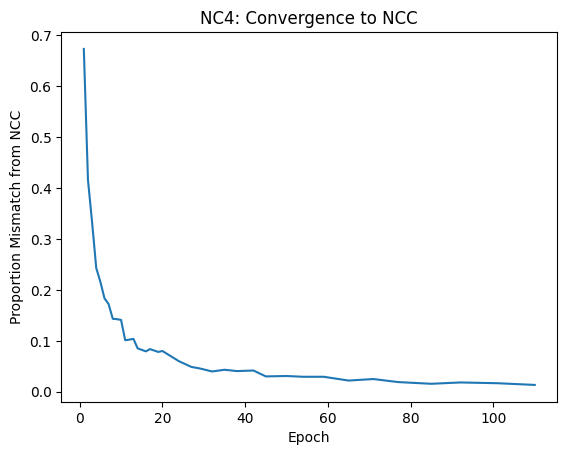

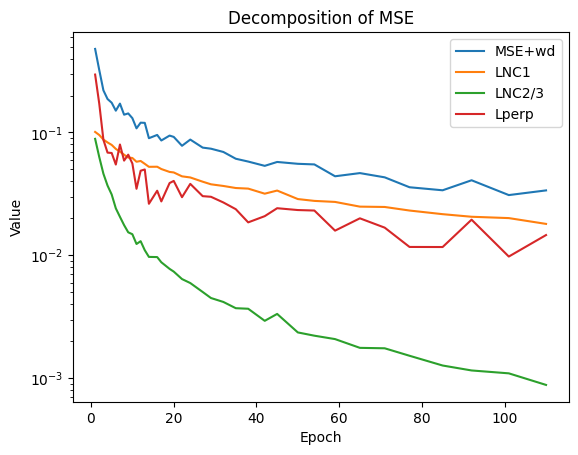

Train		Epoch: 111 [21/469 (4%)] 	Batch Loss: 0.005585 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:08,  6.58it/s]
Train		Epoch: 112 [21/469 (4%)] 	Batch Loss: 0.006477 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:07,  6.67it/s]
Train		Epoch: 113 [21/469 (4%)] 	Batch Loss: 0.006418 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:09,  6.45it/s]
Train		Epoch: 114 [21/469 (4%)] 	Batch Loss: 0.007999 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:08,  6.56it/s]
Train		Epoch: 115 [21/469 (4%)] 	Batch Loss: 0.007723 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.74it/s]
Train		Epoch: 116 [21/469 (4%)] 	Batch Loss: 0.006730 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.80it/s]
Train		Epoch: 117 [21/469 (4%)] 	Batch Loss: 0.007264 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:06,  6.70it/s]
Train		Epoch: 118 [21/469 (4%)] 	Batch Loss: 0.007643 	Batch Accuracy: 0.960938:   4%|▍   

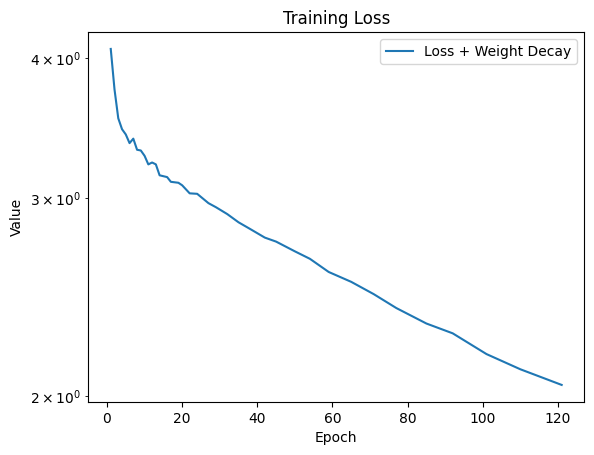

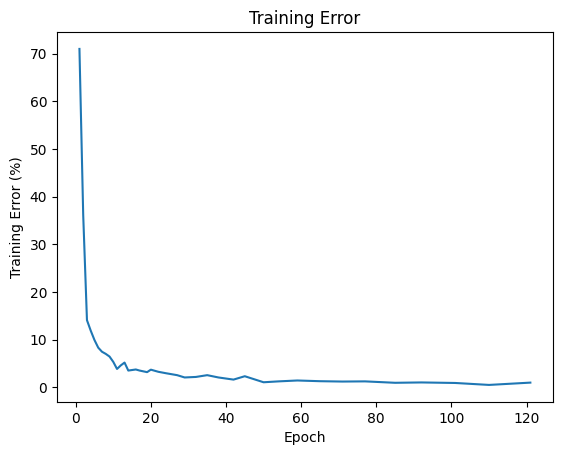

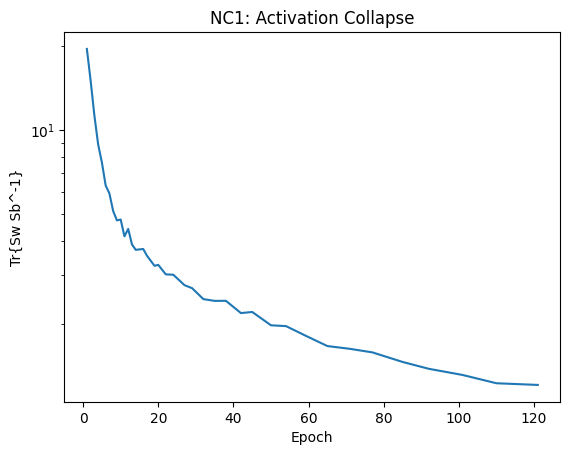

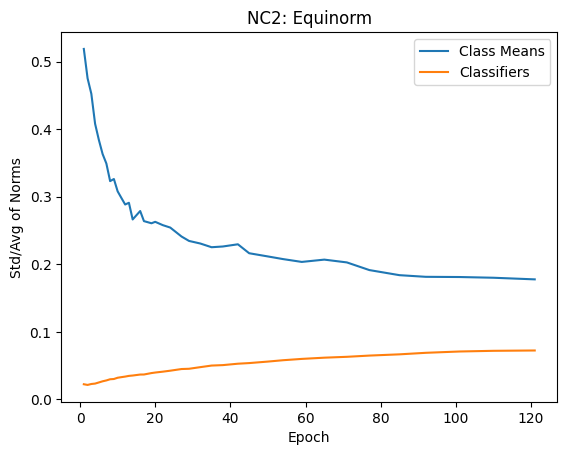

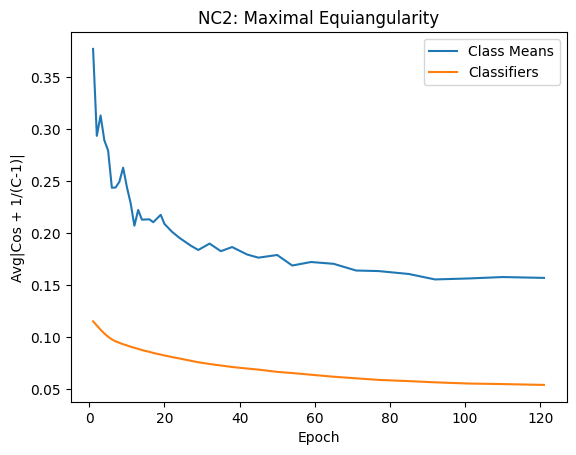

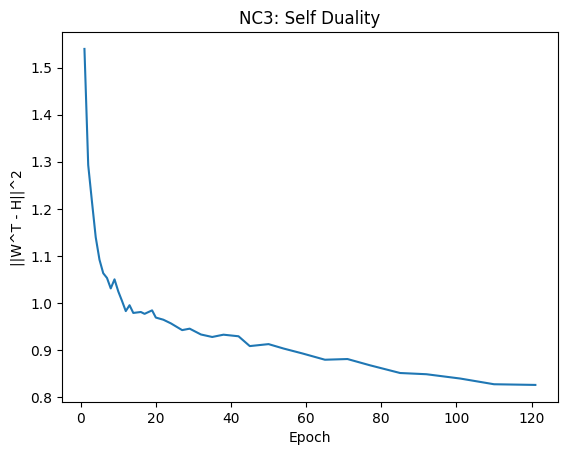

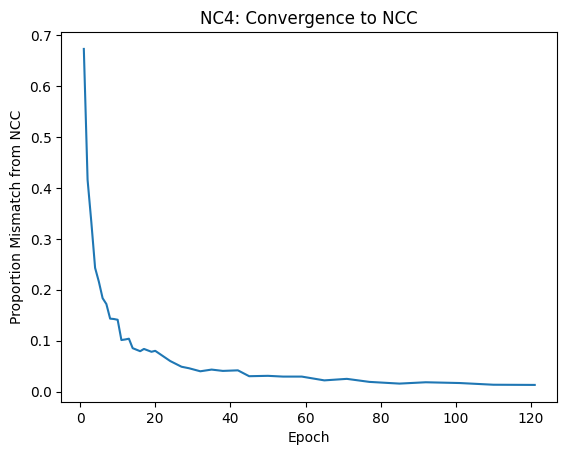

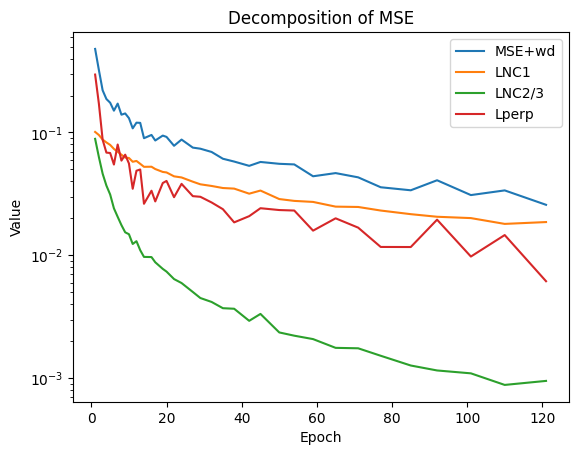

Train		Epoch: 122 [21/469 (4%)] 	Batch Loss: 0.005514 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:07,  6.67it/s]
Train		Epoch: 123 [21/469 (4%)] 	Batch Loss: 0.005845 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.73it/s]
Train		Epoch: 124 [21/469 (4%)] 	Batch Loss: 0.007140 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.85it/s]
Train		Epoch: 125 [21/469 (4%)] 	Batch Loss: 0.004686 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.68it/s]
Train		Epoch: 126 [21/469 (4%)] 	Batch Loss: 0.004939 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:10,  6.36it/s]
Train		Epoch: 127 [21/469 (4%)] 	Batch Loss: 0.006293 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.87it/s]
Train		Epoch: 128 [21/469 (4%)] 	Batch Loss: 0.004482 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.79it/s]
Train		Epoch: 129 [21/469 (4%)] 	Batch Loss: 0.005188 	Batch Accuracy: 0.992188:   4%|▍   

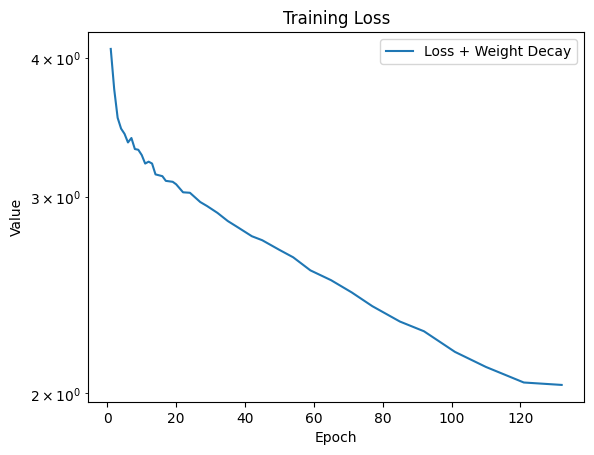

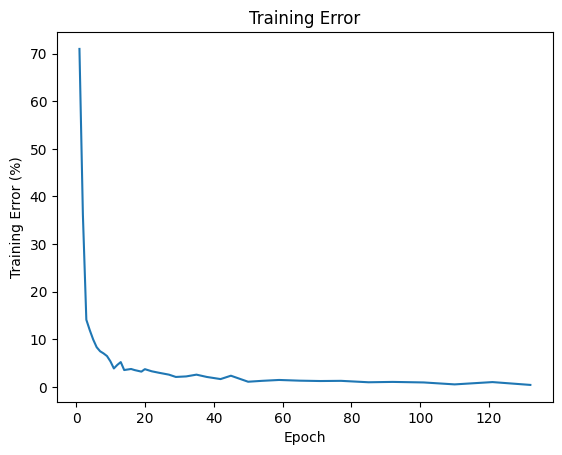

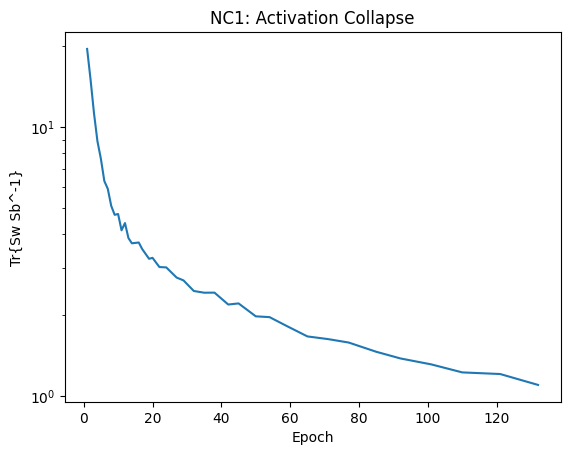

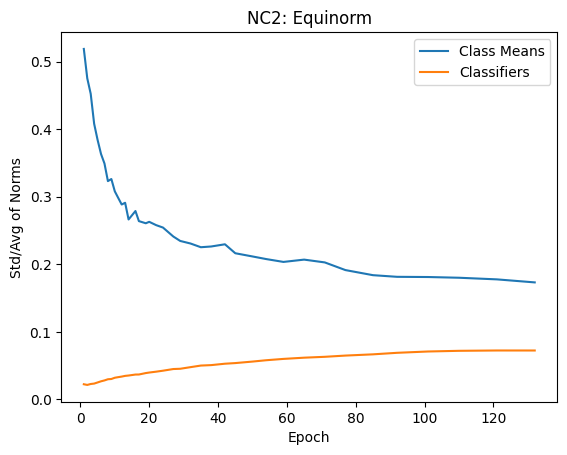

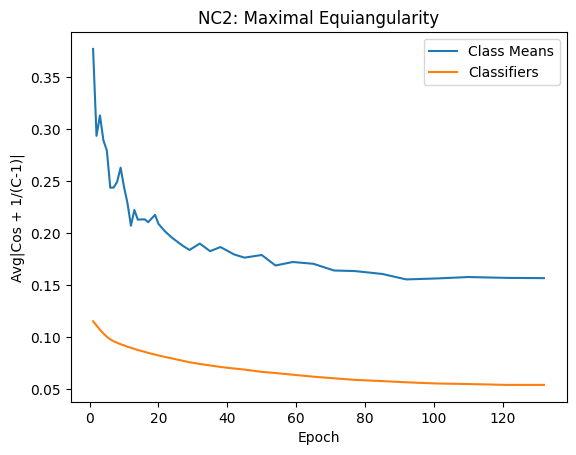

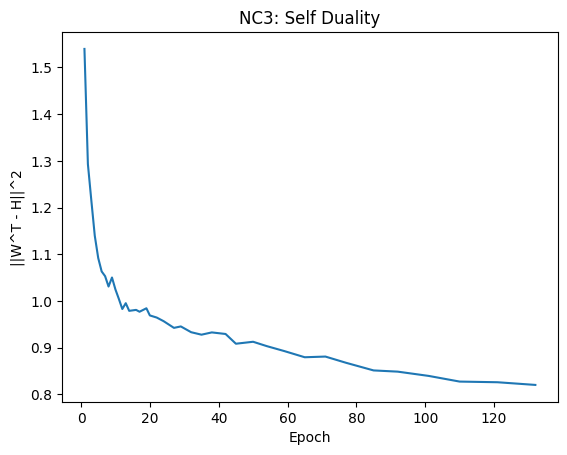

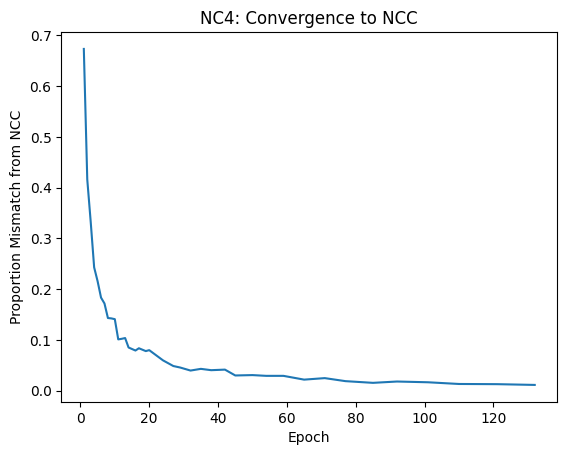

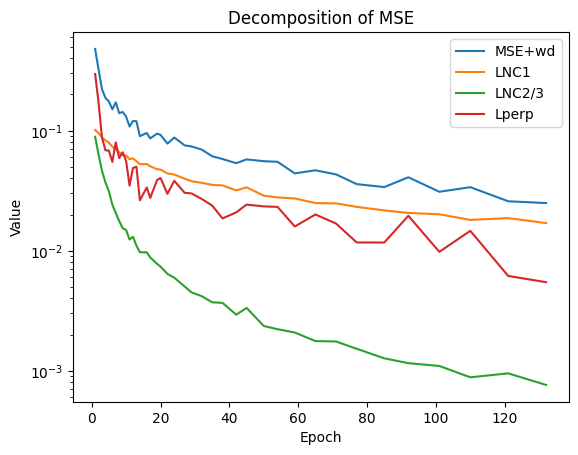

Train		Epoch: 133 [21/469 (4%)] 	Batch Loss: 0.005481 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:09,  6.40it/s]
Train		Epoch: 134 [21/469 (4%)] 	Batch Loss: 0.004882 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:04,  6.90it/s]
Train		Epoch: 135 [21/469 (4%)] 	Batch Loss: 0.005964 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.76it/s]
Train		Epoch: 136 [21/469 (4%)] 	Batch Loss: 0.006847 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.67it/s]
Train		Epoch: 137 [21/469 (4%)] 	Batch Loss: 0.006290 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:10,  6.36it/s]
Train		Epoch: 138 [21/469 (4%)] 	Batch Loss: 0.005274 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.78it/s]
Train		Epoch: 139 [21/469 (4%)] 	Batch Loss: 0.006023 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.81it/s]
Train		Epoch: 140 [21/469 (4%)] 	Batch Loss: 0.004075 	Batch Accuracy: 1.000000:   4%|▍   

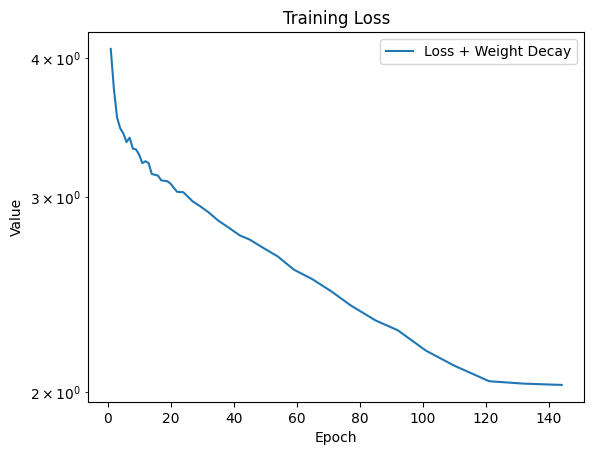

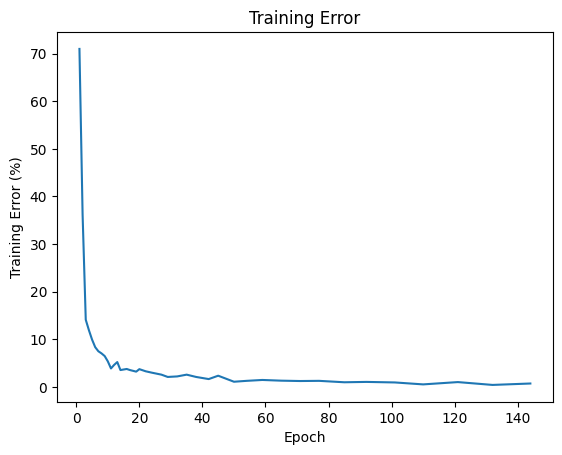

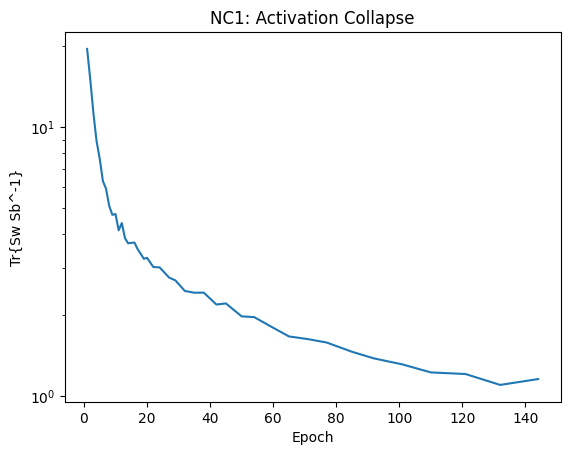

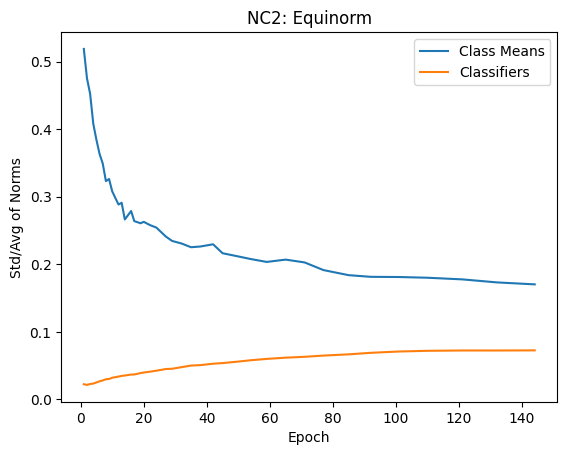

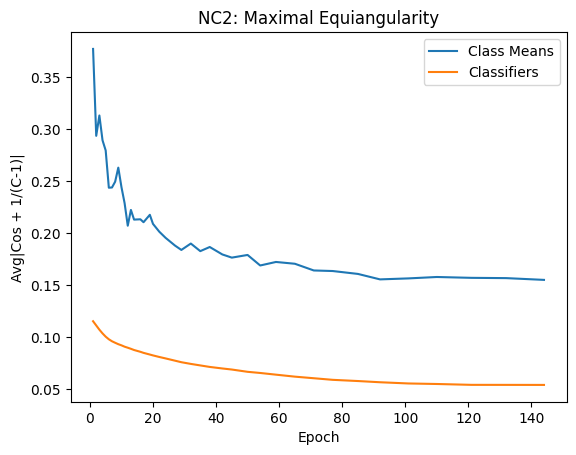

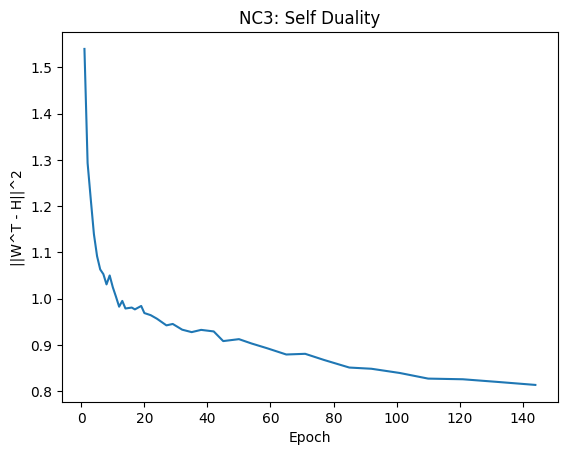

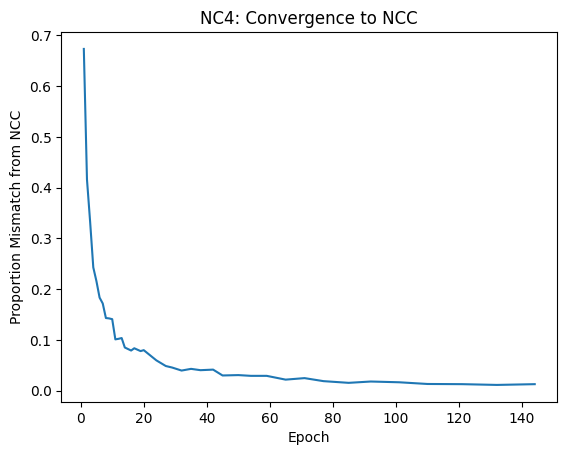

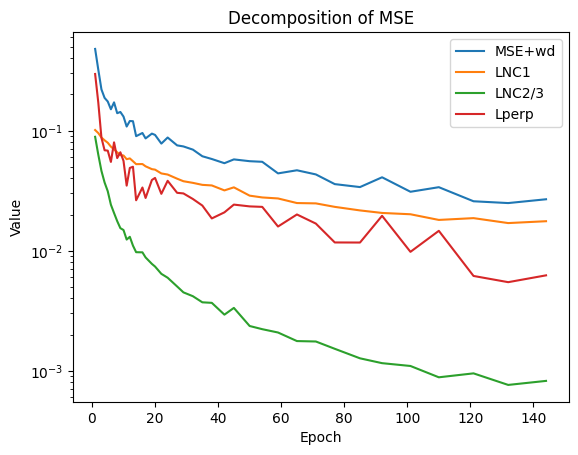

Train		Epoch: 145 [21/469 (4%)] 	Batch Loss: 0.006756 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:07,  6.68it/s]
Train		Epoch: 146 [21/469 (4%)] 	Batch Loss: 0.005081 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.80it/s]
Train		Epoch: 147 [21/469 (4%)] 	Batch Loss: 0.006153 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Train		Epoch: 148 [21/469 (4%)] 	Batch Loss: 0.005091 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:08,  6.54it/s]
Train		Epoch: 149 [21/469 (4%)] 	Batch Loss: 0.004628 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:08,  6.51it/s]
Train		Epoch: 150 [21/469 (4%)] 	Batch Loss: 0.005723 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:05,  6.80it/s]
Train		Epoch: 151 [21/469 (4%)] 	Batch Loss: 0.003866 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.76it/s]
Train		Epoch: 152 [21/469 (4%)] 	Batch Loss: 0.005345 	Batch Accuracy: 0.992188:   4%|▍   

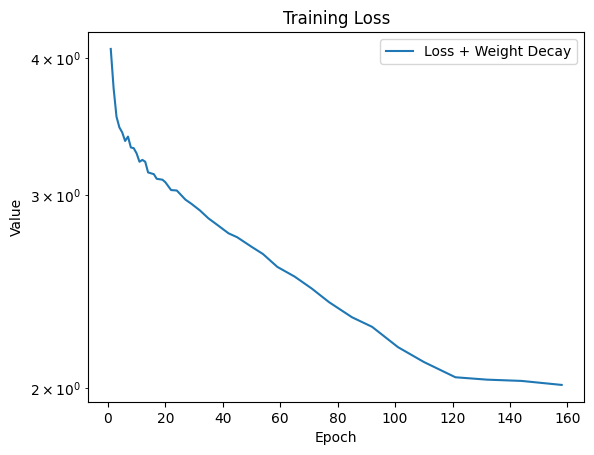

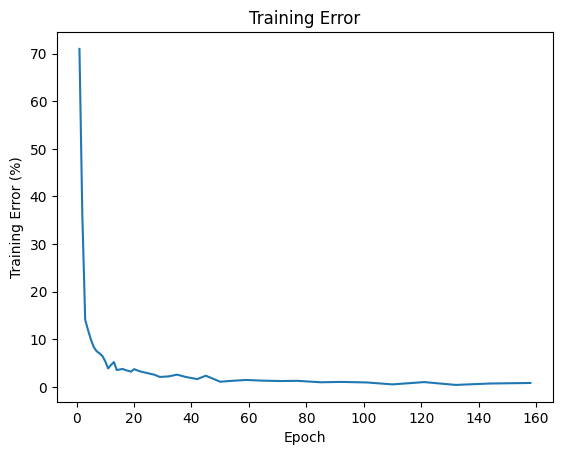

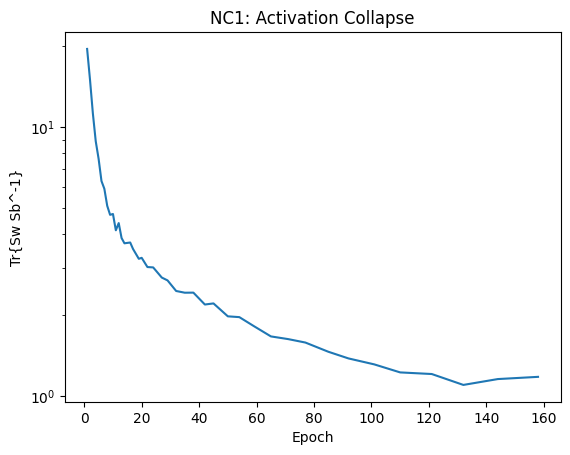

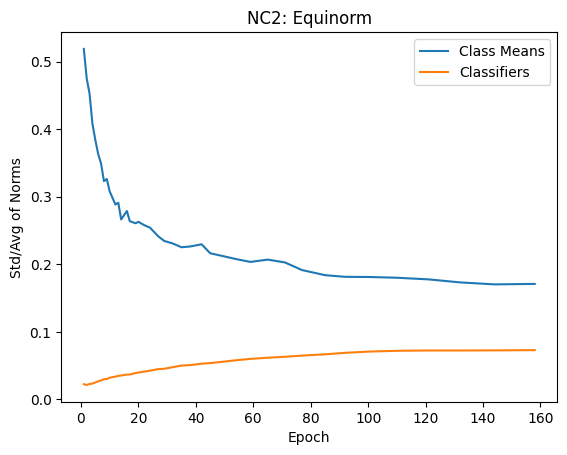

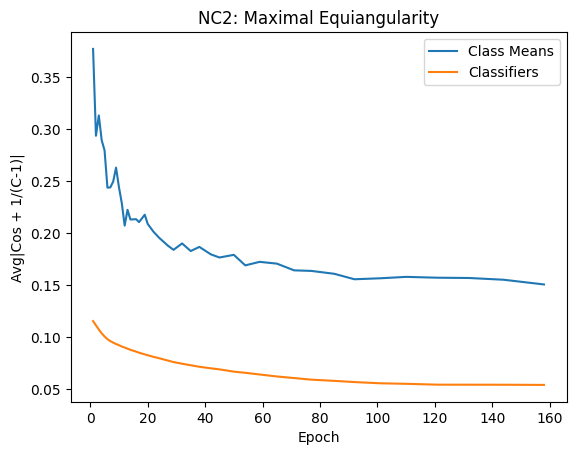

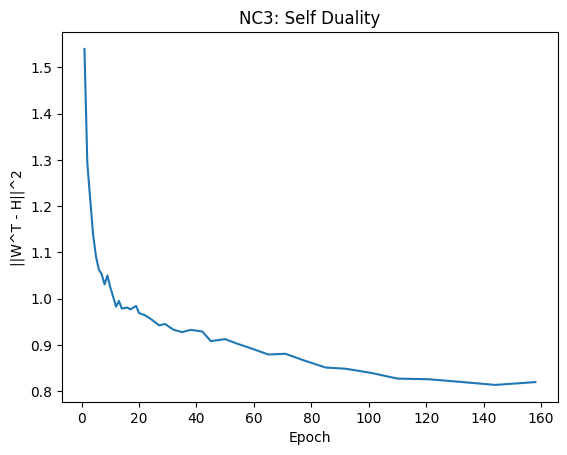

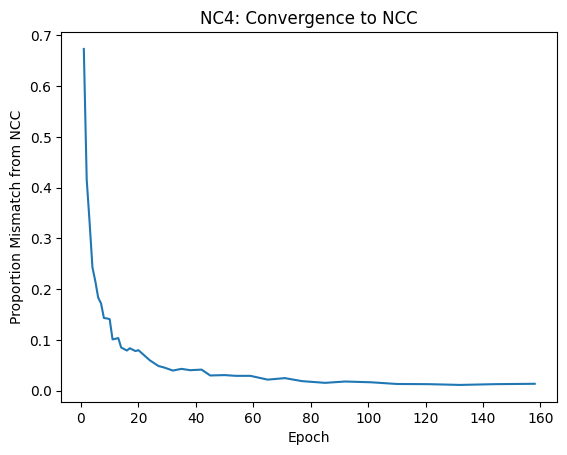

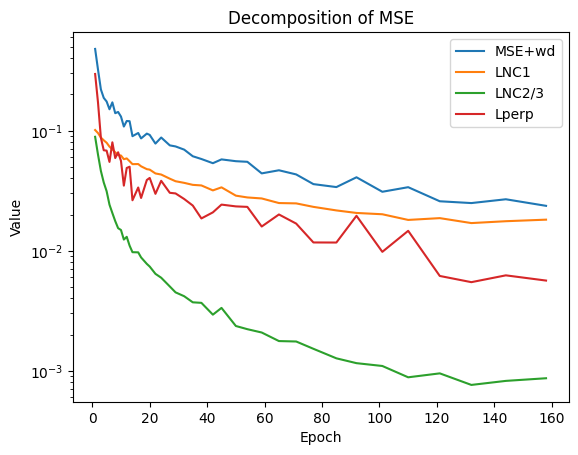

Train		Epoch: 159 [21/469 (4%)] 	Batch Loss: 0.006564 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:07,  6.66it/s]
Train		Epoch: 160 [21/469 (4%)] 	Batch Loss: 0.004683 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:08,  6.51it/s]
Train		Epoch: 161 [21/469 (4%)] 	Batch Loss: 0.006270 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:08,  6.53it/s]
Train		Epoch: 162 [21/469 (4%)] 	Batch Loss: 0.004292 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.78it/s]
Train		Epoch: 163 [21/469 (4%)] 	Batch Loss: 0.006151 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.76it/s]
Train		Epoch: 164 [21/469 (4%)] 	Batch Loss: 0.007343 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:07,  6.59it/s]
Train		Epoch: 165 [21/469 (4%)] 	Batch Loss: 0.005530 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:11,  6.29it/s]
Train		Epoch: 166 [21/469 (4%)] 	Batch Loss: 0.005864 	Batch Accuracy: 0.992188:   4%|▍   

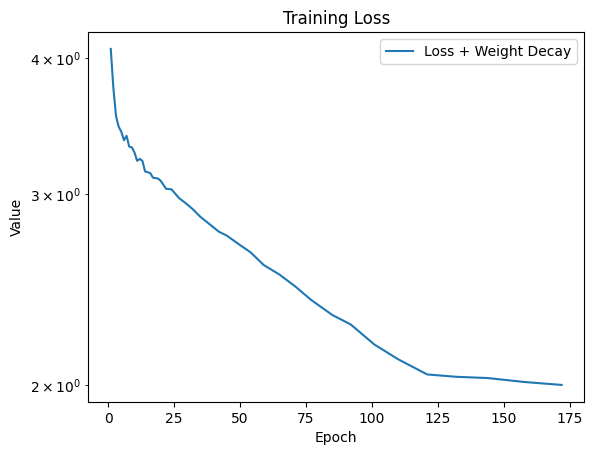

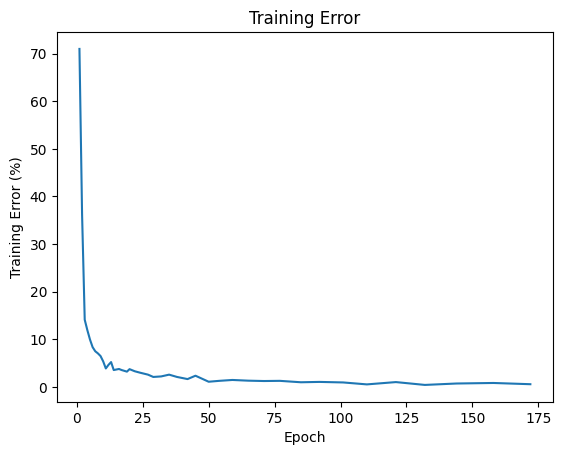

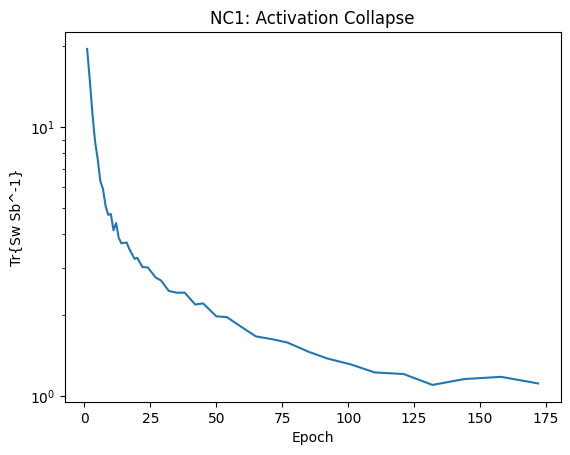

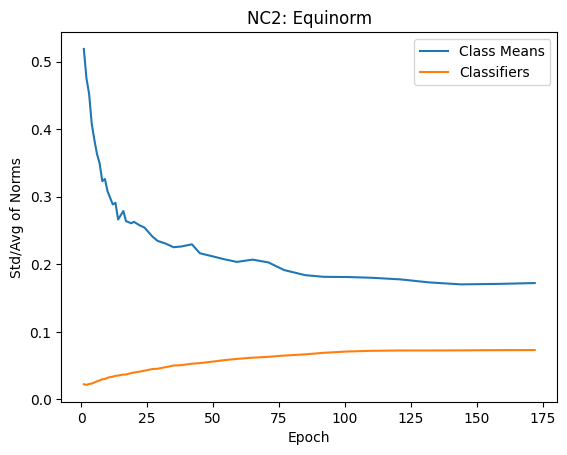

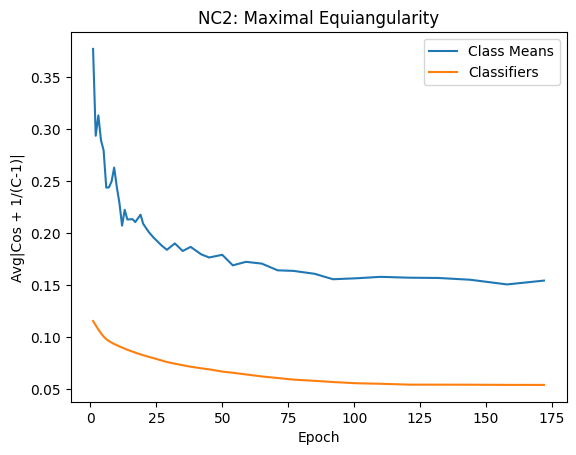

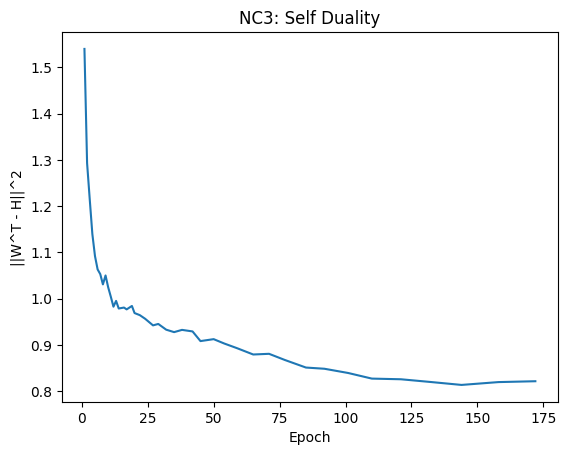

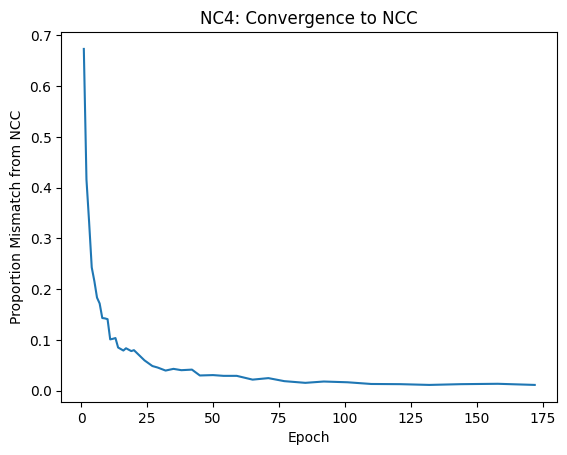

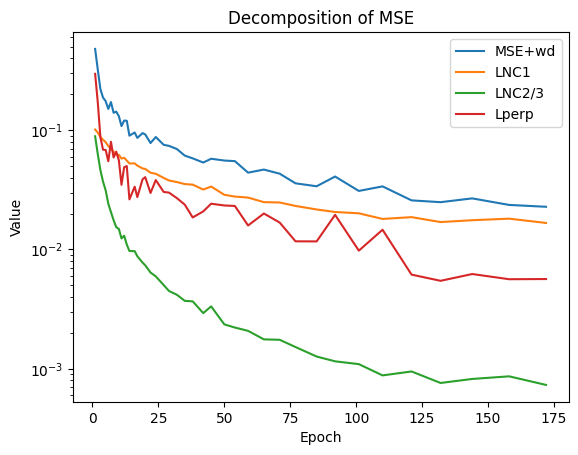

Train		Epoch: 173 [21/469 (4%)] 	Batch Loss: 0.005372 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:09,  6.42it/s]
Train		Epoch: 174 [21/469 (4%)] 	Batch Loss: 0.003815 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:07,  6.61it/s]
Train		Epoch: 175 [21/469 (4%)] 	Batch Loss: 0.004216 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:10,  6.38it/s]
Train		Epoch: 176 [21/469 (4%)] 	Batch Loss: 0.005675 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:10,  6.32it/s]
Train		Epoch: 177 [21/469 (4%)] 	Batch Loss: 0.006390 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.70it/s]
Train		Epoch: 178 [21/469 (4%)] 	Batch Loss: 0.004989 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:07,  6.60it/s]
Train		Epoch: 179 [21/469 (4%)] 	Batch Loss: 0.004389 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.56it/s]
Train		Epoch: 180 [21/469 (4%)] 	Batch Loss: 0.004300 	Batch Accuracy: 1.000000:   4%|▍   

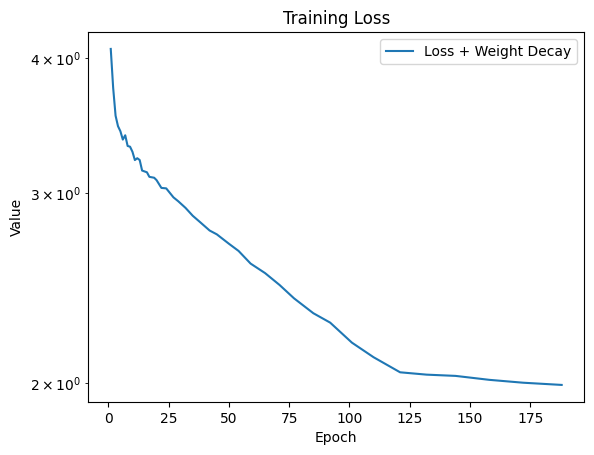

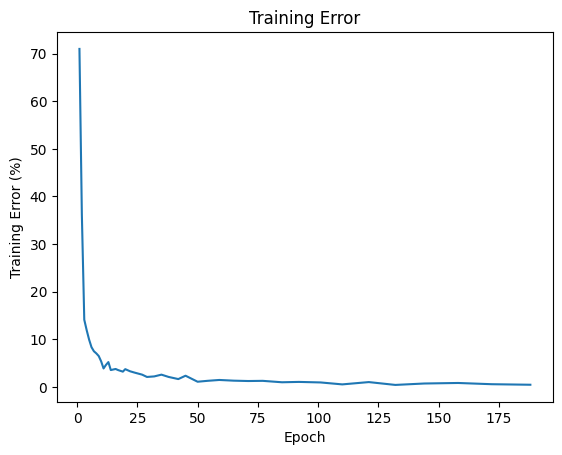

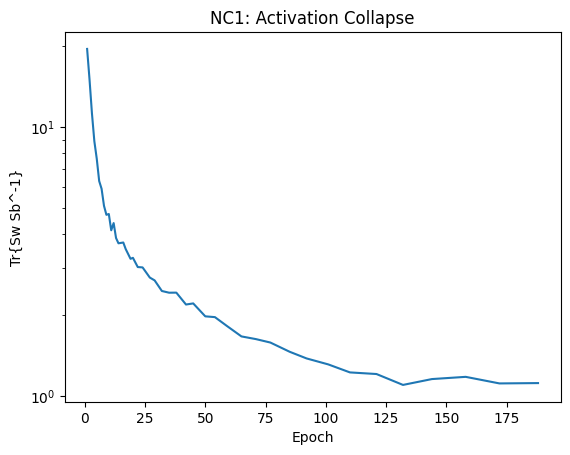

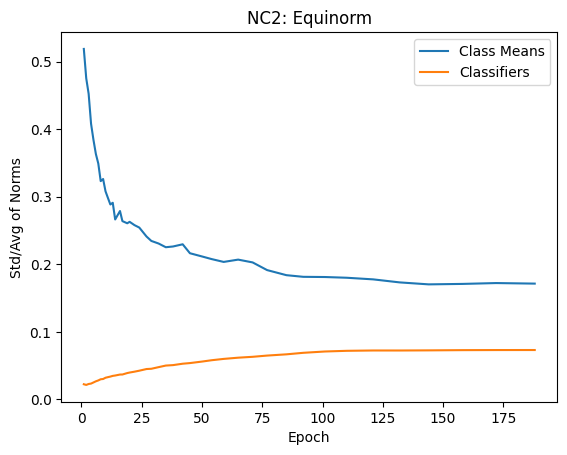

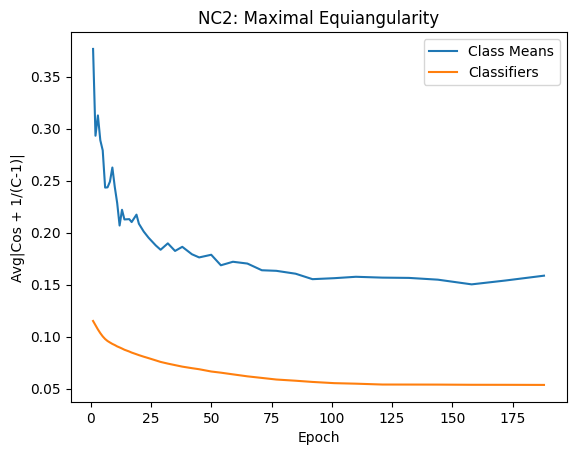

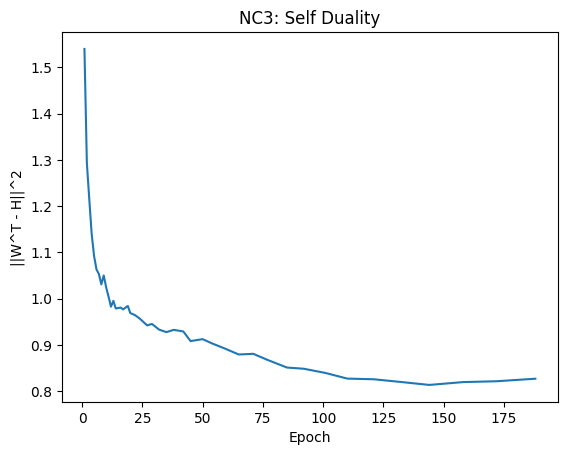

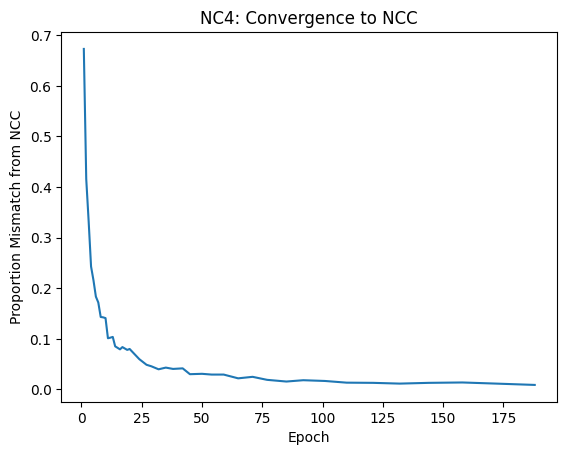

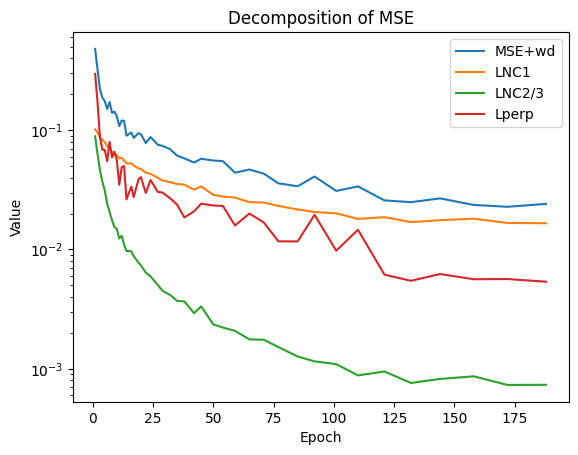

Train		Epoch: 189 [21/469 (4%)] 	Batch Loss: 0.005068 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.54it/s]
Train		Epoch: 190 [21/469 (4%)] 	Batch Loss: 0.005534 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.55it/s]
Train		Epoch: 191 [21/469 (4%)] 	Batch Loss: 0.007411 	Batch Accuracy: 0.968750:   4%|▍         | 21/469 [00:03<01:10,  6.35it/s]
Train		Epoch: 192 [21/469 (4%)] 	Batch Loss: 0.005587 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:05,  6.87it/s]
Train		Epoch: 193 [21/469 (4%)] 	Batch Loss: 0.005201 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.85it/s]
Train		Epoch: 194 [21/469 (4%)] 	Batch Loss: 0.004777 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.86it/s]
Train		Epoch: 195 [21/469 (4%)] 	Batch Loss: 0.004263 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.72it/s]
Train		Epoch: 196 [21/469 (4%)] 	Batch Loss: 0.006277 	Batch Accuracy: 0.984375:   4%|▍   

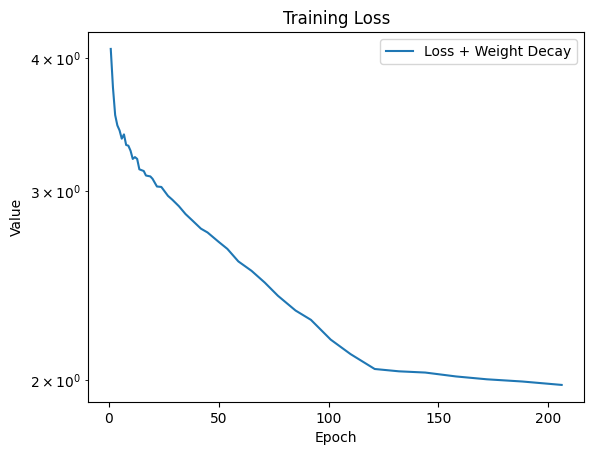

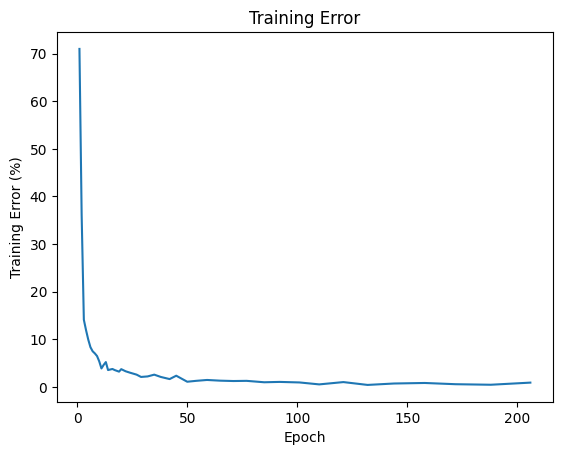

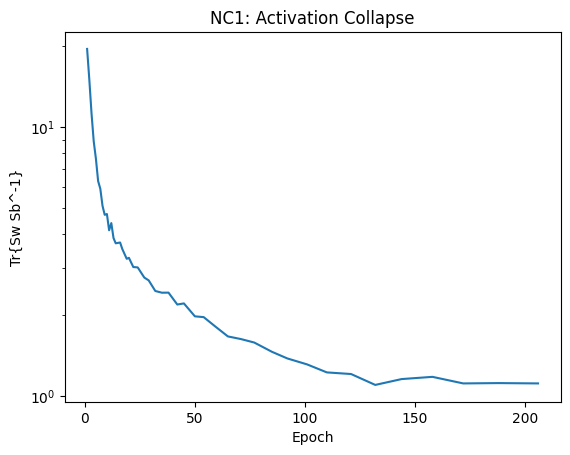

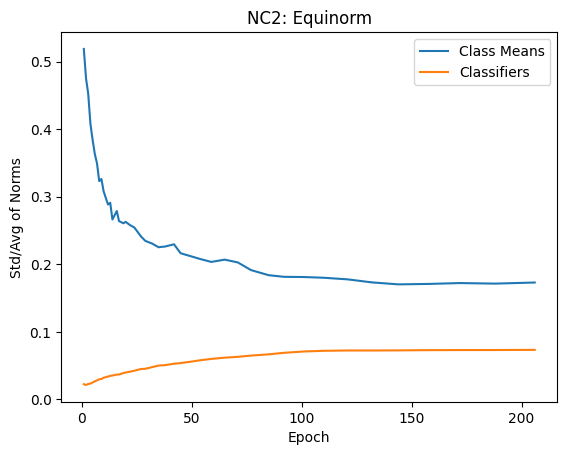

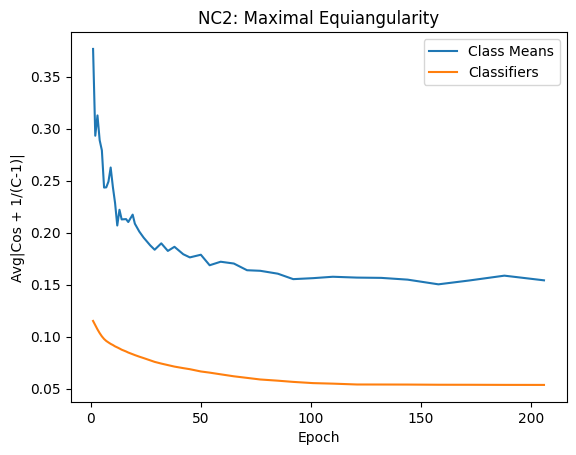

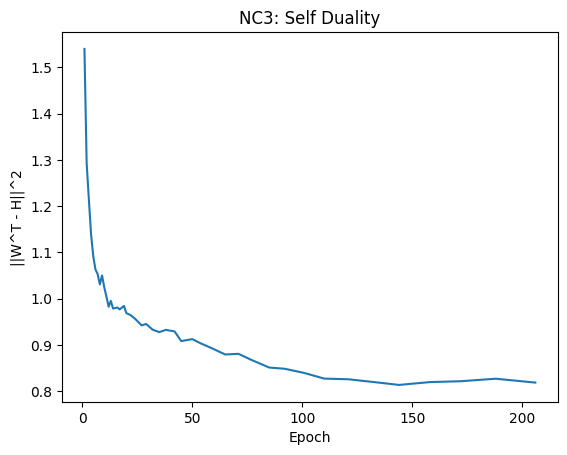

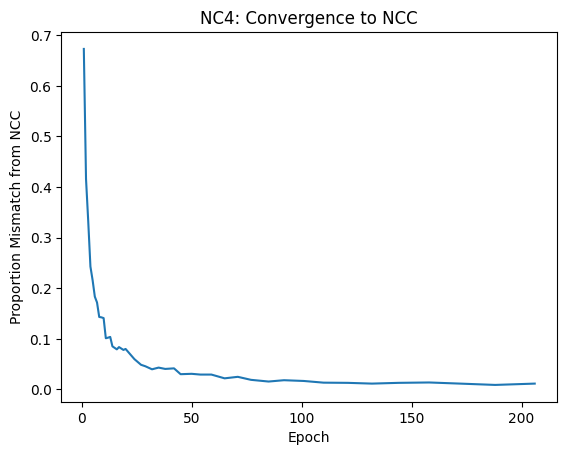

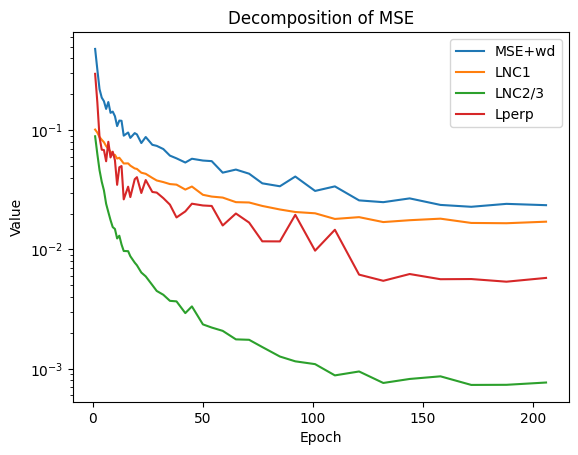

Train		Epoch: 207 [21/469 (4%)] 	Batch Loss: 0.005709 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:10,  6.34it/s]
Train		Epoch: 208 [21/469 (4%)] 	Batch Loss: 0.005459 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.68it/s]
Train		Epoch: 209 [21/469 (4%)] 	Batch Loss: 0.005111 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:08,  6.59it/s]
Train		Epoch: 210 [21/469 (4%)] 	Batch Loss: 0.003608 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:07,  6.68it/s]
Train		Epoch: 211 [21/469 (4%)] 	Batch Loss: 0.003964 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:10,  6.38it/s]
Train		Epoch: 212 [21/469 (4%)] 	Batch Loss: 0.005175 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:05,  6.83it/s]
Train		Epoch: 213 [21/469 (4%)] 	Batch Loss: 0.003677 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.79it/s]
Train		Epoch: 214 [21/469 (4%)] 	Batch Loss: 0.006960 	Batch Accuracy: 0.976562:   4%|▍   

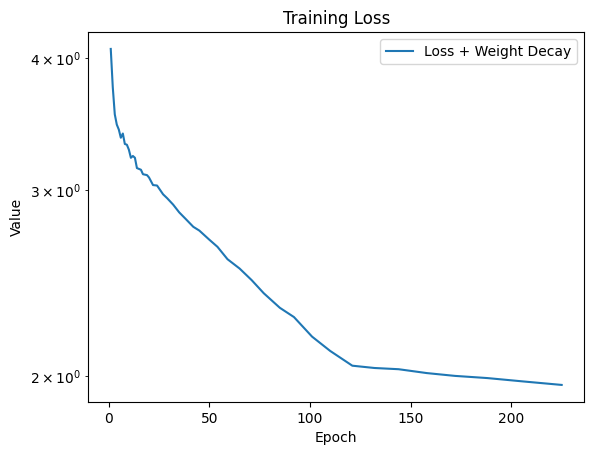

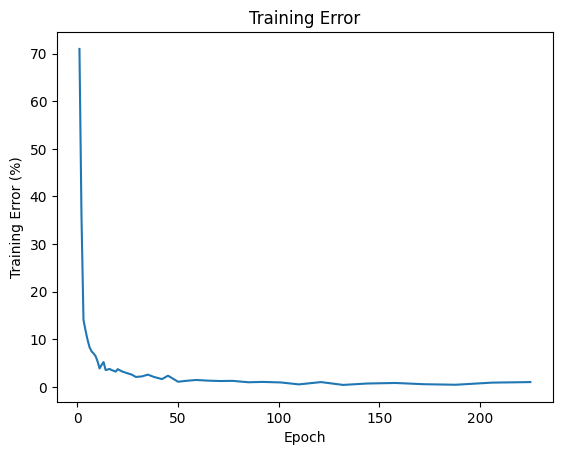

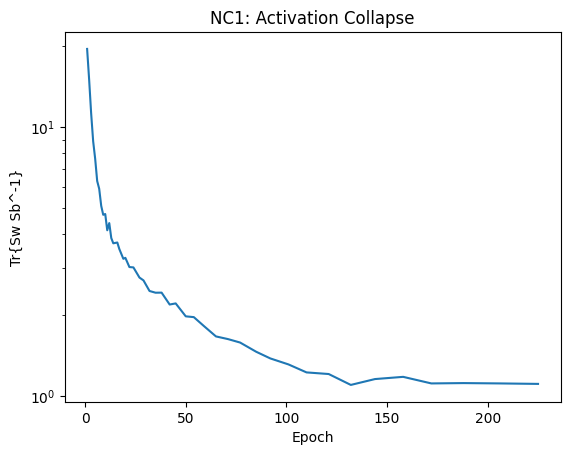

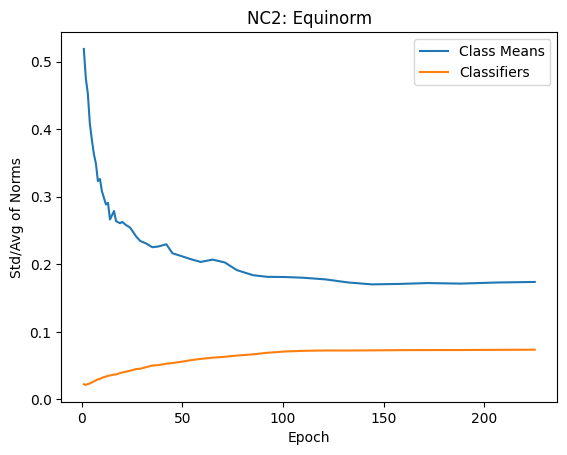

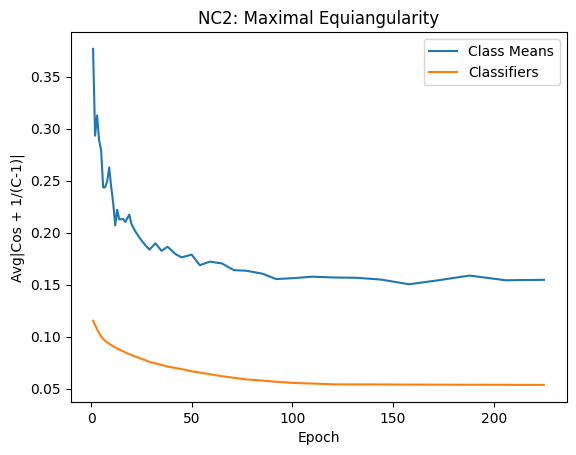

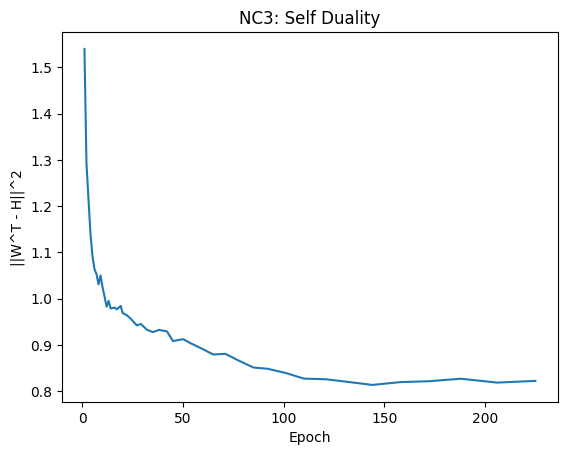

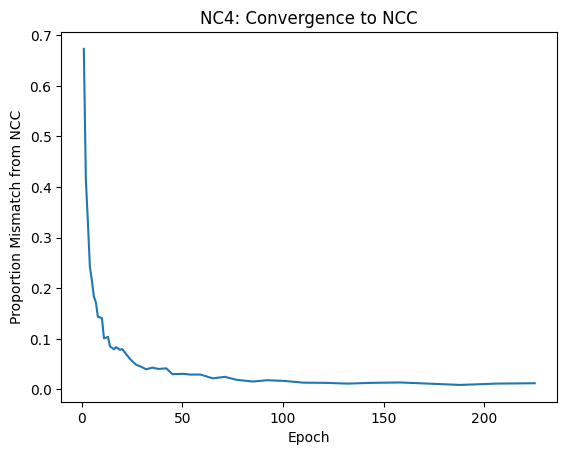

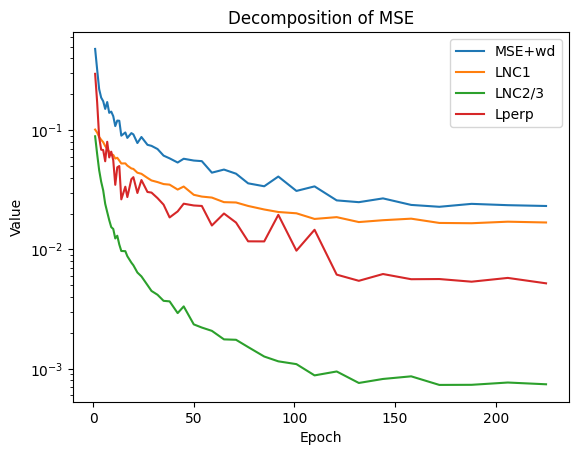

Train		Epoch: 226 [21/469 (4%)] 	Batch Loss: 0.005439 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:07,  6.59it/s]
Train		Epoch: 227 [21/469 (4%)] 	Batch Loss: 0.004522 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:09,  6.44it/s]
Train		Epoch: 228 [21/469 (4%)] 	Batch Loss: 0.005773 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.85it/s]
Train		Epoch: 229 [21/469 (4%)] 	Batch Loss: 0.006088 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:05,  6.86it/s]
Train		Epoch: 230 [21/469 (4%)] 	Batch Loss: 0.005171 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.77it/s]
Train		Epoch: 231 [21/469 (4%)] 	Batch Loss: 0.004278 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.69it/s]
Train		Epoch: 232 [21/469 (4%)] 	Batch Loss: 0.003988 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.73it/s]
Train		Epoch: 233 [21/469 (4%)] 	Batch Loss: 0.004779 	Batch Accuracy: 0.992188:   4%|▍   

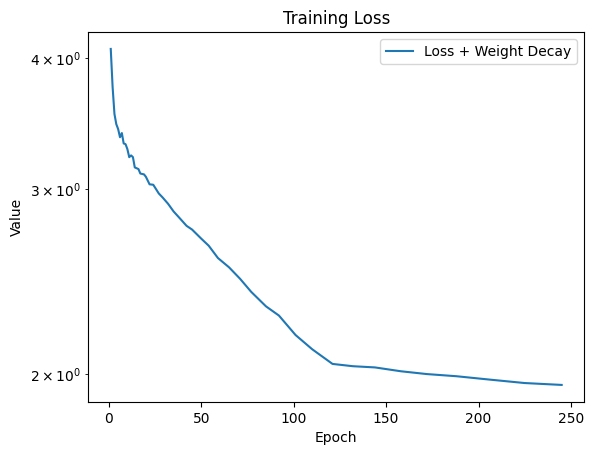

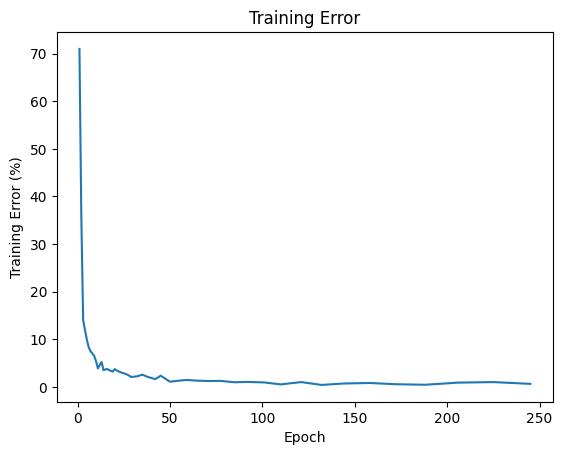

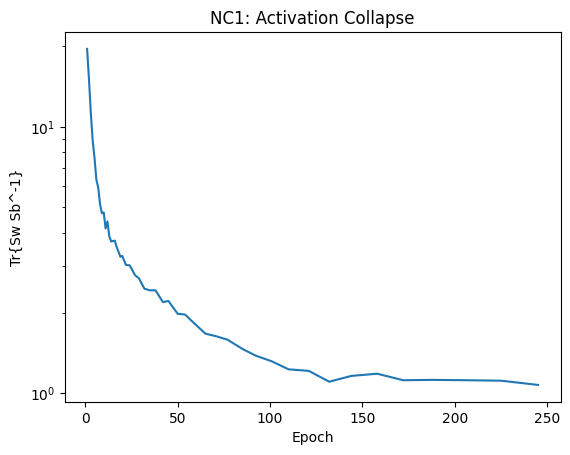

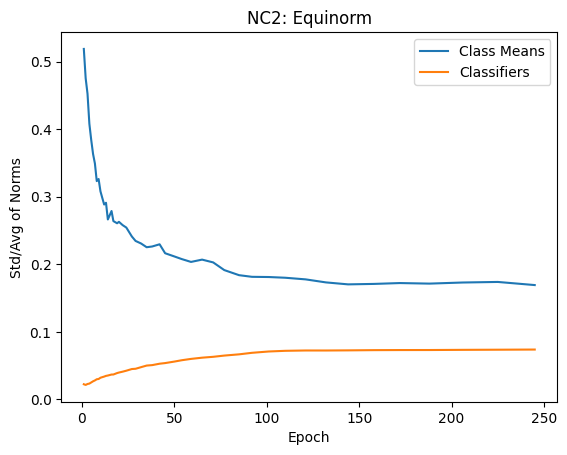

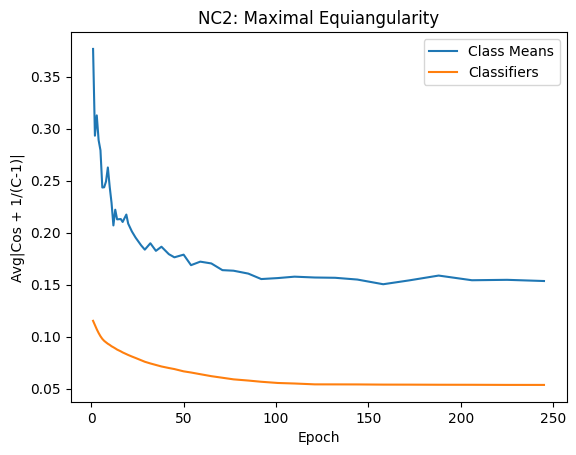

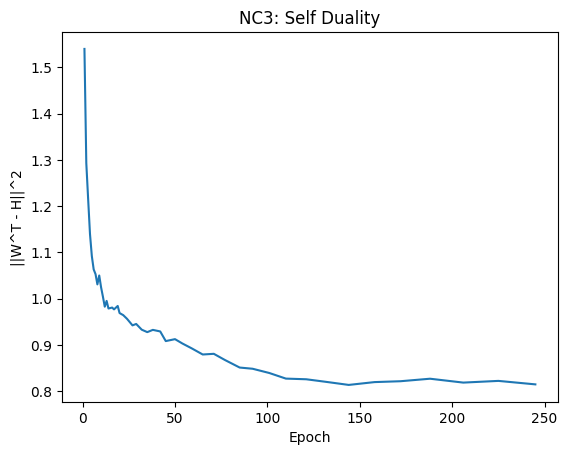

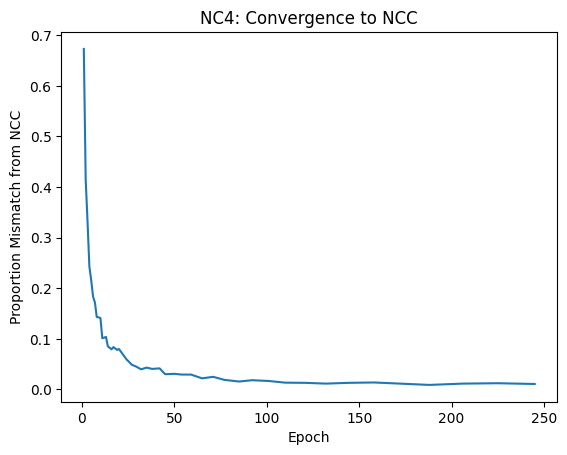

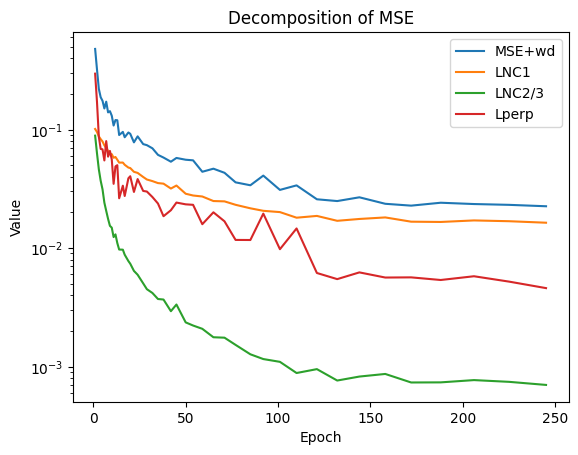

Train		Epoch: 246 [21/469 (4%)] 	Batch Loss: 0.004432 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:07,  6.63it/s]
Train		Epoch: 247 [21/469 (4%)] 	Batch Loss: 0.003825 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:09,  6.46it/s]
Train		Epoch: 248 [21/469 (4%)] 	Batch Loss: 0.005267 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.74it/s]
Train		Epoch: 249 [21/469 (4%)] 	Batch Loss: 0.005944 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:04,  6.96it/s]
Train		Epoch: 250 [21/469 (4%)] 	Batch Loss: 0.004289 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.83it/s]
Train		Epoch: 251 [21/469 (4%)] 	Batch Loss: 0.003568 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:08,  6.52it/s]
Train		Epoch: 252 [21/469 (4%)] 	Batch Loss: 0.004522 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.69it/s]
Train		Epoch: 253 [21/469 (4%)] 	Batch Loss: 0.004133 	Batch Accuracy: 0.992188:   4%|▍   

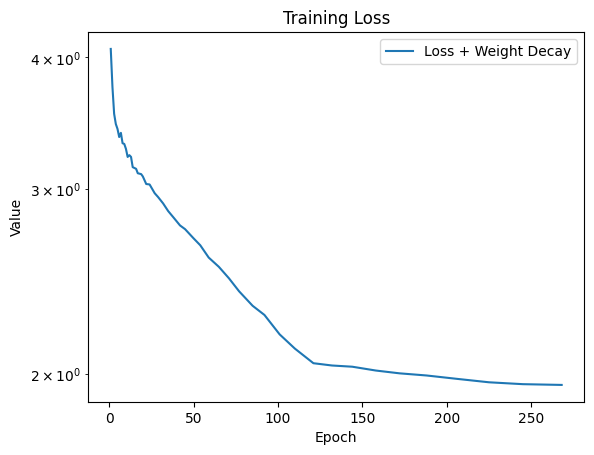

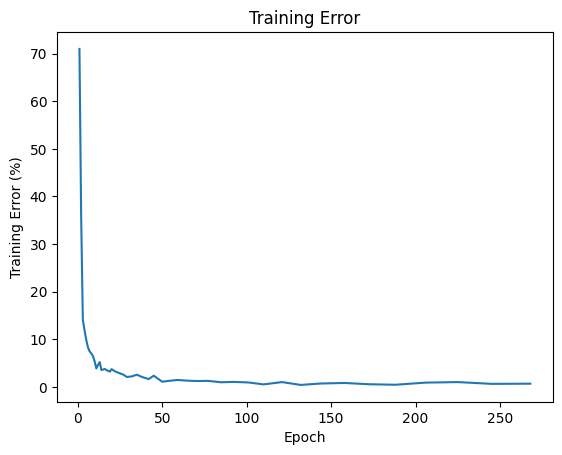

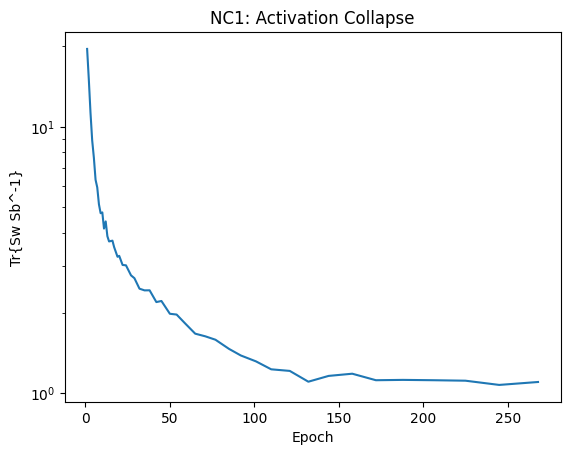

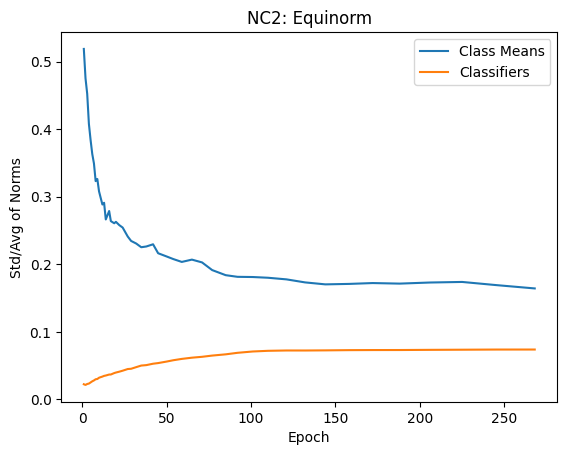

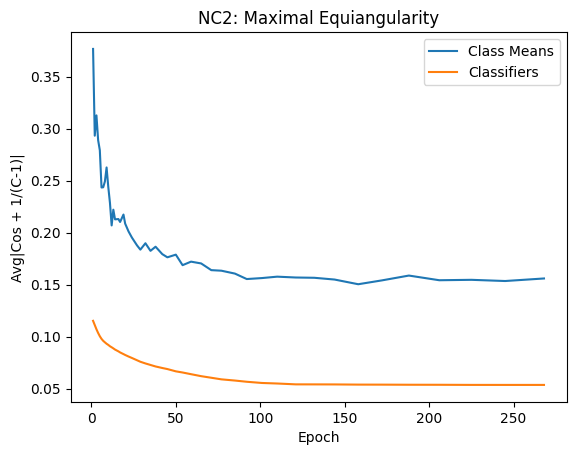

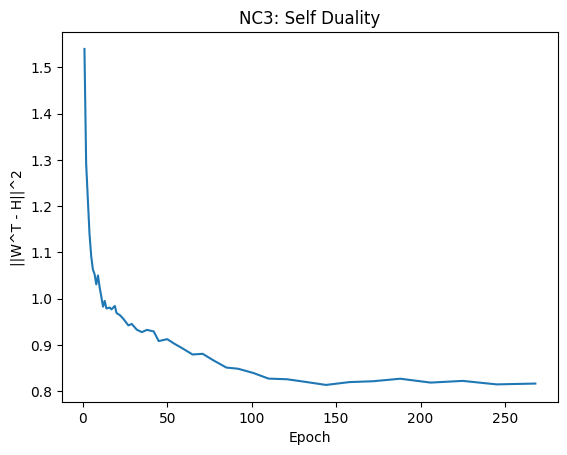

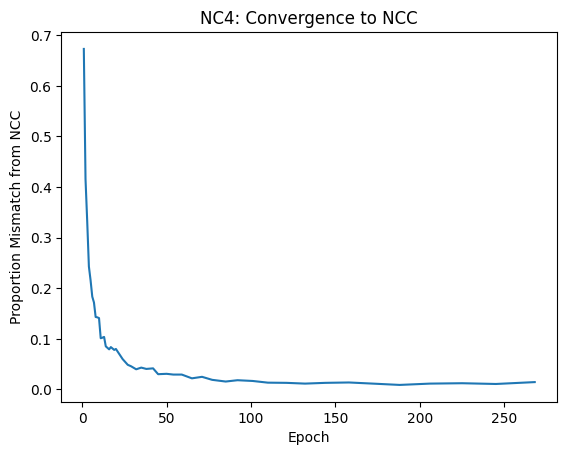

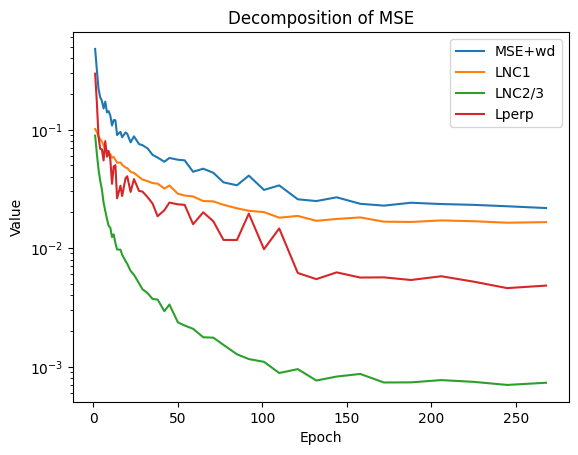

Train		Epoch: 269 [21/469 (4%)] 	Batch Loss: 0.005543 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.72it/s]
Train		Epoch: 270 [21/469 (4%)] 	Batch Loss: 0.005045 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.80it/s]
Train		Epoch: 271 [21/469 (4%)] 	Batch Loss: 0.004291 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:08,  6.56it/s]
Train		Epoch: 272 [21/469 (4%)] 	Batch Loss: 0.004540 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:10,  6.36it/s]
Train		Epoch: 273 [21/469 (4%)] 	Batch Loss: 0.005672 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.84it/s]
Train		Epoch: 274 [21/469 (4%)] 	Batch Loss: 0.003562 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.81it/s]
Train		Epoch: 275 [21/469 (4%)] 	Batch Loss: 0.006484 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:05,  6.81it/s]
Train		Epoch: 276 [21/469 (4%)] 	Batch Loss: 0.005258 	Batch Accuracy: 1.000000:   4%|▍   

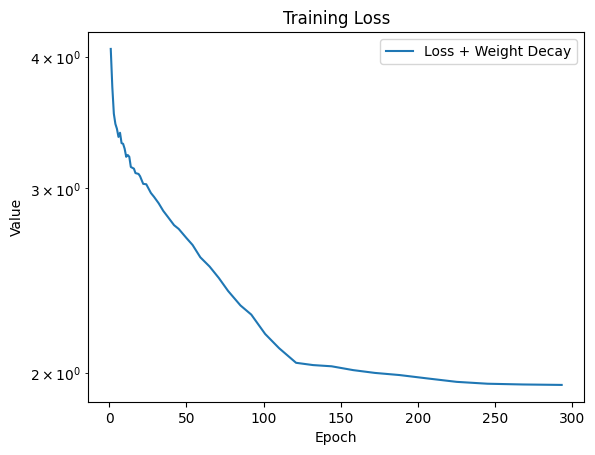

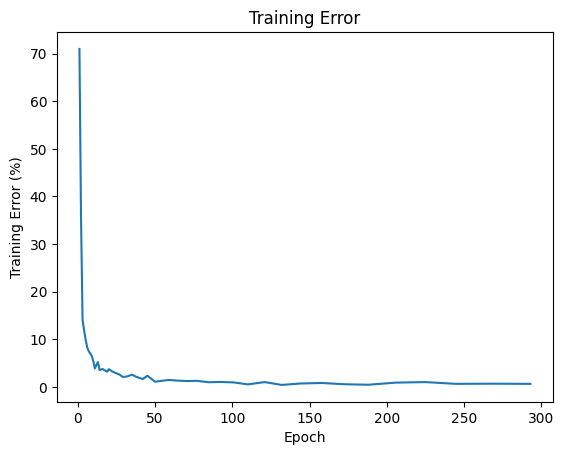

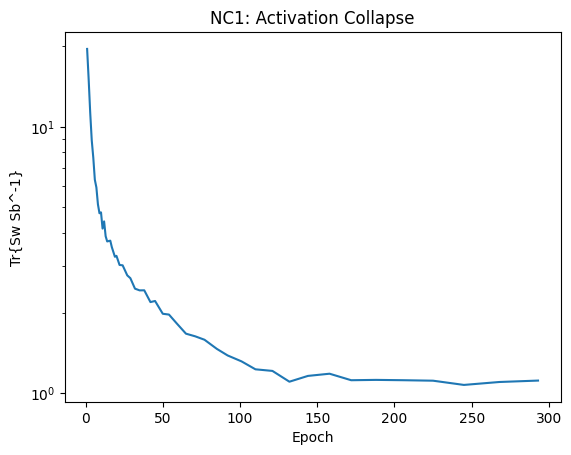

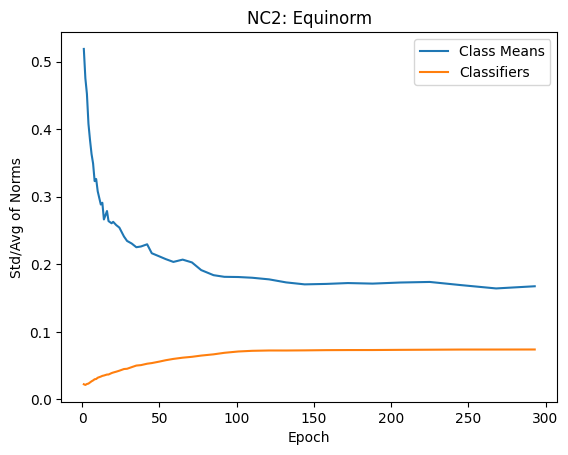

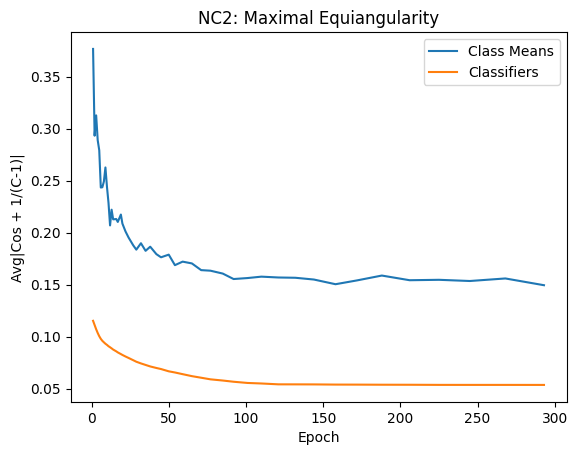

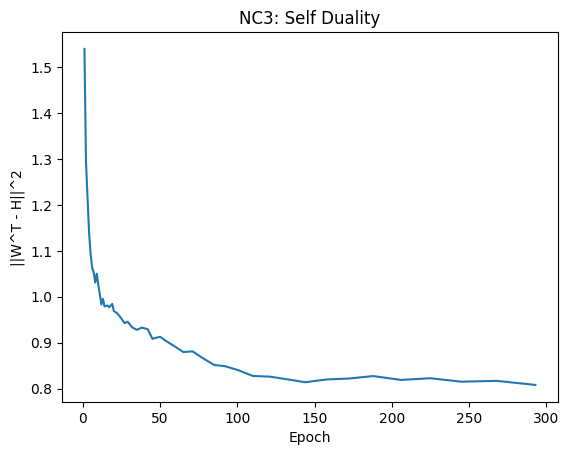

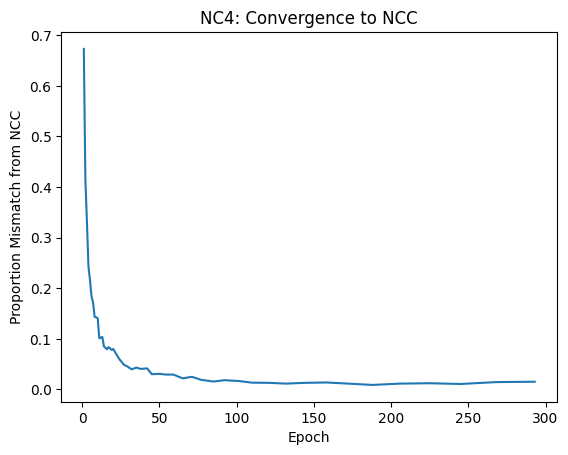

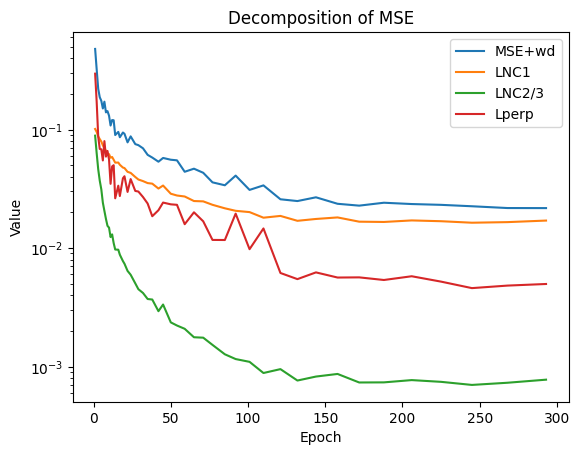

Train		Epoch: 294 [21/469 (4%)] 	Batch Loss: 0.003650 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.69it/s]
Train		Epoch: 295 [21/469 (4%)] 	Batch Loss: 0.005450 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:04,  6.90it/s]
Train		Epoch: 296 [21/469 (4%)] 	Batch Loss: 0.005893 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:10,  6.40it/s]
Train		Epoch: 297 [21/469 (4%)] 	Batch Loss: 0.005577 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.72it/s]
Train		Epoch: 298 [21/469 (4%)] 	Batch Loss: 0.003890 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:05,  6.85it/s]
Train		Epoch: 299 [21/469 (4%)] 	Batch Loss: 0.004231 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:04,  6.90it/s]
Train		Epoch: 300 [21/469 (4%)] 	Batch Loss: 0.004446 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:06,  6.76it/s]
Train		Epoch: 301 [21/469 (4%)] 	Batch Loss: 0.004483 	Batch Accuracy: 0.992188:   4%|▍   

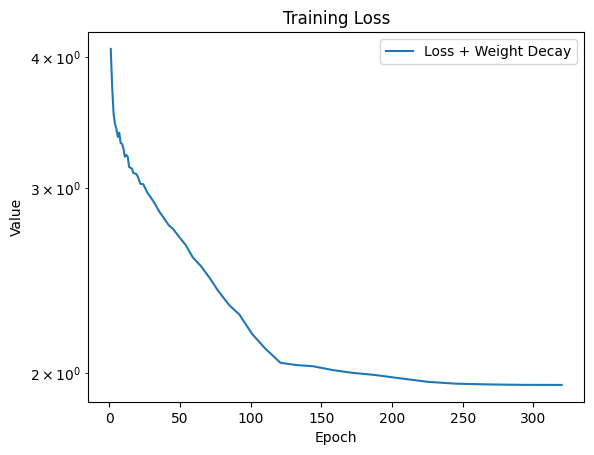

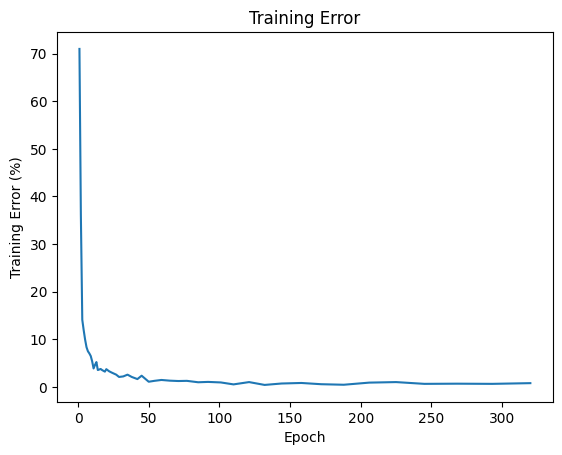

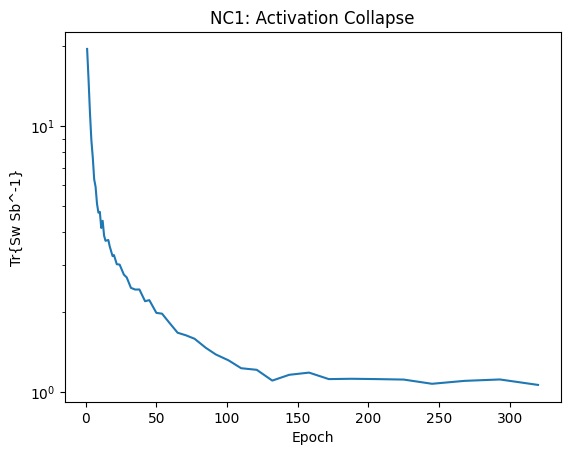

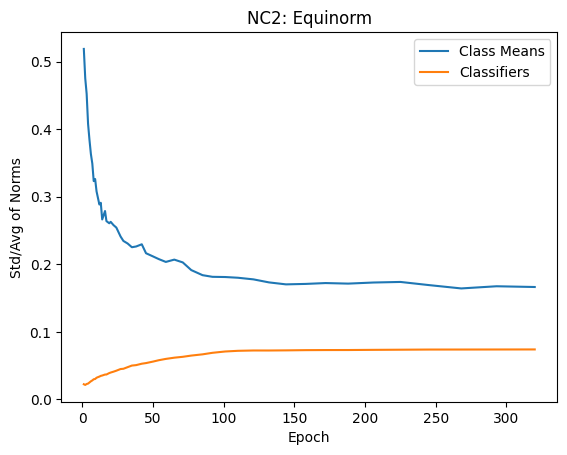

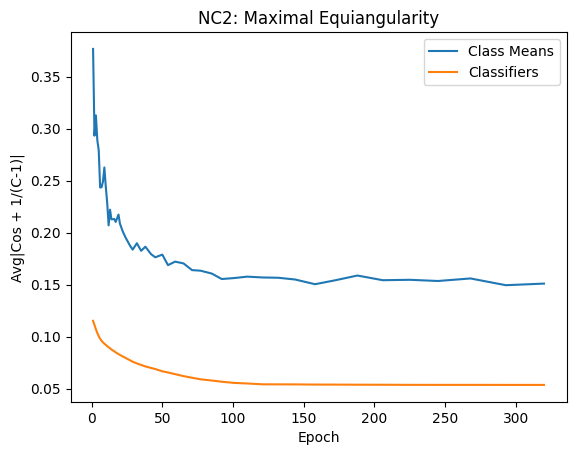

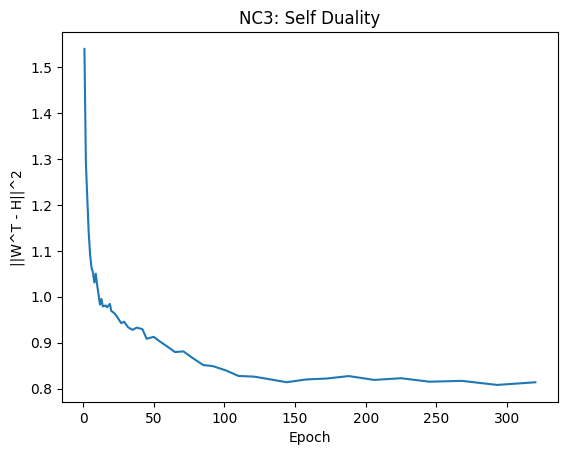

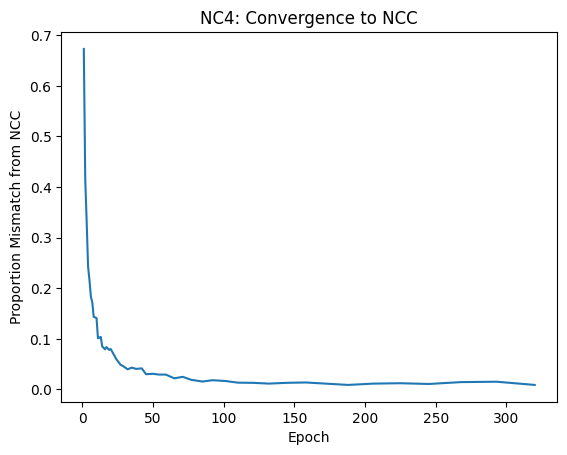

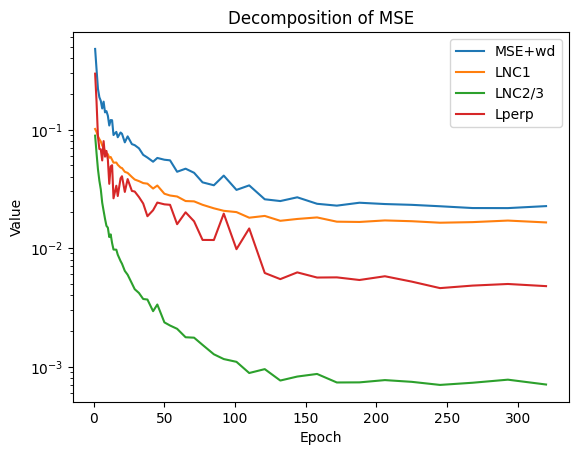

Train		Epoch: 321 [21/469 (4%)] 	Batch Loss: 0.005484 	Batch Accuracy: 0.976562:   4%|▍         | 21/469 [00:03<01:11,  6.23it/s]
Train		Epoch: 322 [21/469 (4%)] 	Batch Loss: 0.003660 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:07,  6.66it/s]
Train		Epoch: 323 [21/469 (4%)] 	Batch Loss: 0.003601 	Batch Accuracy: 1.000000:   4%|▍         | 21/469 [00:03<01:05,  6.84it/s]
Train		Epoch: 324 [21/469 (4%)] 	Batch Loss: 0.004690 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:06,  6.75it/s]
Train		Epoch: 325 [21/469 (4%)] 	Batch Loss: 0.004941 	Batch Accuracy: 0.992188:   4%|▍         | 21/469 [00:03<01:08,  6.58it/s]
Train		Epoch: 326 [21/469 (4%)] 	Batch Loss: 0.004554 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:09,  6.47it/s]
Train		Epoch: 327 [21/469 (4%)] 	Batch Loss: 0.004991 	Batch Accuracy: 0.984375:   4%|▍         | 21/469 [00:03<01:06,  6.71it/s]
Train		Epoch: 328 [21/469 (4%)] 	Batch Loss: 0.006260 	Batch Accuracy: 1.000000:   4%|▍   

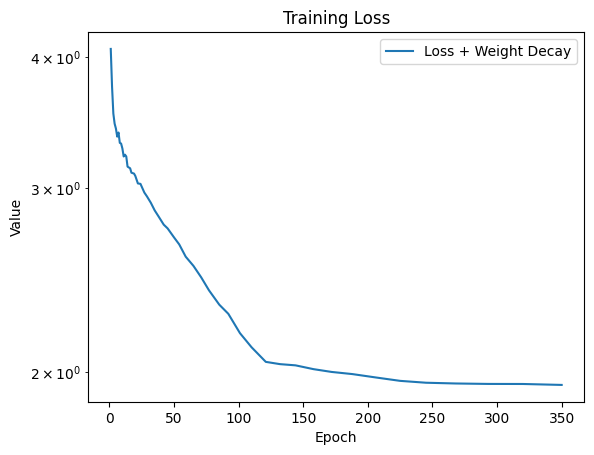

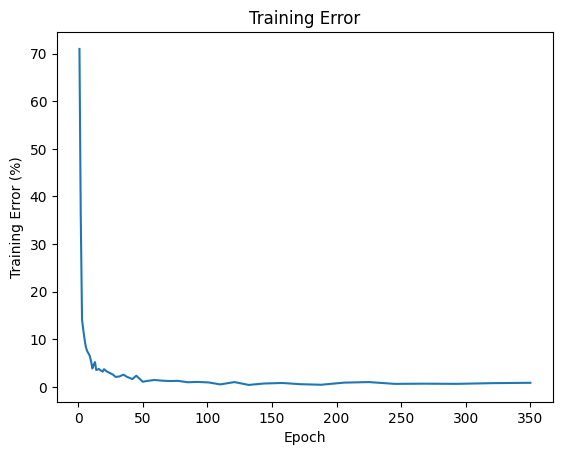

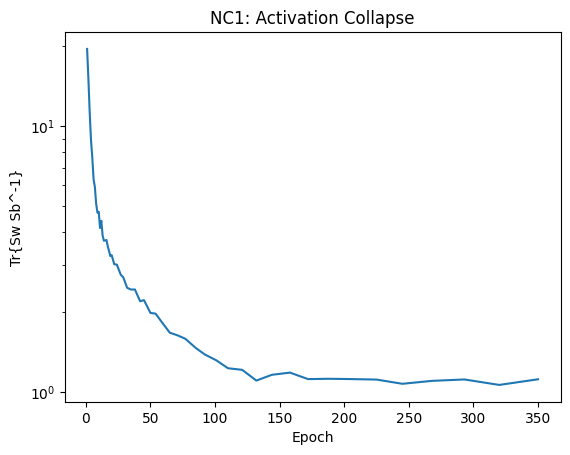

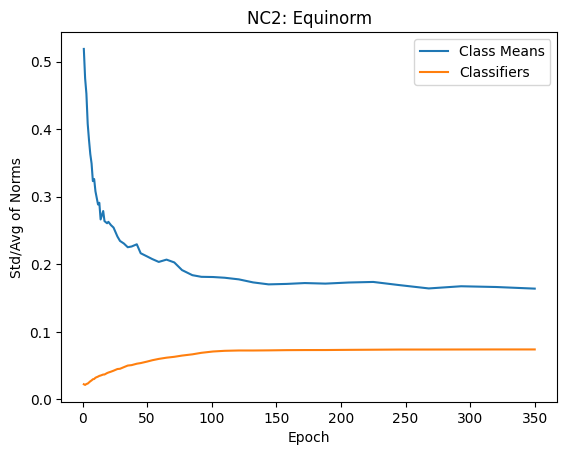

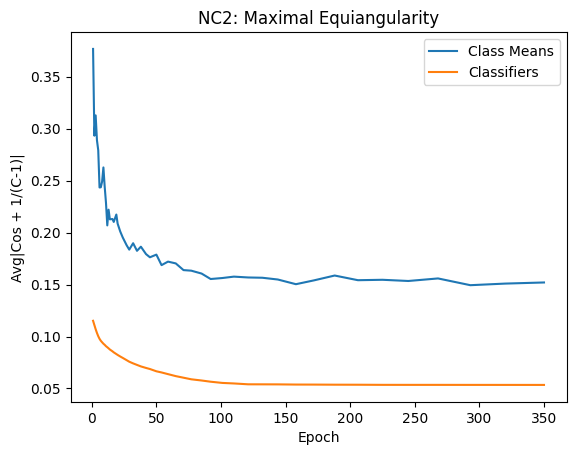

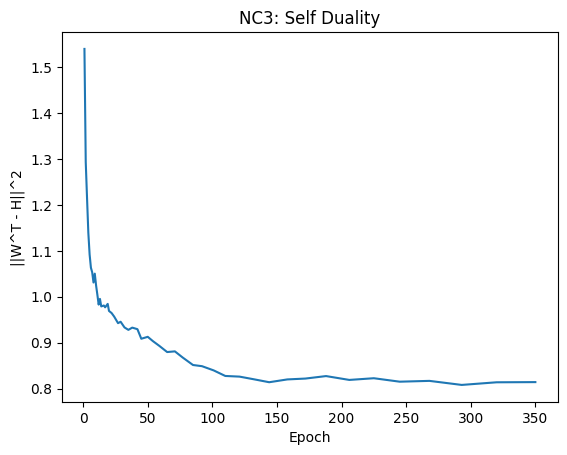

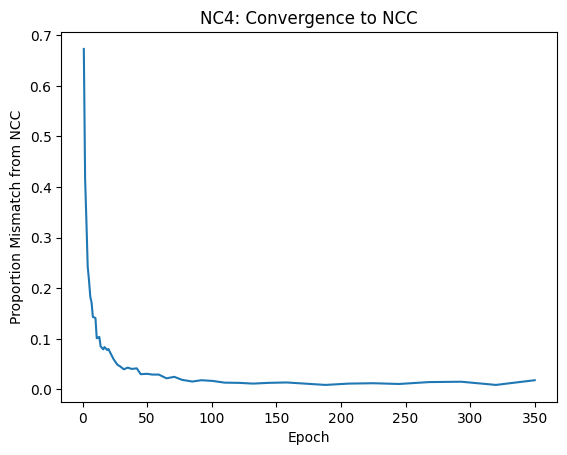

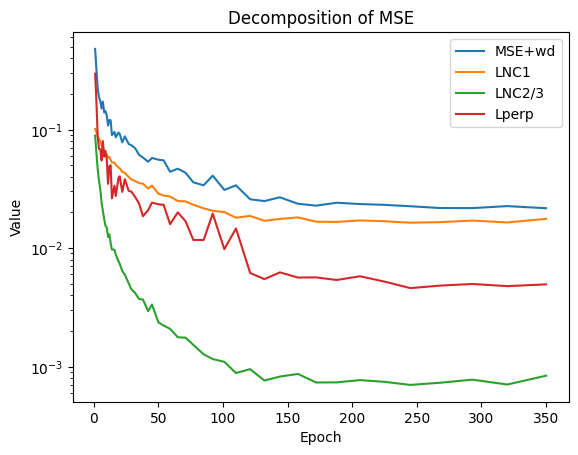

In [4]:
model = models.resnet18(pretrained=False, num_classes=C)
model.conv1 = nn.Conv2d(input_ch, model.conv1.weight.shape[0], 3, 1, 1, bias=False) # Small dataset filter size used by He et al. (2015)
model.maxpool = nn.MaxPool2d(kernel_size=1, stride=1, padding=0)
model = model.to(device)

class features:
    pass

def hook(self, input, output):
    features.value = input[0].clone()

# register hook that saves last-layer input into features
classifier = model.fc
classifier.register_forward_hook(hook)

transform = transforms.Compose([transforms.Pad((padded_im_size - im_size)//2),
                                transforms.ToTensor(),
                                transforms.Normalize(0.1307,0.3081)])

train_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=True, download=True, transform=transform),
    batch_size=batch_size, shuffle=True)

analysis_loader = torch.utils.data.DataLoader(
    datasets.MNIST('../data', train=True, download=True, transform=transform),
    batch_size=batch_size, shuffle=True)

if loss_name == 'CrossEntropyLoss':
  criterion = nn.CrossEntropyLoss()
  criterion_summed = nn.CrossEntropyLoss(reduction='sum')
elif loss_name == 'MSELoss':
  criterion = nn.MSELoss()
  criterion_summed = nn.MSELoss(reduction='sum')

optimizer = optim.SGD(model.parameters(),
                      lr=lr,
                      momentum=momentum,
                      weight_decay=weight_decay)

lr_scheduler = optim.lr_scheduler.MultiStepLR(optimizer,
                                              milestones=epochs_lr_decay,
                                              gamma=lr_decay)

class graphs:
  def __init__(self):
    self.accuracy     = []
    self.loss         = []
    self.reg_loss     = []

    # NC1
    self.Sw_invSb     = []

    # NC2
    self.norm_M_CoV   = []
    self.norm_W_CoV   = []
    self.cos_M        = []
    self.cos_W        = []

    # NC3
    self.W_M_dist     = []

    # NC4
    self.NCC_mismatch = []

    # Decomposition
    self.MSE_wd_features = []
    self.LNC1 = []
    self.LNC23 = []
    self.Lperp = []
graphs = graphs()

cur_epochs = []
for epoch in range(1, epochs + 1):
    train(model, criterion, device, C, train_loader, optimizer, epoch)
    lr_scheduler.step()

    if epoch in epoch_list:
        cur_epochs.append(epoch)
        analysis(graphs, model, criterion_summed, device, C, analysis_loader)

        plt.figure(1)
        plt.semilogy(cur_epochs, graphs.reg_loss)
        plt.legend(['Loss + Weight Decay'])
        plt.xlabel('Epoch')
        plt.ylabel('Value')
        plt.title('Training Loss')

        plt.figure(2)
        plt.plot(cur_epochs, 100*(1 - np.array(graphs.accuracy)))
        plt.xlabel('Epoch')
        plt.ylabel('Training Error (%)')
        plt.title('Training Error')

        plt.figure(3)
        plt.semilogy(cur_epochs, graphs.Sw_invSb)
        plt.xlabel('Epoch')
        plt.ylabel('Tr{Sw Sb^-1}')
        plt.title('NC1: Activation Collapse')

        plt.figure(4)
        plt.plot(cur_epochs, graphs.norm_M_CoV)
        plt.plot(cur_epochs, graphs.norm_W_CoV)
        plt.legend(['Class Means','Classifiers'])
        plt.xlabel('Epoch')
        plt.ylabel('Std/Avg of Norms')
        plt.title('NC2: Equinorm')

        plt.figure(5)
        plt.plot(cur_epochs, graphs.cos_M)
        plt.plot(cur_epochs, graphs.cos_W)
        plt.legend(['Class Means','Classifiers'])
        plt.xlabel('Epoch')
        plt.ylabel('Avg|Cos + 1/(C-1)|')
        plt.title('NC2: Maximal Equiangularity')

        plt.figure(6)
        plt.plot(cur_epochs,graphs.W_M_dist)
        plt.xlabel('Epoch')
        plt.ylabel('||W^T - H||^2')
        plt.title('NC3: Self Duality')

        plt.figure(7)
        plt.plot(cur_epochs,graphs.NCC_mismatch)
        plt.xlabel('Epoch')
        plt.ylabel('Proportion Mismatch from NCC')
        plt.title('NC4: Convergence to NCC')

        # Plot decomposition of MSE loss
        if loss_name == 'MSELoss':
          plt.figure(8)
          plt.semilogy(cur_epochs, graphs.MSE_wd_features)
          plt.semilogy(cur_epochs, graphs.LNC1)
          plt.semilogy(cur_epochs, graphs.LNC23)
          plt.semilogy(cur_epochs, graphs.Lperp)
          plt.legend(['MSE+wd', 'LNC1', 'LNC2/3', 'Lperp'])
          plt.xlabel('Epoch')
          plt.ylabel('Value')
          plt.title('Decomposition of MSE')

        plt.show()

In [5]:
l_results = [graphs.reg_loss,
             100*(1 - np.array(graphs.accuracy)),
             graphs.Sw_invSb,
             graphs.norm_M_CoV,
             graphs.norm_W_CoV,
             graphs.cos_M,
             graphs.cos_W,
             graphs.W_M_dist,
             graphs.NCC_mismatch
            ]

In [6]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [7]:
import joblib
joblib.dump(l_results, '/content/drive/MyDrive/results.joblib')

['/content/drive/MyDrive/results.joblib']